<a href="https://www.kaggle.com/code/mateusbaldamota/eeg-psychiatric-disorders-using-ann?scriptVersionId=208869244" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

| Description

Authors of notebook: Mateus Balda and Alessandro Bof

Reference paper and dataset: https://www.frontiersin.org/journals/psychiatry/articles/10.3389/fpsyt.2021.707581/full

| Notebook structure
0. Setup and Imports  
1. Utility Functions  
2. Data Loading and Preprocessing  
3. Data Preparation for Training  
4. Model Definition  
5. Training and Evaluation  
6. Results
7. Conclusions, Problems, and Limitations

| Training
1. Multiclass classification for `y` specific.disorder
2. Balancing using BorderlineSMOTE for minority classes
3. Training across the 21 subsets

## | 0. Setup and Imports

In [1]:
!pip install -q torchsummary;
!pip install -q torchviz;
!pip install -q imbalanced-learn==0.12.4;

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 87.2 MB/s eta 0:00:00:00:0100:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pylibcugraph-cu12 24.12.0 requires pylibraft-cu12==24.12.*, but you have pylibraft-cu12 25.2.0 which is incompatible.
pylibcugraph-cu12 24.12.0 requires rmm-cu12==24.12.*, but you have 

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

from IPython.display import FileLink, display, HTML
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.impute import KNNImputer

import torch
import torch.nn as nn
import torch.nn.init as init
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchsummary import summary
from torchviz import make_dot

from imblearn.over_sampling import BorderlineSMOTE

from warnings import filterwarnings
filterwarnings('ignore')

torch.__version__

'2.5.1+cu124'

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [4]:
np.random.seed(123)
torch.manual_seed(123)

## | 1. Utility Functions

### 1. OUTLIERS

In [5]:
def detect_outliers_summary(df):
    outliers_summary = {}

    for col in df.select_dtypes(include=['float64', 'int64']).columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_limit = Q1 - 1.5 * IQR
        upper_limit = Q3 + 1.5 * IQR

        outliers = df[(df[col] < lower_limit) | (df[col] > upper_limit)][col]
        
        outliers_summary[col] = {
            'num_outliers': len(outliers),
            'percent_outliers': len(outliers) / len(df) * 100,
            'outliers': outliers.tolist(),
            'lower_limit': lower_limit,
            'upper_limit': upper_limit
        }

    return pd.DataFrame(outliers_summary).T


def treat_outliers_iqr(df, column, factor=1.5):
    Q1 = np.percentile(df[column], 25)
    Q3 = np.percentile(df[column], 75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - factor * IQR
    upper_bound = Q3 + factor * IQR
    
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    
    df[column] = np.clip(df[column], lower_bound, upper_bound)
        
    return _, outliers

### 2. NANS

In [6]:
def remove_missing_columns(df, threshold=0.5):
    limit = int(threshold * len(df))
    df = df.dropna(thresh=limit, axis=1)
    return df
    
def find_most_null_column(df, threshold=0.5):
    null_ratios = df.isnull().mean()
    for col, ration in null_ratios.items():
        if ration > threshold:
            return col
    return None

def analyze_missing_values(df):
    missing_values = df.isnull().sum()
    missing_values = missing_values[missing_values > 0]
    total_number_nans = df.isnull().sum().sum()
    
    return missing_values, total_number_nans

def handle_nans(df):
    columns_with_nans = df.columns[df.isnull().any()].tolist()
    
    knn_imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
    
    df_imputed = pd.DataFrame(knn_imputer.fit_transform(df[columns_with_nans]),
                                columns=columns_with_nans)
    
    df[columns_with_nans] = df_imputed[columns_with_nans]
    
    return df

### 3. SETS & SUBSETS

In [7]:
class Sets:
    # AB = PSD (Power Spectral Density) 19 * 6
    # COH = FC (Functional Connectivity) 171 * 6
    
    def __init__(self, 
                 dataframe: pd.DataFrame,
                 quantitative_features: list[str],
                #  qualitative_features: list[str],
                #  target_main: str,
                 target_specific: str
                 ):
        
        if not isinstance(dataframe, pd.DataFrame):
            raise ValueError("The parameter must be a pandas DataFrame")
        
        self.df = dataframe.copy()
        self.quantitative_features = self.df[quantitative_features]
        # self.qualitative_features = self.df[qualitative_features]
        # self.target_main = self.df[[target_main]]
        self.target_specific = self.df[[target_specific]]
        self.df_ab_psd = None
        self.df_coh_fc = None
        self.df_ab_psd_coh_fc = None
        #self.dfs_bands = {}
        
        self.__create_df_psd()
        self.__create_df_fc()
        self.__create_union_psd_fc()

    # 19 (6 bands)
    def __create_df_psd(self):
        columns_AB = [col for col in self.df.columns if col.startswith('AB')]
        self.df_ab_psd = self.df[columns_AB]
    
    # 171 (6 bands)
    def __create_df_fc(self):
        columns_COH = [col for col in self.df.columns if col.startswith('COH')]
        self.df_coh_fc = self.df[columns_COH]
        
    def __create_union_psd_fc(self):
        if self.df_ab_psd is not None and self.df_coh_fc is not None:
            self.df_ab_psd_coh_fc = pd.concat([self.df_ab_psd, self.df_coh_fc], axis=1)
        else:
            raise ValueError("Subsets AB and COH were not created correctly")

    def create_dfs_bands(self, bands: list[str] = None, df: pd.DataFrame = None):
        dfs_bands = {}
        
        if bands is None:
            bands = ['delta', 'theta', 'alpha', 'beta', 'highbeta','gamma']
        
        for band in bands:
            columns_band = [col for col in df.columns if f'.{band}.' in col]
            if columns_band:
                dfs_bands[band] = df[columns_band]
        
        return dfs_bands


## | 2. Data Loading and Preprocessing

In [8]:
df = pd.read_csv('../input/eeg-psychiatric-disorders-dataset/EEG.machinelearing_data_BRMH.csv')
df.shape

(945, 1149)

In [9]:
# Checking / imputing Nan

output1 = analyze_missing_values(df)
output2 = find_most_null_column(df)
df = remove_missing_columns(df)
output3 = analyze_missing_values(df)
df = handle_nans(df)

display(output1)
display(HTML('<hr>'))
display(output2)
display(HTML('<hr>'))
display(output3)
display(df.shape)
display(HTML('<hr>'))
display(df.isna().sum().sum())
display(df)

(education        15
 IQ               13
 Unnamed: 122    945
 dtype: int64,
 973)

'Unnamed: 122'

(education    15
 IQ           13
 dtype: int64,
 28)

(945, 1148)

0

,no.,sex,age,eeg.date,education,IQ,main.disorder,specific.disorder,AB.A.delta.a.FP1,AB.A.delta.b.FP2,...,COH.F.gamma.o.Pz.p.P4,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2
0,1,M,57.0,2012.8.30,13.43871,101.580472,Addictive disorder,Alcohol use disorder,35.998557,21.717375,...,55.989192,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029
1,2,M,37.0,2012.9.6,6.00000,120.000000,Addictive disorder,Alcohol use disorder,13.425118,11.002916,...,45.595619,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261
2,3,M,32.0,2012.9.10,16.00000,113.000000,Addictive disorder,Alcohol use disorder,29.941780,27.544684,...,99.475453,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799
3,4,M,35.0,2012.10.8,18.00000,126.000000,Addictive disorder,Alcohol use disorder,21.496226,21.846832,...,59.986561,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873
4,5,M,36.0,2012.10.18,16.00000,112.000000,Addictive disorder,Alcohol use disorder,37.775667,33.607679,...,61.462720,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
940,941,M,22.0,2014.8.28,13.00000,116.000000,Healthy control,Healthy control,41.851823,36.771496,...,82.905657,34.850706,63.970519,63.982003,51.244725,62.203684,62.062237,31.013031,31.183413,98.325230
941,942,M,26.0,2014.9.19,13.00000,118.000000,Healthy control,Healthy control,18.986856,19.401387,...,65.917918,66.700117,44.756285,49.787513,98.905995,54.021304,93.902401,52.740396,92.807331,56.320868
942,943,M,26.0,2014.9.27,16.00000,113.000000,Healthy control,Healthy control,28.781317,32.369230,...,61.040959,27.632209,45.552852,33.638817,46.690983,19.382928,41.050717,7.045821,41.962451,19.092111
943,944,M,24.0,2014.9.20,13.00000,107.000000,Healthy control,Healthy control,19.929100,25.196375,...,99.113664,48.328934,41.248470,28.192238,48.665743,42.007147,28.735945,27.176500,27.529522,20.028446


In [10]:
# detecting outliers

outliers_summary = detect_outliers_summary(df)
outliers_summary.to_csv('outliers_summary.csv', index=True)
outliers_summary['num_outliers'].sum()

26452

In [11]:
X = df.iloc[:,8:]
# target_main = df['main.disorder']
target_specific = df['specific.disorder']
quantitative_features = df.loc[:, ['age', 'education', 'IQ']]
sex = df['sex']

X.shape, target_specific.shape, quantitative_features.shape, sex.shape

((945, 1140), (945,), (945, 3), (945,))

In [12]:
column_names = np.unique(target_specific).tolist()
pd.DataFrame(np.unique(target_specific))

,0
0,Acute stress disorder
1,Adjustment disorder
2,Alcohol use disorder
3,Behavioral addiction disorder
4,Bipolar disorder
5,Depressive disorder
6,Healthy control
7,Obsessive compulsitve disorder
8,Panic disorder
9,Posttraumatic stress disorder


In [13]:
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(target_specific)
y_encoded = y_encoded.astype(np.float32)
(pd.DataFrame(y_encoded)).value_counts()

0   
5.0     199
10.0    117
6.0      95
3.0      93
2.0      93
4.0      67
8.0      59
9.0      52
11.0     48
7.0      46
0.0      38
1.0      38
Name: count, dtype: int64

In [14]:
X_concated = pd.concat([quantitative_features, X], axis=1)
X_concated

,age,education,IQ,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,...,COH.F.gamma.o.Pz.p.P4,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2
0,57.0,13.43871,101.580472,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,...,55.989192,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029
1,37.0,6.00000,120.000000,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,...,45.595619,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261
2,32.0,16.00000,113.000000,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,...,99.475453,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799
3,35.0,18.00000,126.000000,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,...,59.986561,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873
4,36.0,16.00000,112.000000,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,...,61.462720,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
940,22.0,13.00000,116.000000,41.851823,36.771496,43.671792,36.860889,24.732236,23.607823,23.288260,...,82.905657,34.850706,63.970519,63.982003,51.244725,62.203684,62.062237,31.013031,31.183413,98.325230
941,26.0,13.00000,118.000000,18.986856,19.401387,27.586436,20.194732,19.407491,20.216570,16.465027,...,65.917918,66.700117,44.756285,49.787513,98.905995,54.021304,93.902401,52.740396,92.807331,56.320868
942,26.0,16.00000,113.000000,28.781317,32.369230,11.717778,23.134370,26.209302,25.484497,22.586688,...,61.040959,27.632209,45.552852,33.638817,46.690983,19.382928,41.050717,7.045821,41.962451,19.092111
943,24.0,13.00000,107.000000,19.929100,25.196375,14.445391,16.453456,16.590649,16.007279,18.909188,...,99.113664,48.328934,41.248470,28.192238,48.665743,42.007147,28.735945,27.176500,27.529522,20.028446


In [15]:
# class balancing 

borderline_smote = BorderlineSMOTE(k_neighbors=3, random_state=42)
X_resampled, y_resampled = borderline_smote.fit_resample(X_concated, y_encoded)

display(X_resampled)
display((pd.DataFrame(y_resampled)).value_counts())

,age,education,IQ,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,...,COH.F.gamma.o.Pz.p.P4,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2
0,57.000000,13.438710,101.580472,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,...,55.989192,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029
1,37.000000,6.000000,120.000000,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,...,45.595619,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261
2,32.000000,16.000000,113.000000,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,...,99.475453,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799
3,35.000000,18.000000,126.000000,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,...,59.986561,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873
4,36.000000,16.000000,112.000000,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,...,61.462720,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2383,34.736119,15.237509,111.054308,16.950099,15.806375,17.571875,12.654431,14.531947,12.991123,21.506304,...,76.684970,51.058554,49.960617,57.327349,60.733013,37.485499,56.519317,34.890276,66.505712,56.510742
2384,20.764442,12.000000,83.067034,12.032810,15.183180,11.310398,17.318257,13.089068,11.708724,8.835142,...,75.008208,69.068665,64.928338,60.419191,95.542647,47.880951,79.127498,43.087243,77.227010,53.343043
2385,35.674508,12.677449,76.612754,14.305012,15.372337,11.318163,10.580139,11.970353,10.935384,9.407413,...,77.055094,68.046083,69.398127,62.598212,77.991443,55.847623,66.866801,51.999742,77.649643,66.846120
2386,24.747335,10.302660,100.276056,19.567698,20.246926,16.018573,21.665064,22.700813,21.230204,15.098534,...,49.528997,25.776552,29.374847,30.441522,55.911730,26.108059,50.773484,18.165041,67.841070,35.241303


0   
0.0     199
1.0     199
2.0     199
3.0     199
4.0     199
5.0     199
6.0     199
7.0     199
8.0     199
9.0     199
10.0    199
11.0    199
Name: count, dtype: int64

In [17]:
y_resampled = pd.Series(y_resampled, name='specific.disorder')
display(y_resampled)
display(pd.DataFrame(y_resampled).value_counts())


0        2.0
1        2.0
2        2.0
3        2.0
4        2.0
        ... 
2383    11.0
2384    11.0
2385    11.0
2386    11.0
2387    11.0
Name: specific.disorder, Length: 2388, dtype: float32

specific.disorder
0.0                  199
1.0                  199
2.0                  199
3.0                  199
4.0                  199
5.0                  199
6.0                  199
7.0                  199
8.0                  199
9.0                  199
10.0                 199
11.0                 199
Name: count, dtype: int64

In [18]:
df_union = pd.concat([X_resampled, pd.DataFrame(y_resampled)], axis=1)

display(df_union.shape)
display(df_union.head())
display(df.isna().sum().sum())

(2388, 1144)

,age,education,IQ,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,...,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2,specific.disorder
0,57.0,13.43871,101.580472,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,...,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029,2.0
1,37.0,6.00000,120.000000,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,...,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261,2.0
2,32.0,16.00000,113.000000,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,...,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799,2.0
3,35.0,18.00000,126.000000,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,...,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873,2.0
4,36.0,16.00000,112.000000,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,...,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662,2.0


0

In [19]:
# set and subset separation

sets = Sets(dataframe=df_union, 
            quantitative_features=['age', 'education', 'IQ'],
            target_specific='specific.disorder'
            )

In [20]:
df_psd_all_bands = sets.df_ab_psd
df_fc_all_bands = sets.df_coh_fc
df_psd_fc_all_bands = sets.df_ab_psd_coh_fc
quantitative_features = sets.quantitative_features
target_specific = sets.target_specific

dfs_bands_psd = sets.create_dfs_bands(df=df_psd_all_bands)
dfs_bands_fc = sets.create_dfs_bands(df=df_fc_all_bands)
dfs_bands_psd_fc = sets.create_dfs_bands(df=df_psd_fc_all_bands)

In [21]:
df_dict_psd_all_band = {
    'psd_all_bands': df_psd_all_bands,
}

df_dict_fc_all_band = {
    'fc_all_bands': df_fc_all_bands,
}

df_dict_psd_fc_all_band = {
    'psd_fc_all_bands': df_psd_fc_all_bands,
}

df_dict_psd_band = {
    'psd_delta': dfs_bands_psd['delta'],
    'psd_theta': dfs_bands_psd['theta'],
    'psd_alpha': dfs_bands_psd['alpha'],
    'psd_beta': dfs_bands_psd['beta'],
    'psd_highbeta': dfs_bands_psd['highbeta'],
    'psd_gamma': dfs_bands_psd['gamma'],
}

df_dict_fc_band = {
    'fc_delta': dfs_bands_fc['delta'],
    'fc_theta': dfs_bands_fc['theta'],
    'fc_alpha': dfs_bands_fc['alpha'],
    'fc_beta': dfs_bands_fc['beta'],
    'fc_highbeta': dfs_bands_fc['highbeta'],
    'fc_gamma': dfs_bands_fc['gamma'],
}

df_dict_psd_fc_band = {
    'psd_fc_delta': dfs_bands_psd_fc['delta'],
    'psd_fc_theta': dfs_bands_psd_fc['theta'],
    'psd_fc_alpha': dfs_bands_psd_fc['alpha'],
    'psd_fc_beta': dfs_bands_psd_fc['beta'],
    'psd_fc_highbeta': dfs_bands_psd_fc['highbeta'],
    'psd_fc_gamma': dfs_bands_psd_fc['gamma'],
}

In [22]:
for dataset_name, df in df_dict_psd_all_band.items():
    print(f"{dataset_name}: {df.shape} shape")
    display(df.head())
    print("\n")

psd_all_bands: (2388, 114) shape


,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,AB.A.delta.h.T3,AB.A.delta.i.C3,AB.A.delta.j.Cz,...,AB.F.gamma.j.Cz,AB.F.gamma.k.C4,AB.F.gamma.l.T4,AB.F.gamma.m.T5,AB.F.gamma.n.P3,AB.F.gamma.o.Pz,AB.F.gamma.p.P4,AB.F.gamma.q.T6,AB.F.gamma.r.O1,AB.F.gamma.s.O2
0,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,29.891368,22.402246,22.582176,...,1.993727,1.765493,1.464281,1.501948,1.707307,1.553448,1.552658,1.388662,1.592717,1.806598
1,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,9.975238,14.834740,10.950564,...,0.903383,0.931967,0.437117,0.930843,1.234874,1.373268,1.411808,1.140695,1.118041,3.162143
2,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,12.775574,21.686306,18.367666,...,1.096713,1.691152,1.505663,1.133891,1.661768,1.403429,1.349457,1.270525,1.408471,1.454618
3,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,8.063191,11.015078,11.639560,...,1.115040,1.122776,2.128138,1.648217,1.147666,1.049152,1.131654,1.415856,1.391048,1.527403
4,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,9.434306,15.244523,17.041979,...,1.193191,2.320845,3.562820,1.441662,1.018804,1.274009,2.350806,2.307730,2.129431,3.766860


## | 3. Data Preparation for Training

In [23]:
class EEGDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

In [24]:
train_ratio = 0.7
val_ratio = 0.15

output_dim = len(np.unique(y_encoded))

# params 
neurons_psd_all_bands = [
    [456, 228, 114, 57, 28],
    [256, 128, 64, 32, 16],
    [114, 57, 28, 14, 7], #
    [96, 48, 24, 12, 6],
]
neurons_fc_all_bands = [
    [2048, 1024, 512, 256, 128],
    [1536, 768, 384, 192, 96],
    [1026, 513, 256, 128, 64], #
    [896, 448, 224, 112, 56],
]
neurons_psd_fc_all_bands = [
    [2048, 1024, 512, 256, 128],
    [1536, 768, 384, 192, 96],
    [1140, 570, 285, 142, 71], #
    [896, 448, 224, 112, 56],
]
neurons_psd_per_band = [
    [95, 64, 32, 16, 8],
    [64, 32, 16, 8, 4],
    [48, 24, 12, 6, 3],
    [19, 16, 8, 4, 2], #
]
neurons_fc_per_band = [
    [684, 342, 171, 85, 42],
    [171, 114, 76, 38, 19], #
    [128, 85, 57, 28, 14],
]
neurons_psd_fc_per_band = [
    [760, 380, 190, 95, 48],
    [256, 128, 64, 32, 16],
    [190, 127, 85, 42, 21], #
    [128, 85, 57, 28, 14],
]

dropout_rates = [0.10, 0.20, 0.30]
learning_rates = [0.0001, 0.001, 0.01, 0.1]
batch_sizes = [32, 64, 84]
weight_decays = [0.0001, 0.001, 0.01]  

num_epochs = 500

In [25]:
# Method to prepare datasets

def prepare_datasets(
    X, y, 
    train_ratio = train_ratio,
    val_ratio = val_ratio,
    batch_size = batch_sizes[0], 
    scaler = None
):
    
    if scaler is None:
        scaler = StandardScaler() 
    
    X_scaled = scaler.fit_transform(X)

    dataset = EEGDataset(X_scaled, y)
    
    total_size = len(dataset)
    train_size = int(train_ratio * total_size) # 70% train
    val_size = int(val_ratio * total_size) # 15% val
    test_size = total_size - train_size - val_size # 15% test

    train_dataset, val_dataset, test_dataset = random_split(
        dataset, [train_size, val_size, test_size]
    )
    
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    
    return {
        'loaders': {
            'train': train_loader,
            'val': val_loader,
            'test': test_loader,
        },
        'shape_X_scaled': X_scaled.shape
    }

## | 4. Model Definition 
Neural network architecture

In [26]:
class EEGANNClassifier(nn.Module):
    def __init__(self, input_dim, output_dim, neurons, dropout=0.10):
        super(EEGANNClassifier, self).__init__()
        
        self.layer1 = nn.Linear(input_dim, neurons[0])
        self.layer2 = nn.Linear(neurons[0], neurons[1])
        self.layer3 = nn.Linear(neurons[1], neurons[2])
        self.layer4 = nn.Linear(neurons[2], neurons[3])
        self.layer5 = nn.Linear(neurons[3], neurons[4])
        self.output_layer = nn.Linear(neurons[4], output_dim)

        self.bn1 = nn.BatchNorm1d(neurons[0])
        self.bn2 = nn.BatchNorm1d(neurons[1])
        self.bn3 = nn.BatchNorm1d(neurons[2])
        self.bn4 = nn.BatchNorm1d(neurons[3])
        self.bn5 = nn.BatchNorm1d(neurons[4])

        self.gelu = nn.GELU()

        self.dropout = nn.Dropout(p=dropout)
        
        init.xavier_uniform_(self.layer1.weight)
        init.xavier_uniform_(self.layer2.weight)
        init.xavier_uniform_(self.layer3.weight)
        init.xavier_uniform_(self.layer4.weight)
        init.xavier_uniform_(self.layer5.weight)
        init.xavier_uniform_(self.output_layer.weight)

    def forward(self, x):
        x = self.gelu(self.bn1(self.layer1(x))) 
        x = self.dropout(x)
        
        x = self.gelu(self.bn2(self.layer2(x)))
        x = self.dropout(x)
        
        x = self.gelu(self.bn3(self.layer3(x)))
        x = self.dropout(x)
        
        x = self.gelu(self.bn4(self.layer4(x)))
        x = self.dropout(x)
        
        x = self.gelu(self.bn5(self.layer5(x)))
        
        x = self.output_layer(x)
        
        return x

## | 5. Training and Evaluation  

In [27]:
# Method for train

def train_model(
    model,
    train_loader,
    val_loader,
    criterion,
    optimizer, 
    scheduler, 
    num_epochs = num_epochs,
    patience = 20,
    min_delta = 0.01
):
    
    best_loss = float('inf')
    early_stop_counter = 0
    train_losses = []
    val_losses = []
    val_accs = []
    final_epoch = 0

    for epoch in range(num_epochs):
        
        # ------------------- Train -------------------
        model.train()
        running_loss = 0.0

        for data in train_loader:
            inputs, labels = data
            inputs = inputs.to(device)
            
            optimizer.zero_grad()  # zero gradients

            # Forward pass
            outputs = model(inputs)
            labels = labels.to(device).long()

            # Calculate a loss
            loss = criterion(outputs, labels)
            loss.backward()  # Calculate gradients
            optimizer.step()  # Update weights

            running_loss += loss.item()

        # Average training loss
        epoch_loss = running_loss / len(train_loader)
        print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {epoch_loss:.4f}")
        train_losses.append(epoch_loss)

        # ------------------- Val -------------------
        model.eval() 
        val_loss = 0.0
        val_accuracy = 0.0

        with torch.no_grad():
            for data in val_loader:
                inputs, labels = data
                inputs = inputs.to(device)
                
                outputs = model(inputs)
                
                labels = labels.to(device).long()

                loss = criterion(outputs, labels)
                val_loss += loss.item()

                # Calculate accuracy
                _, predicted = torch.max(outputs.data, 1)
                accuracy = (predicted == labels).float().mean()
                val_accuracy += accuracy.item()

        val_loss /= len(val_loader)
        val_accuracy /= len(val_loader)

        print(f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}\n")
        val_losses.append(val_loss)
        val_accs.append(val_accuracy)

        # ------------------- Early Stopping -------------------
        if val_loss < best_loss - min_delta:
            best_loss = val_loss
            early_stop_counter = 0
        else:
            early_stop_counter += 1

        if early_stop_counter >= patience:
            print(f"Early stopping at epoch {epoch + 1}.")
            final_epoch = epoch + 1
            break 

        # update scheduler
        scheduler.step(val_loss)

    return train_losses, val_losses, val_accs, final_epoch

In [28]:
criterion = nn.CrossEntropyLoss()

In [29]:
# Methods for evaluation

def plot_training_curves(train_losses, val_losses, val_accs):
    if not (train_losses and val_losses and val_accs):
        return None

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    axs[0].plot(train_losses, label='Training Loss')
    axs[0].plot(val_losses, label='Validation Loss')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Loss')
    axs[0].legend()

    axs[1].plot(val_accs, label='Validation Accuracy')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Accuracy (%)')
    axs[1].legend()

    fig.suptitle('Training & Validation Metrics')
    fig.tight_layout()
    return fig

def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred, labels=np.arange(len(class_names)))
    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names, ax=ax)
    ax.set_xlabel('Predicted')
    ax.set_ylabel('True')
    ax.set_title('Confusion Matrix')
    fig.tight_layout()
    return fig

def plot_roc_curves(y_true, y_probs, class_names):
    fig, ax = plt.subplots(figsize=(10, 8))
    for i, class_name in enumerate(class_names):
        fpr, tpr, _ = roc_curve(y_true == i, y_probs[:, i])
        auc = roc_auc_score(y_true == i, y_probs[:, i])
        ax.plot(fpr, tpr, label=f'{class_name} (AUC = {auc:.4f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Chance (AUC = 0.5)')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('ROC Curves by Class')
    ax.legend(loc='lower right')
    fig.tight_layout()
    return fig

def compute_auc_scores(y_true, y_probs, num_classes, verbose=True):
    if num_classes is None:
        return None, None

    aucs = [roc_auc_score(y_true == i, y_probs[:, i]) for i in range(num_classes)]
    mean_auc = np.mean(aucs)

    if verbose:
        # print(f"\n📈 AUC per class: {aucs}")
        print(f"📊 Mean AUC: {mean_auc:.4f}")

    return aucs, mean_auc

def print_accuracy_report(accuracy, y_true, y_pred, class_names, verbose=True):
    report = classification_report(y_true, y_pred, target_names=class_names, digits=4)
    if verbose:
        print(f"\n✅ Test Accuracy: {accuracy:.2f}%")
        print("\n📋 Classification Report:\n", report)
    return report

In [30]:
# Method to evaluate the model

import matplotlib
matplotlib.use('Agg')

def evaluate_model(
    model,
    test_loader,
    class_names,
    train_losses=None,
    val_losses=None,
    val_accs=None,
    num_classes=None
):
    model.eval()

    fig_curves = plot_training_curves(train_losses, val_losses, val_accs)

    all_probs, all_labels = [], []
    correct, total = 0, 0

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            outputs = model(inputs)
            probs = F.softmax(outputs, dim=1)
            _, predicted = torch.max(probs, 1)

            all_probs.extend(probs.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    all_probs = np.array(all_probs)
    all_labels = np.array(all_labels)
    pred_classes = np.argmax(all_probs, axis=1)
    accuracy = 100 * correct / total

    report = print_accuracy_report(accuracy, all_labels, pred_classes, class_names)
    fig_conf = plot_confusion_matrix(all_labels, pred_classes, class_names)
    fig_roc = plot_roc_curves(all_labels, all_probs, class_names)
    aucs, mean_auc = compute_auc_scores(all_labels, all_probs, num_classes)

    return {
        "accuracy": accuracy,
        "classification_report": report,
        "aucs": aucs,
        "mean_auc": mean_auc,
        "fig_curves": fig_curves,
        "fig_conf_matrix": fig_conf,
        "fig_roc": fig_roc
    }

In [31]:
# Method for random search

import random

def random_search(
    num_trials=10,
    neurons=None,
    dropout_rates=None,
    learning_rates=None,
    batch_sizes=None,
    weight_decays=None,
    train_ratio=None,
    val_ratio=None,
    X=None,
    y_encoded=None,
    input_dim=None,
    output_dim=None,
    num_epochs=None,
    criterion=None,
):
    
    best_accuracy = 0
    best_params = {}
    best_results = {}
    training_values = {}
    
    for _ in range(num_trials):
        # Randomly select parameters
        neurons_choice = random.choice(neurons)
        dropout_choice = random.choice(dropout_rates)
        learning_rate_choice = random.choice(learning_rates)
        batch_size_choice = random.choice(batch_sizes)
        weight_decay_choice = random.choice(weight_decays)

        # Prepare datasets
        datasets = prepare_datasets(
            X=X, y=y_encoded,
            train_ratio=train_ratio,
            val_ratio=val_ratio,
            batch_size=batch_size_choice
        )

        # Create model
        model = EEGANNClassifier(
            input_dim=input_dim, 
            output_dim=output_dim, 
            neurons=neurons_choice, 
            dropout=dropout_choice
        ).to(device)

        optimizer = optim.Adam(
            model.parameters(), 
            lr=learning_rate_choice,
            weight_decay=weight_decay_choice
        )
        
        scheduler = ReduceLROnPlateau(
            optimizer,
            mode='min',
            factor = 0.1,
            patience = 3,
            min_lr = 1e-6, 
            verbose = True
        )

        # Train model
        train_losses, val_losses, val_accs, final_epoch = train_model(
            model=model,
            train_loader=datasets['loaders']['train'],
            val_loader=datasets['loaders']['val'],
            criterion=criterion,
            optimizer=optimizer,
            scheduler=scheduler,
            num_epochs=num_epochs
        )
        
        print(f'{neurons_choice} neurons, {dropout_choice} dropout, {learning_rate_choice} learning rate, {batch_size_choice} batch size, {weight_decay_choice} weight decay')

        # Evaluate model on test set
        test_results = evaluate_model(
            model=model, 
            test_loader=datasets['loaders']['test'],
            class_names=column_names,
            train_losses=train_losses,
            val_losses=val_losses,
            val_accs=val_accs,
            num_classes=output_dim,
        )
        
        display(HTML('<hr>'))
        display(datasets['shape_X_scaled'])
        display(HTML('<hr>'))
        
        if test_results['accuracy'] > best_accuracy:
            best_accuracy = test_results['accuracy']
            
            best_params = {
                'neurons': neurons_choice,
                'dropout': dropout_choice,
                'learning_rate': learning_rate_choice,
                'batch_size': batch_size_choice,
                'weight_decay': weight_decay_choice
            }
            
            best_results = {
                'final_epoch': final_epoch,
                'best_accuracy': test_results['accuracy'],
                'mean_auc': test_results['mean_auc'],
                'classification_report': test_results['classification_report'],
                'aucs': test_results['aucs'],
                'fig_curves': test_results['fig_curves'],
                'fig_conf_matrix': test_results['fig_conf_matrix'],
                'fig_roc': test_results['fig_roc']
            }
            
            training_values = {
                'train_losses': train_losses,
                'val_losses': val_losses,
                'val_accs': val_accs
            }
    
    return best_params, best_results, training_values

In [32]:
from sklearn.preprocessing import RobustScaler

scaler2 = RobustScaler()

quantitative_features_scaled = scaler2.fit_transform(quantitative_features)

quantitative_features = pd.DataFrame(quantitative_features_scaled, columns=quantitative_features.columns)

quantitative_features

,age,education,IQ
0,2.381094,0.140009,-0.019978
1,0.814435,-2.233968,0.857143
2,0.422770,0.957415,0.523810
3,0.657769,1.595691,1.142857
4,0.736102,0.957415,0.476190
...,...,...,...
2383,0.637098,0.714075,0.431158
2384,-0.457344,-0.319138,-0.901570
2385,0.710605,-0.102938,-1.208916
2386,-0.145352,-0.860824,-0.082093


In [33]:
# Method for training all subsets

def train_all_subsets(
    df_dict: dict,
    num_trials: int = 10,
    train_ratio = 0.7,
    val_ratio = 0.15,
    y=None,
    quantitative_features=None,
    neurons=None,
    dropout_rates=None,
    learning_rates=None,
    batch_sizes=None,
    weight_decays=None,
    num_epochs=500,
    criterion=nn.CrossEntropyLoss(),
):
    all_results = {}
    
    for dataset_name, df in df_dict.items():
        print(f"Training on {dataset_name}...")
        print(f"Dataset shape: {df.shape}")
        
        display(HTML('<hr>'))
        display(df.head())
        display(HTML('<hr>'))
        
        df_quantitative_features = pd.concat([quantitative_features, df], axis=1)
        
        best_params, best_results, training_values = random_search(
            num_trials=num_trials,
            neurons=neurons,
            dropout_rates=dropout_rates,
            learning_rates=learning_rates,
            batch_sizes=batch_sizes,
            weight_decays=weight_decays,
            train_ratio=train_ratio,
            val_ratio=val_ratio,
            X=df_quantitative_features,
            y_encoded=y,
            input_dim=df_quantitative_features.shape[1],
            output_dim=len(np.unique(y)),
            num_epochs=num_epochs,
            criterion=criterion
        )
        
        all_results[dataset_name] = {
            'best_params': best_params,
            'best_results': best_results,
            'training_values': training_values
        }
        
    return all_results

In [36]:
# training

all_results = train_all_subsets(
    df_dict=df_dict_psd_all_band,
    num_trials=10,
    train_ratio=train_ratio,
    val_ratio=val_ratio,
    y=y_resampled,
    neurons=neurons_psd_all_bands,
    dropout_rates=dropout_rates,
    learning_rates=learning_rates,
    batch_sizes=batch_sizes,
    weight_decays=weight_decays,
    num_epochs=num_epochs
)

all_results2 = train_all_subsets(
    df_dict=df_dict_fc_all_band,
    num_trials=10,
    train_ratio=train_ratio,
    val_ratio=val_ratio,
    y=y_resampled,
    neurons=neurons_fc_all_bands,
    dropout_rates=dropout_rates,
    learning_rates=learning_rates,
    batch_sizes=batch_sizes,
    weight_decays=weight_decays,
    num_epochs=num_epochs
)

all_results3 = train_all_subsets(
    df_dict=df_dict_psd_fc_all_band,
    num_trials=10,
    train_ratio=train_ratio,
    val_ratio=val_ratio,
    y=y_resampled,
    neurons=neurons_psd_fc_all_bands,
    dropout_rates=dropout_rates,
    learning_rates=learning_rates,
    batch_sizes=batch_sizes,
    weight_decays=weight_decays,
    num_epochs=num_epochs
)

all_results4 = train_all_subsets(
    df_dict=df_dict_psd_band,
    num_trials=10,
    train_ratio=train_ratio,
    val_ratio=val_ratio,
    y=y_resampled,
    neurons=neurons_psd_per_band,
    dropout_rates=dropout_rates,
    learning_rates=learning_rates,
    batch_sizes=batch_sizes,
    weight_decays=weight_decays,
    num_epochs=num_epochs
)

all_results5 = train_all_subsets(
    df_dict=df_dict_fc_band,
    num_trials=10,
    train_ratio=train_ratio,
    val_ratio=val_ratio,
    y=y_resampled,
    neurons=neurons_fc_per_band,
    dropout_rates=dropout_rates,
    learning_rates=learning_rates,
    batch_sizes=batch_sizes,
    weight_decays=weight_decays,
    num_epochs=num_epochs
)

all_results6 =  train_all_subsets(
    df_dict=df_dict_psd_fc_band,
    num_trials=10,
    train_ratio=train_ratio,
    val_ratio=val_ratio,
    y=y_resampled,
    neurons=neurons_psd_fc_per_band,
    dropout_rates=dropout_rates,
    learning_rates=learning_rates,
    batch_sizes=batch_sizes,
    weight_decays=weight_decays,
    num_epochs=num_epochs
)

Training on psd_all_bands...
Dataset shape: (2388, 114)


,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,AB.A.delta.h.T3,AB.A.delta.i.C3,AB.A.delta.j.Cz,...,AB.F.gamma.j.Cz,AB.F.gamma.k.C4,AB.F.gamma.l.T4,AB.F.gamma.m.T5,AB.F.gamma.n.P3,AB.F.gamma.o.Pz,AB.F.gamma.p.P4,AB.F.gamma.q.T6,AB.F.gamma.r.O1,AB.F.gamma.s.O2
0,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,29.891368,22.402246,22.582176,...,1.993727,1.765493,1.464281,1.501948,1.707307,1.553448,1.552658,1.388662,1.592717,1.806598
1,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,9.975238,14.834740,10.950564,...,0.903383,0.931967,0.437117,0.930843,1.234874,1.373268,1.411808,1.140695,1.118041,3.162143
2,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,12.775574,21.686306,18.367666,...,1.096713,1.691152,1.505663,1.133891,1.661768,1.403429,1.349457,1.270525,1.408471,1.454618
3,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,8.063191,11.015078,11.639560,...,1.115040,1.122776,2.128138,1.648217,1.147666,1.049152,1.131654,1.415856,1.391048,1.527403
4,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,9.434306,15.244523,17.041979,...,1.193191,2.320845,3.562820,1.441662,1.018804,1.274009,2.350806,2.307730,2.129431,3.766860


Epoch [1/500], Loss: 2.5274
Validation Loss: 2.4874, Validation Accuracy: 0.0983

Epoch [2/500], Loss: 2.4966
Validation Loss: 2.4517, Validation Accuracy: 0.1218

Epoch [3/500], Loss: 2.4686
Validation Loss: 2.4319, Validation Accuracy: 0.1209

Epoch [4/500], Loss: 2.4587
Validation Loss: 2.4392, Validation Accuracy: 0.1479

Epoch [5/500], Loss: 2.4372
Validation Loss: 2.4559, Validation Accuracy: 0.1053

Epoch [6/500], Loss: 2.4135
Validation Loss: 2.3981, Validation Accuracy: 0.1357

Epoch [7/500], Loss: 2.3893
Validation Loss: 2.4243, Validation Accuracy: 0.1269

Epoch [8/500], Loss: 2.4084
Validation Loss: 2.4283, Validation Accuracy: 0.1357

Epoch [9/500], Loss: 2.3818
Validation Loss: 2.3188, Validation Accuracy: 0.1774

Epoch [10/500], Loss: 2.3849
Validation Loss: 2.3927, Validation Accuracy: 0.1243

Epoch [11/500], Loss: 2.3857
Validation Loss: 2.3678, Validation Accuracy: 0.1357

Epoch [12/500], Loss: 2.3945
Validation Loss: 2.3830, Validation Accuracy: 0.1069

Epoch [13/500

(2388, 114)

Epoch [1/500], Loss: 2.6714
Validation Loss: 2.4961, Validation Accuracy: 0.0857

Epoch [2/500], Loss: 2.6373
Validation Loss: 2.4875, Validation Accuracy: 0.0810

Epoch [3/500], Loss: 2.6320
Validation Loss: 2.4876, Validation Accuracy: 0.0786

Epoch [4/500], Loss: 2.6036
Validation Loss: 2.4838, Validation Accuracy: 0.0881

Epoch [5/500], Loss: 2.5929
Validation Loss: 2.4806, Validation Accuracy: 0.1024

Epoch [6/500], Loss: 2.5984
Validation Loss: 2.4701, Validation Accuracy: 0.1000

Epoch [7/500], Loss: 2.5866
Validation Loss: 2.4717, Validation Accuracy: 0.1000

Epoch [8/500], Loss: 2.5560
Validation Loss: 2.4604, Validation Accuracy: 0.0976

Epoch [9/500], Loss: 2.5599
Validation Loss: 2.4552, Validation Accuracy: 0.1000

Epoch [10/500], Loss: 2.5463
Validation Loss: 2.4575, Validation Accuracy: 0.1095

Epoch [11/500], Loss: 2.5402
Validation Loss: 2.4582, Validation Accuracy: 0.1071

Epoch [12/500], Loss: 2.5185
Validation Loss: 2.4552, Validation Accuracy: 0.1048

Epoch [13/500

(2388, 114)

Epoch [1/500], Loss: 2.5020
Validation Loss: 2.4455, Validation Accuracy: 0.1172

Epoch [2/500], Loss: 2.4257
Validation Loss: 2.4052, Validation Accuracy: 0.1467

Epoch [3/500], Loss: 2.3731
Validation Loss: 2.4170, Validation Accuracy: 0.1276

Epoch [4/500], Loss: 2.3504
Validation Loss: 2.3326, Validation Accuracy: 0.1562

Epoch [5/500], Loss: 2.3081
Validation Loss: 2.3251, Validation Accuracy: 0.1745

Epoch [6/500], Loss: 2.2776
Validation Loss: 2.2986, Validation Accuracy: 0.1901

Epoch [7/500], Loss: 2.2352
Validation Loss: 2.2656, Validation Accuracy: 0.1858

Epoch [8/500], Loss: 2.2266
Validation Loss: 2.2704, Validation Accuracy: 0.2196

Epoch [9/500], Loss: 2.2016
Validation Loss: 2.1989, Validation Accuracy: 0.2682

Epoch [10/500], Loss: 2.1405
Validation Loss: 2.1945, Validation Accuracy: 0.2804

Epoch [11/500], Loss: 2.1612
Validation Loss: 2.1810, Validation Accuracy: 0.2465

Epoch [12/500], Loss: 2.1222
Validation Loss: 2.2412, Validation Accuracy: 0.2135

Epoch [13/500

(2388, 114)

Epoch [1/500], Loss: 2.5877
Validation Loss: 2.3641, Validation Accuracy: 0.1955

Epoch [2/500], Loss: 2.3900
Validation Loss: 2.2964, Validation Accuracy: 0.2403

Epoch [3/500], Loss: 2.2558
Validation Loss: 2.1960, Validation Accuracy: 0.2712

Epoch [4/500], Loss: 2.1289
Validation Loss: 2.1228, Validation Accuracy: 0.3314

Epoch [5/500], Loss: 2.0415
Validation Loss: 2.0358, Validation Accuracy: 0.3485

Epoch [6/500], Loss: 1.9593
Validation Loss: 1.9384, Validation Accuracy: 0.3948

Epoch [7/500], Loss: 1.8411
Validation Loss: 1.8494, Validation Accuracy: 0.4491

Epoch [8/500], Loss: 1.7670
Validation Loss: 1.7802, Validation Accuracy: 0.4496

Epoch [9/500], Loss: 1.6811
Validation Loss: 1.7035, Validation Accuracy: 0.4829

Epoch [10/500], Loss: 1.6099
Validation Loss: 1.6479, Validation Accuracy: 0.4872

Epoch [11/500], Loss: 1.5395
Validation Loss: 1.6054, Validation Accuracy: 0.4924

Epoch [12/500], Loss: 1.4491
Validation Loss: 1.5115, Validation Accuracy: 0.5368

Epoch [13/500

(2388, 114)

Epoch [1/500], Loss: 2.5097
Validation Loss: 2.4908, Validation Accuracy: 0.0764

Epoch [2/500], Loss: 2.4794
Validation Loss: 2.4694, Validation Accuracy: 0.1311

Epoch [3/500], Loss: 2.4776
Validation Loss: 2.4792, Validation Accuracy: 0.0990

Epoch [4/500], Loss: 2.4705
Validation Loss: 2.4301, Validation Accuracy: 0.1207

Epoch [5/500], Loss: 2.4640
Validation Loss: 2.4211, Validation Accuracy: 0.1259

Epoch [6/500], Loss: 2.4649
Validation Loss: 2.4445, Validation Accuracy: 0.0938

Epoch [7/500], Loss: 2.4563
Validation Loss: 2.4605, Validation Accuracy: 0.1181

Epoch [8/500], Loss: 2.4413
Validation Loss: 2.4333, Validation Accuracy: 0.1311

Epoch [9/500], Loss: 2.4498
Validation Loss: 2.4097, Validation Accuracy: 0.0894

Epoch [10/500], Loss: 2.4385
Validation Loss: 2.4276, Validation Accuracy: 0.1120

Epoch [11/500], Loss: 2.4473
Validation Loss: 2.4933, Validation Accuracy: 0.0842

Epoch [12/500], Loss: 2.4401
Validation Loss: 2.5101, Validation Accuracy: 0.1120

Epoch [13/500

(2388, 114)

Epoch [1/500], Loss: 2.5337
Validation Loss: 2.4975, Validation Accuracy: 0.0547

Epoch [2/500], Loss: 2.4915
Validation Loss: 2.5095, Validation Accuracy: 0.0807

Epoch [3/500], Loss: 2.4967
Validation Loss: 2.4817, Validation Accuracy: 0.0816

Epoch [4/500], Loss: 2.5035
Validation Loss: 4.8067, Validation Accuracy: 0.1007

Epoch [5/500], Loss: 2.5023
Validation Loss: 2.4884, Validation Accuracy: 0.1120

Epoch [6/500], Loss: 2.4979
Validation Loss: 2.5098, Validation Accuracy: 0.0738

Epoch [7/500], Loss: 2.5079
Validation Loss: 2.5010, Validation Accuracy: 0.0677

Epoch [8/500], Loss: 2.4873
Validation Loss: 2.4922, Validation Accuracy: 0.0651

Epoch [9/500], Loss: 2.4773
Validation Loss: 2.5541, Validation Accuracy: 0.0599

Epoch [10/500], Loss: 2.4629
Validation Loss: 2.4864, Validation Accuracy: 0.0833

Epoch [11/500], Loss: 2.4573
Validation Loss: 2.4802, Validation Accuracy: 0.0859

Epoch [12/500], Loss: 2.4338
Validation Loss: 2.4370, Validation Accuracy: 0.1172

Epoch [13/500

(2388, 114)

Epoch [1/500], Loss: 2.5611
Validation Loss: 2.5432, Validation Accuracy: 0.0755

Epoch [2/500], Loss: 2.5070
Validation Loss: 2.4639, Validation Accuracy: 0.1207

Epoch [3/500], Loss: 2.5137
Validation Loss: 2.5696, Validation Accuracy: 0.0712

Epoch [4/500], Loss: 2.5146
Validation Loss: 2.5469, Validation Accuracy: 0.0946

Epoch [5/500], Loss: 2.5360
Validation Loss: 2.7008, Validation Accuracy: 0.0964

Epoch [6/500], Loss: 2.5234
Validation Loss: 2.6372, Validation Accuracy: 0.0781

Epoch [7/500], Loss: 2.4891
Validation Loss: 2.4819, Validation Accuracy: 0.0764

Epoch [8/500], Loss: 2.4761
Validation Loss: 2.4774, Validation Accuracy: 0.0686

Epoch [9/500], Loss: 2.4430
Validation Loss: 2.3820, Validation Accuracy: 0.1415

Epoch [10/500], Loss: 2.4083
Validation Loss: 2.3432, Validation Accuracy: 0.1493

Epoch [11/500], Loss: 2.3814
Validation Loss: 2.3142, Validation Accuracy: 0.1701

Epoch [12/500], Loss: 2.3407
Validation Loss: 2.3206, Validation Accuracy: 0.1884

Epoch [13/500

(2388, 114)

Epoch [1/500], Loss: 2.5593
Validation Loss: 2.4596, Validation Accuracy: 0.1658

Epoch [2/500], Loss: 2.4647
Validation Loss: 2.4080, Validation Accuracy: 0.1825

Epoch [3/500], Loss: 2.4139
Validation Loss: 2.3489, Validation Accuracy: 0.2297

Epoch [4/500], Loss: 2.3598
Validation Loss: 2.3225, Validation Accuracy: 0.2301

Epoch [5/500], Loss: 2.3067
Validation Loss: 2.2542, Validation Accuracy: 0.2649

Epoch [6/500], Loss: 2.2606
Validation Loss: 2.2065, Validation Accuracy: 0.2816

Epoch [7/500], Loss: 2.2093
Validation Loss: 2.1497, Validation Accuracy: 0.3149

Epoch [8/500], Loss: 2.1281
Validation Loss: 2.1050, Validation Accuracy: 0.3431

Epoch [9/500], Loss: 2.1024
Validation Loss: 2.0536, Validation Accuracy: 0.3641

Epoch [10/500], Loss: 2.0417
Validation Loss: 2.0310, Validation Accuracy: 0.3855

Epoch [11/500], Loss: 1.9978
Validation Loss: 1.9383, Validation Accuracy: 0.4208

Epoch [12/500], Loss: 1.9277
Validation Loss: 1.8978, Validation Accuracy: 0.4251

Epoch [13/500

(2388, 114)

Epoch [1/500], Loss: 2.4660
Validation Loss: 2.4178, Validation Accuracy: 0.1783

Epoch [2/500], Loss: 2.3161
Validation Loss: 2.3760, Validation Accuracy: 0.2175

Epoch [3/500], Loss: 2.2538
Validation Loss: 2.3358, Validation Accuracy: 0.2167

Epoch [4/500], Loss: 2.2463
Validation Loss: 2.3513, Validation Accuracy: 0.2105

Epoch [5/500], Loss: 2.2676
Validation Loss: 2.3605, Validation Accuracy: 0.1896

Epoch [6/500], Loss: 2.2370
Validation Loss: 2.3689, Validation Accuracy: 0.1660

Epoch [7/500], Loss: 2.2780
Validation Loss: 2.2425, Validation Accuracy: 0.2784

Epoch [8/500], Loss: 2.2706
Validation Loss: 2.3102, Validation Accuracy: 0.2375

Epoch [9/500], Loss: 2.3065
Validation Loss: 2.2769, Validation Accuracy: 0.2260

Epoch [10/500], Loss: 2.2526
Validation Loss: 2.2916, Validation Accuracy: 0.2575

Epoch [11/500], Loss: 2.2204
Validation Loss: 2.2350, Validation Accuracy: 0.2496

Epoch [12/500], Loss: 2.1811
Validation Loss: 2.2243, Validation Accuracy: 0.2592

Epoch [13/500

(2388, 114)

Epoch [1/500], Loss: 2.6501
Validation Loss: 2.3940, Validation Accuracy: 0.1845

Epoch [2/500], Loss: 2.5055
Validation Loss: 2.3793, Validation Accuracy: 0.2079

Epoch [3/500], Loss: 2.4012
Validation Loss: 2.3464, Validation Accuracy: 0.2427

Epoch [4/500], Loss: 2.3529
Validation Loss: 2.2872, Validation Accuracy: 0.2618

Epoch [5/500], Loss: 2.2587
Validation Loss: 2.2487, Validation Accuracy: 0.2740

Epoch [6/500], Loss: 2.2472
Validation Loss: 2.2370, Validation Accuracy: 0.2854

Epoch [7/500], Loss: 2.1679
Validation Loss: 2.1851, Validation Accuracy: 0.2974

Epoch [8/500], Loss: 2.1051
Validation Loss: 2.1198, Validation Accuracy: 0.3298

Epoch [9/500], Loss: 2.0675
Validation Loss: 2.0752, Validation Accuracy: 0.3446

Epoch [10/500], Loss: 1.9848
Validation Loss: 2.0556, Validation Accuracy: 0.3438

Epoch [11/500], Loss: 1.9443
Validation Loss: 1.9912, Validation Accuracy: 0.3880

Epoch [12/500], Loss: 1.9760
Validation Loss: 2.0133, Validation Accuracy: 0.3584

Epoch [13/500

(2388, 114)

Training on fc_all_bands...
Dataset shape: (2388, 1026)


,COH.A.delta.a.FP1.b.FP2,COH.A.delta.a.FP1.c.F7,COH.A.delta.a.FP1.d.F3,COH.A.delta.a.FP1.e.Fz,COH.A.delta.a.FP1.f.F4,COH.A.delta.a.FP1.g.F8,COH.A.delta.a.FP1.h.T3,COH.A.delta.a.FP1.i.C3,COH.A.delta.a.FP1.j.Cz,COH.A.delta.a.FP1.k.C4,...,COH.F.gamma.o.Pz.p.P4,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2
0,49.346741,40.235120,56.181835,49.858714,28.297071,18.089521,22.598544,28.328151,29.067040,27.911928,...,55.989192,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029
1,76.950968,60.256175,77.374983,72.895431,61.492831,38.103992,41.007326,53.906695,54.375496,37.615250,...,45.595619,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261
2,74.336922,79.309590,73.301047,77.045829,47.553073,29.114105,37.764503,40.502080,34.727810,19.250300,...,99.475453,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799
3,29.631700,41.589723,66.176221,44.577578,60.429280,19.669577,34.926288,24.364206,24.165479,20.759497,...,59.986561,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873
4,66.392189,41.839478,64.619452,65.225754,47.783486,31.993546,21.655290,43.369933,46.444416,19.057848,...,61.462720,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662


Epoch [1/500], Loss: 2.4678
Validation Loss: 2.5230, Validation Accuracy: 0.0895

Epoch [2/500], Loss: 2.3238
Validation Loss: 2.4782, Validation Accuracy: 0.1087

Epoch [3/500], Loss: 2.3737
Validation Loss: 2.4917, Validation Accuracy: 0.0983

Epoch [4/500], Loss: 2.3599
Validation Loss: 2.4757, Validation Accuracy: 0.1105

Epoch [5/500], Loss: 2.3873
Validation Loss: 2.4580, Validation Accuracy: 0.1314

Epoch [6/500], Loss: 2.3406
Validation Loss: 2.4748, Validation Accuracy: 0.1018

Epoch [7/500], Loss: 2.3431
Validation Loss: 2.4370, Validation Accuracy: 0.1531

Epoch [8/500], Loss: 2.3273
Validation Loss: 2.4869, Validation Accuracy: 0.1547

Epoch [9/500], Loss: 2.2807
Validation Loss: 2.2997, Validation Accuracy: 0.2018

Epoch [10/500], Loss: 2.2918
Validation Loss: 2.4781, Validation Accuracy: 0.1053

Epoch [11/500], Loss: 2.2444
Validation Loss: 2.2307, Validation Accuracy: 0.2148

Epoch [12/500], Loss: 2.2294
Validation Loss: 2.2312, Validation Accuracy: 0.2242

Epoch [13/500

(2388, 1026)

Epoch [1/500], Loss: 2.6038
Validation Loss: 2.2104, Validation Accuracy: 0.2874

Epoch [2/500], Loss: 2.2553
Validation Loss: 1.9489, Validation Accuracy: 0.4290

Epoch [3/500], Loss: 2.0345
Validation Loss: 1.7936, Validation Accuracy: 0.4667

Epoch [4/500], Loss: 1.8253
Validation Loss: 1.6626, Validation Accuracy: 0.5305

Epoch [5/500], Loss: 1.6913
Validation Loss: 1.5681, Validation Accuracy: 0.5781

Epoch [6/500], Loss: 1.5843
Validation Loss: 1.4855, Validation Accuracy: 0.5948

Epoch [7/500], Loss: 1.4668
Validation Loss: 1.3917, Validation Accuracy: 0.6234

Epoch [8/500], Loss: 1.3593
Validation Loss: 1.3253, Validation Accuracy: 0.6491

Epoch [9/500], Loss: 1.2415
Validation Loss: 1.2520, Validation Accuracy: 0.6658

Epoch [10/500], Loss: 1.1584
Validation Loss: 1.1991, Validation Accuracy: 0.6706

Epoch [11/500], Loss: 1.1304
Validation Loss: 1.1403, Validation Accuracy: 0.6892

Epoch [12/500], Loss: 1.0185
Validation Loss: 1.1068, Validation Accuracy: 0.6872

Epoch [13/500

(2388, 1026)

Epoch [1/500], Loss: 2.2815
Validation Loss: 2.0695, Validation Accuracy: 0.3794

Epoch [2/500], Loss: 1.6296
Validation Loss: 1.7165, Validation Accuracy: 0.5472

Epoch [3/500], Loss: 1.2976
Validation Loss: 1.4917, Validation Accuracy: 0.5916

Epoch [4/500], Loss: 1.0537
Validation Loss: 1.3541, Validation Accuracy: 0.6439

Epoch [5/500], Loss: 0.9035
Validation Loss: 1.2498, Validation Accuracy: 0.6773

Epoch [6/500], Loss: 0.7888
Validation Loss: 1.2136, Validation Accuracy: 0.6554

Epoch [7/500], Loss: 0.7050
Validation Loss: 1.1710, Validation Accuracy: 0.7026

Epoch [8/500], Loss: 0.6625
Validation Loss: 1.1578, Validation Accuracy: 0.6578

Epoch [9/500], Loss: 0.6367
Validation Loss: 1.1341, Validation Accuracy: 0.6716

Epoch [10/500], Loss: 0.6159
Validation Loss: 1.1317, Validation Accuracy: 0.6887

Epoch [11/500], Loss: 0.5874
Validation Loss: 1.0684, Validation Accuracy: 0.7030

Epoch [12/500], Loss: 0.5458
Validation Loss: 1.0408, Validation Accuracy: 0.7284

Epoch [13/500

(2388, 1026)

Epoch [1/500], Loss: 2.5590
Validation Loss: 2.5080, Validation Accuracy: 0.1990

Epoch [2/500], Loss: 2.3719
Validation Loss: 2.4442, Validation Accuracy: 0.1312

Epoch [3/500], Loss: 2.2468
Validation Loss: 2.3176, Validation Accuracy: 0.2260

Epoch [4/500], Loss: 2.1472
Validation Loss: 2.3087, Validation Accuracy: 0.2262

Epoch [5/500], Loss: 2.0954
Validation Loss: 2.1686, Validation Accuracy: 0.2478

Epoch [6/500], Loss: 2.0408
Validation Loss: 2.0807, Validation Accuracy: 0.2712

Epoch [7/500], Loss: 2.0311
Validation Loss: 2.0538, Validation Accuracy: 0.2919

Epoch [8/500], Loss: 2.0056
Validation Loss: 2.0050, Validation Accuracy: 0.3189

Epoch [9/500], Loss: 2.0267
Validation Loss: 2.0496, Validation Accuracy: 0.2930

Epoch [10/500], Loss: 1.9484
Validation Loss: 2.0181, Validation Accuracy: 0.3226

Epoch [11/500], Loss: 1.9324
Validation Loss: 1.9055, Validation Accuracy: 0.3791

Epoch [12/500], Loss: 1.9417
Validation Loss: 2.0083, Validation Accuracy: 0.3051

Epoch [13/500

(2388, 1026)

Epoch [1/500], Loss: 2.5020
Validation Loss: 2.2724, Validation Accuracy: 0.2907

Epoch [2/500], Loss: 2.1230
Validation Loss: 1.9669, Validation Accuracy: 0.4091

Epoch [3/500], Loss: 1.8270
Validation Loss: 1.7856, Validation Accuracy: 0.4385

Epoch [4/500], Loss: 1.5558
Validation Loss: 1.5304, Validation Accuracy: 0.5249

Epoch [5/500], Loss: 1.3457
Validation Loss: 1.3563, Validation Accuracy: 0.5950

Epoch [6/500], Loss: 1.1642
Validation Loss: 1.2069, Validation Accuracy: 0.6636

Epoch [7/500], Loss: 0.9970
Validation Loss: 1.2078, Validation Accuracy: 0.6517

Epoch [8/500], Loss: 0.8768
Validation Loss: 1.1414, Validation Accuracy: 0.6827

Epoch [9/500], Loss: 0.7988
Validation Loss: 1.1133, Validation Accuracy: 0.6970

Epoch [10/500], Loss: 0.6671
Validation Loss: 1.0196, Validation Accuracy: 0.7370

Epoch [11/500], Loss: 0.6497
Validation Loss: 1.1409, Validation Accuracy: 0.6946

Epoch [12/500], Loss: 0.6085
Validation Loss: 1.1005, Validation Accuracy: 0.7136

Epoch [13/500

(2388, 1026)

Epoch [1/500], Loss: 2.4298
Validation Loss: 2.1979, Validation Accuracy: 0.3284

Epoch [2/500], Loss: 2.0020
Validation Loss: 1.8966, Validation Accuracy: 0.4312

Epoch [3/500], Loss: 1.6999
Validation Loss: 1.6456, Validation Accuracy: 0.5160

Epoch [4/500], Loss: 1.4202
Validation Loss: 1.4405, Validation Accuracy: 0.5961

Epoch [5/500], Loss: 1.2220
Validation Loss: 1.3059, Validation Accuracy: 0.6175

Epoch [6/500], Loss: 1.0156
Validation Loss: 1.2042, Validation Accuracy: 0.6323

Epoch [7/500], Loss: 0.8616
Validation Loss: 1.1292, Validation Accuracy: 0.6920

Epoch [8/500], Loss: 0.7566
Validation Loss: 1.0959, Validation Accuracy: 0.6810

Epoch [9/500], Loss: 0.6649
Validation Loss: 1.0436, Validation Accuracy: 0.6861

Epoch [10/500], Loss: 0.5726
Validation Loss: 1.0300, Validation Accuracy: 0.7134

Epoch [11/500], Loss: 0.5226
Validation Loss: 1.0260, Validation Accuracy: 0.7134

Epoch [12/500], Loss: 0.4735
Validation Loss: 1.0097, Validation Accuracy: 0.7229

Epoch [13/500

(2388, 1026)

Epoch [1/500], Loss: 2.4713
Validation Loss: 2.0771, Validation Accuracy: 0.3794

Epoch [2/500], Loss: 1.8537
Validation Loss: 1.6845, Validation Accuracy: 0.5740

Epoch [3/500], Loss: 1.5333
Validation Loss: 1.4482, Validation Accuracy: 0.6874

Epoch [4/500], Loss: 1.3166
Validation Loss: 1.2605, Validation Accuracy: 0.7303

Epoch [5/500], Loss: 1.1157
Validation Loss: 1.1098, Validation Accuracy: 0.7541

Epoch [6/500], Loss: 0.9596
Validation Loss: 1.0111, Validation Accuracy: 0.7727

Epoch [7/500], Loss: 0.8446
Validation Loss: 0.9404, Validation Accuracy: 0.7775

Epoch [8/500], Loss: 0.7547
Validation Loss: 0.8815, Validation Accuracy: 0.7823

Epoch [9/500], Loss: 0.6700
Validation Loss: 0.8302, Validation Accuracy: 0.7961

Epoch [10/500], Loss: 0.5942
Validation Loss: 0.7972, Validation Accuracy: 0.7913

Epoch [11/500], Loss: 0.5099
Validation Loss: 0.7802, Validation Accuracy: 0.7961

Epoch [12/500], Loss: 0.4761
Validation Loss: 0.7291, Validation Accuracy: 0.8032

Epoch [13/500

(2388, 1026)

Epoch [1/500], Loss: 2.5514
Validation Loss: 2.2303, Validation Accuracy: 0.2721

Epoch [2/500], Loss: 2.2530
Validation Loss: 2.0312, Validation Accuracy: 0.3502

Epoch [3/500], Loss: 2.0610
Validation Loss: 1.8742, Validation Accuracy: 0.3894

Epoch [4/500], Loss: 1.8973
Validation Loss: 1.7263, Validation Accuracy: 0.4650

Epoch [5/500], Loss: 1.7470
Validation Loss: 1.5876, Validation Accuracy: 0.5189

Epoch [6/500], Loss: 1.6412
Validation Loss: 1.4797, Validation Accuracy: 0.5425

Epoch [7/500], Loss: 1.5240
Validation Loss: 1.3794, Validation Accuracy: 0.5859

Epoch [8/500], Loss: 1.4318
Validation Loss: 1.3050, Validation Accuracy: 0.5988

Epoch [9/500], Loss: 1.2921
Validation Loss: 1.1746, Validation Accuracy: 0.6746

Epoch [10/500], Loss: 1.2489
Validation Loss: 1.1170, Validation Accuracy: 0.6868

Epoch [11/500], Loss: 1.1307
Validation Loss: 1.1054, Validation Accuracy: 0.6728

Epoch [12/500], Loss: 1.0318
Validation Loss: 1.0258, Validation Accuracy: 0.7120

Epoch [13/500

(2388, 1026)

Epoch [1/500], Loss: 2.5865
Validation Loss: 2.5252, Validation Accuracy: 0.0879

Epoch [2/500], Loss: 2.4316
Validation Loss: 2.5410, Validation Accuracy: 0.0853

Epoch [3/500], Loss: 2.4768
Validation Loss: 2.4848, Validation Accuracy: 0.1201

Epoch [4/500], Loss: 2.4323
Validation Loss: 2.4239, Validation Accuracy: 0.1425

Epoch [5/500], Loss: 2.4866
Validation Loss: 2.5330, Validation Accuracy: 0.0921

Epoch [6/500], Loss: 2.4985
Validation Loss: 2.8610, Validation Accuracy: 0.1227

Epoch [7/500], Loss: 2.4470
Validation Loss: 2.6142, Validation Accuracy: 0.1321

Epoch [8/500], Loss: 2.4598
Validation Loss: 2.7059, Validation Accuracy: 0.1199

Epoch [9/500], Loss: 2.4416
Validation Loss: 2.4137, Validation Accuracy: 0.1530

Epoch [10/500], Loss: 2.3187
Validation Loss: 2.3861, Validation Accuracy: 0.1853

Epoch [11/500], Loss: 2.3090
Validation Loss: 2.3110, Validation Accuracy: 0.2373

Epoch [12/500], Loss: 2.2630
Validation Loss: 2.2604, Validation Accuracy: 0.2016

Epoch [13/500

(2388, 1026)

Epoch [1/500], Loss: 2.3878
Validation Loss: 2.0823, Validation Accuracy: 0.3619

Epoch [2/500], Loss: 1.9280
Validation Loss: 1.8660, Validation Accuracy: 0.4738

Epoch [3/500], Loss: 1.6060
Validation Loss: 1.6762, Validation Accuracy: 0.5524

Epoch [4/500], Loss: 1.3567
Validation Loss: 1.4927, Validation Accuracy: 0.6201

Epoch [5/500], Loss: 1.1572
Validation Loss: 1.3023, Validation Accuracy: 0.6617

Epoch [6/500], Loss: 1.0179
Validation Loss: 1.2421, Validation Accuracy: 0.6712

Epoch [7/500], Loss: 0.9793
Validation Loss: 1.2080, Validation Accuracy: 0.6946

Epoch [8/500], Loss: 0.9006
Validation Loss: 1.1594, Validation Accuracy: 0.7065

Epoch [9/500], Loss: 0.8301
Validation Loss: 1.1234, Validation Accuracy: 0.6926

Epoch [10/500], Loss: 0.7807
Validation Loss: 1.1768, Validation Accuracy: 0.6931

Epoch [11/500], Loss: 0.7178
Validation Loss: 1.1228, Validation Accuracy: 0.7160

Epoch [12/500], Loss: 0.7197
Validation Loss: 1.2749, Validation Accuracy: 0.6411

Epoch [13/500

(2388, 1026)

Training on psd_fc_all_bands...
Dataset shape: (2388, 1140)


,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,AB.A.delta.h.T3,AB.A.delta.i.C3,AB.A.delta.j.Cz,...,COH.F.gamma.o.Pz.p.P4,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2
0,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,29.891368,22.402246,22.582176,...,55.989192,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029
1,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,9.975238,14.834740,10.950564,...,45.595619,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261
2,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,12.775574,21.686306,18.367666,...,99.475453,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799
3,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,8.063191,11.015078,11.639560,...,59.986561,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873
4,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,9.434306,15.244523,17.041979,...,61.462720,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662


Epoch [1/500], Loss: 2.7264
Validation Loss: 2.2778, Validation Accuracy: 0.2622

Epoch [2/500], Loss: 2.4099
Validation Loss: 2.1309, Validation Accuracy: 0.3377

Epoch [3/500], Loss: 2.2426
Validation Loss: 1.9751, Validation Accuracy: 0.4236

Epoch [4/500], Loss: 2.0920
Validation Loss: 1.8542, Validation Accuracy: 0.4991

Epoch [5/500], Loss: 1.9778
Validation Loss: 1.7511, Validation Accuracy: 0.5278

Epoch [6/500], Loss: 1.8769
Validation Loss: 1.6625, Validation Accuracy: 0.5495

Epoch [7/500], Loss: 1.7293
Validation Loss: 1.5307, Validation Accuracy: 0.6094

Epoch [8/500], Loss: 1.6413
Validation Loss: 1.4686, Validation Accuracy: 0.6068

Epoch [9/500], Loss: 1.5606
Validation Loss: 1.3555, Validation Accuracy: 0.6354

Epoch [10/500], Loss: 1.4698
Validation Loss: 1.3005, Validation Accuracy: 0.6493

Epoch [11/500], Loss: 1.4147
Validation Loss: 1.2232, Validation Accuracy: 0.6701

Epoch [12/500], Loss: 1.3471
Validation Loss: 1.1663, Validation Accuracy: 0.6806

Epoch [13/500

(2388, 1140)

Epoch [1/500], Loss: 2.5341
Validation Loss: 2.2270, Validation Accuracy: 0.3595

Epoch [2/500], Loss: 2.2444
Validation Loss: 2.0633, Validation Accuracy: 0.3794

Epoch [3/500], Loss: 2.0124
Validation Loss: 1.9117, Validation Accuracy: 0.4591

Epoch [4/500], Loss: 1.7910
Validation Loss: 1.7307, Validation Accuracy: 0.5162

Epoch [5/500], Loss: 1.5755
Validation Loss: 1.5863, Validation Accuracy: 0.5729

Epoch [6/500], Loss: 1.4004
Validation Loss: 1.4825, Validation Accuracy: 0.6268

Epoch [7/500], Loss: 1.2906
Validation Loss: 1.4238, Validation Accuracy: 0.6206

Epoch [8/500], Loss: 1.1604
Validation Loss: 1.3456, Validation Accuracy: 0.6463

Epoch [9/500], Loss: 1.0866
Validation Loss: 1.2343, Validation Accuracy: 0.6578

Epoch [10/500], Loss: 0.9925
Validation Loss: 1.2718, Validation Accuracy: 0.6855

Epoch [11/500], Loss: 0.9405
Validation Loss: 1.2180, Validation Accuracy: 0.6768

Epoch [12/500], Loss: 0.8896
Validation Loss: 1.1558, Validation Accuracy: 0.7069

Epoch [13/500

(2388, 1140)

Epoch [1/500], Loss: 2.7330
Validation Loss: 2.3617, Validation Accuracy: 0.1901

Epoch [2/500], Loss: 2.5835
Validation Loss: 2.2836, Validation Accuracy: 0.2656

Epoch [3/500], Loss: 2.4504
Validation Loss: 2.1987, Validation Accuracy: 0.3290

Epoch [4/500], Loss: 2.3446
Validation Loss: 2.1363, Validation Accuracy: 0.3620

Epoch [5/500], Loss: 2.2634
Validation Loss: 2.0906, Validation Accuracy: 0.3854

Epoch [6/500], Loss: 2.1855
Validation Loss: 2.0476, Validation Accuracy: 0.4418

Epoch [7/500], Loss: 2.1343
Validation Loss: 1.9970, Validation Accuracy: 0.4332

Epoch [8/500], Loss: 2.0126
Validation Loss: 1.9117, Validation Accuracy: 0.4913

Epoch [9/500], Loss: 1.9722
Validation Loss: 1.8440, Validation Accuracy: 0.4852

Epoch [10/500], Loss: 1.9008
Validation Loss: 1.8281, Validation Accuracy: 0.5061

Epoch [11/500], Loss: 1.8460
Validation Loss: 1.7698, Validation Accuracy: 0.5321

Epoch [12/500], Loss: 1.7924
Validation Loss: 1.7410, Validation Accuracy: 0.5703

Epoch [13/500

(2388, 1140)

Epoch [1/500], Loss: 2.5096
Validation Loss: 2.2231, Validation Accuracy: 0.3247

Epoch [2/500], Loss: 2.2026
Validation Loss: 1.9701, Validation Accuracy: 0.3976

Epoch [3/500], Loss: 1.9347
Validation Loss: 1.7327, Validation Accuracy: 0.4740

Epoch [4/500], Loss: 1.6781
Validation Loss: 1.4431, Validation Accuracy: 0.5877

Epoch [5/500], Loss: 1.4513
Validation Loss: 1.3407, Validation Accuracy: 0.6398

Epoch [6/500], Loss: 1.3337
Validation Loss: 1.1688, Validation Accuracy: 0.6745

Epoch [7/500], Loss: 1.1822
Validation Loss: 1.1358, Validation Accuracy: 0.6476

Epoch [8/500], Loss: 1.1044
Validation Loss: 1.0233, Validation Accuracy: 0.6866

Epoch [9/500], Loss: 1.0375
Validation Loss: 1.0602, Validation Accuracy: 0.6545

Epoch [10/500], Loss: 0.9672
Validation Loss: 0.9357, Validation Accuracy: 0.7344

Epoch [11/500], Loss: 0.8639
Validation Loss: 0.9013, Validation Accuracy: 0.7396

Epoch [12/500], Loss: 0.8484
Validation Loss: 0.9273, Validation Accuracy: 0.7231

Epoch [13/500

(2388, 1140)

Epoch [1/500], Loss: 2.8666
Validation Loss: 2.5711, Validation Accuracy: 0.0964

Epoch [2/500], Loss: 2.5237
Validation Loss: 2.7677, Validation Accuracy: 0.0651

Epoch [3/500], Loss: 2.5086
Validation Loss: 2.5230, Validation Accuracy: 0.1354

Epoch [4/500], Loss: 2.4943
Validation Loss: 2.8182, Validation Accuracy: 0.1276

Epoch [5/500], Loss: 2.4935
Validation Loss: 2.5285, Validation Accuracy: 0.1042

Epoch [6/500], Loss: 2.4860
Validation Loss: 2.5859, Validation Accuracy: 0.1120

Epoch [7/500], Loss: 2.5034
Validation Loss: 3.3520, Validation Accuracy: 0.1102

Epoch [8/500], Loss: 2.3307
Validation Loss: 2.2313, Validation Accuracy: 0.2361

Epoch [9/500], Loss: 2.1591
Validation Loss: 2.1247, Validation Accuracy: 0.2873

Epoch [10/500], Loss: 2.0230
Validation Loss: 1.9936, Validation Accuracy: 0.3594

Epoch [11/500], Loss: 1.9554
Validation Loss: 1.8925, Validation Accuracy: 0.3689

Epoch [12/500], Loss: 1.8537
Validation Loss: 1.8351, Validation Accuracy: 0.4045

Epoch [13/500

(2388, 1140)

Epoch [1/500], Loss: 2.5932
Validation Loss: 2.5103, Validation Accuracy: 0.0843

Epoch [2/500], Loss: 2.4774
Validation Loss: 2.5052, Validation Accuracy: 0.0843

Epoch [3/500], Loss: 2.4909
Validation Loss: 2.5174, Validation Accuracy: 0.0591

Epoch [4/500], Loss: 2.4733
Validation Loss: 2.5869, Validation Accuracy: 0.0678

Epoch [5/500], Loss: 2.4836
Validation Loss: 3.2712, Validation Accuracy: 0.0921

Epoch [6/500], Loss: 2.4884
Validation Loss: 2.5155, Validation Accuracy: 0.0513

Epoch [7/500], Loss: 2.4703
Validation Loss: 2.4843, Validation Accuracy: 0.0843

Epoch [8/500], Loss: 2.3958
Validation Loss: 2.6614, Validation Accuracy: 0.1027

Epoch [9/500], Loss: 2.4086
Validation Loss: 2.4202, Validation Accuracy: 0.1417

Epoch [10/500], Loss: 2.3817
Validation Loss: 2.4366, Validation Accuracy: 0.1521

Epoch [11/500], Loss: 2.3562
Validation Loss: 2.3468, Validation Accuracy: 0.1451

Epoch [12/500], Loss: 2.3444
Validation Loss: 2.4513, Validation Accuracy: 0.1103

Epoch [13/500

(2388, 1140)

Epoch [1/500], Loss: 2.3845
Validation Loss: 1.9773, Validation Accuracy: 0.3937

Epoch [2/500], Loss: 1.8571
Validation Loss: 1.7402, Validation Accuracy: 0.5063

Epoch [3/500], Loss: 1.4970
Validation Loss: 1.4778, Validation Accuracy: 0.6173

Epoch [4/500], Loss: 1.2199
Validation Loss: 1.2964, Validation Accuracy: 0.6387

Epoch [5/500], Loss: 1.0508
Validation Loss: 1.1537, Validation Accuracy: 0.6721

Epoch [6/500], Loss: 0.9258
Validation Loss: 1.1355, Validation Accuracy: 0.6760

Epoch [7/500], Loss: 0.8338
Validation Loss: 1.0692, Validation Accuracy: 0.6939

Epoch [8/500], Loss: 0.7622
Validation Loss: 1.0535, Validation Accuracy: 0.6950

Epoch [9/500], Loss: 0.7443
Validation Loss: 0.9562, Validation Accuracy: 0.7141

Epoch [10/500], Loss: 0.6526
Validation Loss: 1.0557, Validation Accuracy: 0.7022

Epoch [11/500], Loss: 0.6516
Validation Loss: 1.1037, Validation Accuracy: 0.6926

Epoch [12/500], Loss: 0.6371
Validation Loss: 0.9593, Validation Accuracy: 0.7470

Epoch [13/500

(2388, 1140)

Epoch [1/500], Loss: 2.6655
Validation Loss: 2.2841, Validation Accuracy: 0.2641

Epoch [2/500], Loss: 2.4197
Validation Loss: 2.0888, Validation Accuracy: 0.4329

Epoch [3/500], Loss: 2.2178
Validation Loss: 1.9550, Validation Accuracy: 0.4872

Epoch [4/500], Loss: 2.0540
Validation Loss: 1.8471, Validation Accuracy: 0.4991

Epoch [5/500], Loss: 1.9383
Validation Loss: 1.7492, Validation Accuracy: 0.5816

Epoch [6/500], Loss: 1.8271
Validation Loss: 1.6559, Validation Accuracy: 0.5987

Epoch [7/500], Loss: 1.7176
Validation Loss: 1.5732, Validation Accuracy: 0.6297

Epoch [8/500], Loss: 1.6325
Validation Loss: 1.5222, Validation Accuracy: 0.6506

Epoch [9/500], Loss: 1.5645
Validation Loss: 1.4493, Validation Accuracy: 0.6621

Epoch [10/500], Loss: 1.4705
Validation Loss: 1.3718, Validation Accuracy: 0.6673

Epoch [11/500], Loss: 1.3856
Validation Loss: 1.3130, Validation Accuracy: 0.7093

Epoch [12/500], Loss: 1.3203
Validation Loss: 1.2534, Validation Accuracy: 0.7236

Epoch [13/500

(2388, 1140)

Epoch [1/500], Loss: 2.5079
Validation Loss: 3.8060, Validation Accuracy: 0.1712

Epoch [2/500], Loss: 2.1811
Validation Loss: 2.0996, Validation Accuracy: 0.2898

Epoch [3/500], Loss: 1.9701
Validation Loss: 2.0159, Validation Accuracy: 0.3331

Epoch [4/500], Loss: 1.8086
Validation Loss: 1.8464, Validation Accuracy: 0.3851

Epoch [5/500], Loss: 1.5891
Validation Loss: 1.9567, Validation Accuracy: 0.4318

Epoch [6/500], Loss: 1.3710
Validation Loss: 1.4782, Validation Accuracy: 0.5385

Epoch [7/500], Loss: 1.1984
Validation Loss: 1.5341, Validation Accuracy: 0.5571

Epoch [8/500], Loss: 1.0935
Validation Loss: 1.3367, Validation Accuracy: 0.6048

Epoch [9/500], Loss: 1.0188
Validation Loss: 1.3334, Validation Accuracy: 0.6024

Epoch [10/500], Loss: 0.9418
Validation Loss: 1.3036, Validation Accuracy: 0.5933

Epoch [11/500], Loss: 0.8752
Validation Loss: 1.3502, Validation Accuracy: 0.6444

Epoch [12/500], Loss: 0.8957
Validation Loss: 1.2372, Validation Accuracy: 0.6400

Epoch [13/500

(2388, 1140)

Epoch [1/500], Loss: 2.4345
Validation Loss: 3.3037, Validation Accuracy: 0.1697

Epoch [2/500], Loss: 2.1715
Validation Loss: 2.2092, Validation Accuracy: 0.2779

Epoch [3/500], Loss: 1.8707
Validation Loss: 2.1502, Validation Accuracy: 0.2498

Epoch [4/500], Loss: 1.6664
Validation Loss: 2.0528, Validation Accuracy: 0.3513

Epoch [5/500], Loss: 1.5283
Validation Loss: 1.9010, Validation Accuracy: 0.4400

Epoch [6/500], Loss: 1.4474
Validation Loss: 1.9057, Validation Accuracy: 0.4519

Epoch [7/500], Loss: 1.3795
Validation Loss: 1.9490, Validation Accuracy: 0.3675

Epoch [8/500], Loss: 1.3442
Validation Loss: 1.7805, Validation Accuracy: 0.4810

Epoch [9/500], Loss: 1.3238
Validation Loss: 1.5788, Validation Accuracy: 0.5301

Epoch [10/500], Loss: 1.2283
Validation Loss: 1.8073, Validation Accuracy: 0.4742

Epoch [11/500], Loss: 1.1821
Validation Loss: 1.5856, Validation Accuracy: 0.5491

Epoch [12/500], Loss: 1.1754
Validation Loss: 1.6228, Validation Accuracy: 0.5132

Epoch [13/500

(2388, 1140)

Training on psd_delta...
Dataset shape: (2388, 19)


,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,AB.A.delta.h.T3,AB.A.delta.i.C3,AB.A.delta.j.Cz,AB.A.delta.k.C4,AB.A.delta.l.T4,AB.A.delta.m.T5,AB.A.delta.n.P3,AB.A.delta.o.Pz,AB.A.delta.p.P4,AB.A.delta.q.T6,AB.A.delta.r.O1,AB.A.delta.s.O2
0,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,29.891368,22.402246,22.582176,23.987650,14.741769,16.271815,18.376257,16.447620,16.409822,11.777727,18.278916,17.243432
1,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,9.975238,14.834740,10.950564,12.742712,6.230904,11.238420,14.767063,15.653628,13.290791,8.538482,14.740076,9.326202
2,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,12.775574,21.686306,18.367666,20.293571,11.946956,11.063130,20.956259,18.946034,16.965524,11.242449,11.812897,9.385839
3,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,8.063191,11.015078,11.639560,8.816415,8.456443,17.676429,9.959183,9.877650,10.098478,10.612230,12.782252,8.645818
4,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,9.434306,15.244523,17.041979,17.712593,18.278851,15.449687,9.239752,13.154119,34.529365,19.541089,10.434374,17.268496


Epoch [1/500], Loss: 2.5096
Validation Loss: 2.5090, Validation Accuracy: 0.0651

Epoch [2/500], Loss: 2.4960
Validation Loss: 2.5073, Validation Accuracy: 0.0703

Epoch [3/500], Loss: 2.4914
Validation Loss: 2.5054, Validation Accuracy: 0.0911

Epoch [4/500], Loss: 2.5009
Validation Loss: 2.5301, Validation Accuracy: 0.0547

Epoch [5/500], Loss: 2.5009
Validation Loss: 2.4886, Validation Accuracy: 0.0729

Epoch [6/500], Loss: 2.4943
Validation Loss: 2.4860, Validation Accuracy: 0.0972

Epoch [7/500], Loss: 2.4995
Validation Loss: 2.4931, Validation Accuracy: 0.1137

Epoch [8/500], Loss: 2.5031
Validation Loss: 2.4924, Validation Accuracy: 0.0911

Epoch [9/500], Loss: 2.5016
Validation Loss: 2.4944, Validation Accuracy: 0.0651

Epoch [10/500], Loss: 2.4967
Validation Loss: 2.5174, Validation Accuracy: 0.0790

Epoch [11/500], Loss: 2.4911
Validation Loss: 2.4970, Validation Accuracy: 0.0547

Epoch [12/500], Loss: 2.4851
Validation Loss: 2.4920, Validation Accuracy: 0.0547

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6076
Validation Loss: 2.5745, Validation Accuracy: 0.0781

Epoch [2/500], Loss: 2.5796
Validation Loss: 2.5511, Validation Accuracy: 0.0781

Epoch [3/500], Loss: 2.5534
Validation Loss: 2.5369, Validation Accuracy: 0.0807

Epoch [4/500], Loss: 2.5459
Validation Loss: 2.5262, Validation Accuracy: 0.0859

Epoch [5/500], Loss: 2.5275
Validation Loss: 2.5164, Validation Accuracy: 0.0911

Epoch [6/500], Loss: 2.5265
Validation Loss: 2.5097, Validation Accuracy: 0.0911

Epoch [7/500], Loss: 2.5165
Validation Loss: 2.5036, Validation Accuracy: 0.1181

Epoch [8/500], Loss: 2.5098
Validation Loss: 2.4997, Validation Accuracy: 0.1181

Epoch [9/500], Loss: 2.5052
Validation Loss: 2.4988, Validation Accuracy: 0.1155

Epoch [10/500], Loss: 2.4939
Validation Loss: 2.4971, Validation Accuracy: 0.0859

Epoch [11/500], Loss: 2.4934
Validation Loss: 2.4958, Validation Accuracy: 0.0885

Epoch [12/500], Loss: 2.4915
Validation Loss: 2.4903, Validation Accuracy: 0.0938

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6235
Validation Loss: 2.5581, Validation Accuracy: 0.1188

Epoch [2/500], Loss: 2.6166
Validation Loss: 2.5609, Validation Accuracy: 0.1165

Epoch [3/500], Loss: 2.6323
Validation Loss: 2.5608, Validation Accuracy: 0.1141

Epoch [4/500], Loss: 2.6133
Validation Loss: 2.5595, Validation Accuracy: 0.1141

Epoch [5/500], Loss: 2.6003
Validation Loss: 2.5578, Validation Accuracy: 0.1141

Epoch [6/500], Loss: 2.6041
Validation Loss: 2.5566, Validation Accuracy: 0.1141

Epoch [7/500], Loss: 2.6105
Validation Loss: 2.5535, Validation Accuracy: 0.1165

Epoch [8/500], Loss: 2.5910
Validation Loss: 2.5531, Validation Accuracy: 0.1165

Epoch [9/500], Loss: 2.6104
Validation Loss: 2.5531, Validation Accuracy: 0.1141

Epoch [10/500], Loss: 2.5961
Validation Loss: 2.5513, Validation Accuracy: 0.1165

Epoch [11/500], Loss: 2.5991
Validation Loss: 2.5509, Validation Accuracy: 0.1165

Epoch [12/500], Loss: 2.5996
Validation Loss: 2.5483, Validation Accuracy: 0.1165

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5437
Validation Loss: 2.4859, Validation Accuracy: 0.0944

Epoch [2/500], Loss: 2.4712
Validation Loss: 2.4775, Validation Accuracy: 0.1154

Epoch [3/500], Loss: 2.4451
Validation Loss: 2.4768, Validation Accuracy: 0.1225

Epoch [4/500], Loss: 2.4433
Validation Loss: 2.4805, Validation Accuracy: 0.0991

Epoch [5/500], Loss: 2.4349
Validation Loss: 2.4734, Validation Accuracy: 0.0968

Epoch [6/500], Loss: 2.4200
Validation Loss: 2.4461, Validation Accuracy: 0.1063

Epoch [7/500], Loss: 2.4159
Validation Loss: 2.4537, Validation Accuracy: 0.1316

Epoch [8/500], Loss: 2.4001
Validation Loss: 2.4372, Validation Accuracy: 0.1411

Epoch [9/500], Loss: 2.3985
Validation Loss: 2.4279, Validation Accuracy: 0.1043

Epoch [10/500], Loss: 2.3882
Validation Loss: 2.4154, Validation Accuracy: 0.1483

Epoch [11/500], Loss: 2.3885
Validation Loss: 2.4389, Validation Accuracy: 0.1043

Epoch [12/500], Loss: 2.3762
Validation Loss: 2.4093, Validation Accuracy: 0.1182

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6677
Validation Loss: 2.5844, Validation Accuracy: 0.0635

Epoch [2/500], Loss: 2.6842
Validation Loss: 2.5894, Validation Accuracy: 0.0583

Epoch [3/500], Loss: 2.6771
Validation Loss: 2.5820, Validation Accuracy: 0.0678

Epoch [4/500], Loss: 2.6781
Validation Loss: 2.5873, Validation Accuracy: 0.0583

Epoch [5/500], Loss: 2.6775
Validation Loss: 2.5848, Validation Accuracy: 0.0583

Epoch [6/500], Loss: 2.6525
Validation Loss: 2.5810, Validation Accuracy: 0.0652

Epoch [7/500], Loss: 2.6596
Validation Loss: 2.5811, Validation Accuracy: 0.0626

Epoch [8/500], Loss: 2.6755
Validation Loss: 2.5818, Validation Accuracy: 0.0626

Epoch [9/500], Loss: 2.6505
Validation Loss: 2.5781, Validation Accuracy: 0.0678

Epoch [10/500], Loss: 2.6566
Validation Loss: 2.5850, Validation Accuracy: 0.0583

Epoch [11/500], Loss: 2.6681
Validation Loss: 2.5785, Validation Accuracy: 0.0652

Epoch [12/500], Loss: 2.6493
Validation Loss: 2.5824, Validation Accuracy: 0.0583

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5276
Validation Loss: 2.4830, Validation Accuracy: 0.0859

Epoch [2/500], Loss: 2.4384
Validation Loss: 2.4619, Validation Accuracy: 0.1068

Epoch [3/500], Loss: 2.4014
Validation Loss: 2.4385, Validation Accuracy: 0.1198

Epoch [4/500], Loss: 2.3822
Validation Loss: 2.4257, Validation Accuracy: 0.1302

Epoch [5/500], Loss: 2.3512
Validation Loss: 2.3721, Validation Accuracy: 0.1918

Epoch [6/500], Loss: 2.3545
Validation Loss: 2.3466, Validation Accuracy: 0.1780

Epoch [7/500], Loss: 2.3543
Validation Loss: 2.3978, Validation Accuracy: 0.1623

Epoch [8/500], Loss: 2.3399
Validation Loss: 2.3800, Validation Accuracy: 0.1753

Epoch [9/500], Loss: 2.3646
Validation Loss: 2.4134, Validation Accuracy: 0.1432

Epoch [10/500], Loss: 2.3450
Validation Loss: 2.3654, Validation Accuracy: 0.1623

Epoch [11/500], Loss: 2.3086
Validation Loss: 2.3294, Validation Accuracy: 0.2144

Epoch [12/500], Loss: 2.2929
Validation Loss: 2.3041, Validation Accuracy: 0.2283

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6097
Validation Loss: 2.4781, Validation Accuracy: 0.1149

Epoch [2/500], Loss: 2.5586
Validation Loss: 2.4756, Validation Accuracy: 0.1011

Epoch [3/500], Loss: 2.5402
Validation Loss: 2.4691, Validation Accuracy: 0.1082

Epoch [4/500], Loss: 2.5227
Validation Loss: 2.4634, Validation Accuracy: 0.1082

Epoch [5/500], Loss: 2.4994
Validation Loss: 2.4578, Validation Accuracy: 0.1130

Epoch [6/500], Loss: 2.4824
Validation Loss: 2.4554, Validation Accuracy: 0.0968

Epoch [7/500], Loss: 2.4717
Validation Loss: 2.4466, Validation Accuracy: 0.1149

Epoch [8/500], Loss: 2.4533
Validation Loss: 2.4435, Validation Accuracy: 0.1130

Epoch [9/500], Loss: 2.4541
Validation Loss: 2.4378, Validation Accuracy: 0.1292

Epoch [10/500], Loss: 2.4261
Validation Loss: 2.4323, Validation Accuracy: 0.1364

Epoch [11/500], Loss: 2.4273
Validation Loss: 2.4274, Validation Accuracy: 0.1364

Epoch [12/500], Loss: 2.4155
Validation Loss: 2.4215, Validation Accuracy: 0.1459

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5473
Validation Loss: 2.5330, Validation Accuracy: 0.0710

Epoch [2/500], Loss: 2.5441
Validation Loss: 2.5369, Validation Accuracy: 0.0805

Epoch [3/500], Loss: 2.5389
Validation Loss: 2.5376, Validation Accuracy: 0.0805

Epoch [4/500], Loss: 2.5489
Validation Loss: 2.5376, Validation Accuracy: 0.0829

Epoch [5/500], Loss: 2.5366
Validation Loss: 2.5354, Validation Accuracy: 0.0853

Epoch [6/500], Loss: 2.5411
Validation Loss: 2.5343, Validation Accuracy: 0.0853

Epoch [7/500], Loss: 2.5434
Validation Loss: 2.5357, Validation Accuracy: 0.0805

Epoch [8/500], Loss: 2.5434
Validation Loss: 2.5355, Validation Accuracy: 0.0829

Epoch [9/500], Loss: 2.5434
Validation Loss: 2.5358, Validation Accuracy: 0.0877

Epoch [10/500], Loss: 2.5296
Validation Loss: 2.5346, Validation Accuracy: 0.0877

Epoch [11/500], Loss: 2.5390
Validation Loss: 2.5314, Validation Accuracy: 0.0829

Epoch [12/500], Loss: 2.5489
Validation Loss: 2.5341, Validation Accuracy: 0.0829

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6660
Validation Loss: 2.5242, Validation Accuracy: 0.0634

Epoch [2/500], Loss: 2.6812
Validation Loss: 2.5199, Validation Accuracy: 0.0738

Epoch [3/500], Loss: 2.6179
Validation Loss: 2.5206, Validation Accuracy: 0.0686

Epoch [4/500], Loss: 2.6198
Validation Loss: 2.5145, Validation Accuracy: 0.0816

Epoch [5/500], Loss: 2.6114
Validation Loss: 2.5065, Validation Accuracy: 0.0920

Epoch [6/500], Loss: 2.6265
Validation Loss: 2.5040, Validation Accuracy: 0.0816

Epoch [7/500], Loss: 2.6226
Validation Loss: 2.4997, Validation Accuracy: 0.0920

Epoch [8/500], Loss: 2.5707
Validation Loss: 2.4952, Validation Accuracy: 0.0920

Epoch [9/500], Loss: 2.5822
Validation Loss: 2.4907, Validation Accuracy: 0.0920

Epoch [10/500], Loss: 2.5660
Validation Loss: 2.4886, Validation Accuracy: 0.0842

Epoch [11/500], Loss: 2.5844
Validation Loss: 2.4880, Validation Accuracy: 0.0946

Epoch [12/500], Loss: 2.5686
Validation Loss: 2.4830, Validation Accuracy: 0.0868

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6351
Validation Loss: 2.5816, Validation Accuracy: 0.0706

Epoch [2/500], Loss: 2.6262
Validation Loss: 2.6217, Validation Accuracy: 0.0729

Epoch [3/500], Loss: 2.6258
Validation Loss: 2.6129, Validation Accuracy: 0.0639

Epoch [4/500], Loss: 2.6061
Validation Loss: 2.6067, Validation Accuracy: 0.0639

Epoch [5/500], Loss: 2.6014
Validation Loss: 2.6036, Validation Accuracy: 0.0686

Epoch [6/500], Loss: 2.5746
Validation Loss: 2.5930, Validation Accuracy: 0.0591

Epoch [7/500], Loss: 2.5887
Validation Loss: 2.5947, Validation Accuracy: 0.0777

Epoch [8/500], Loss: 2.6020
Validation Loss: 2.5956, Validation Accuracy: 0.0734

Epoch [9/500], Loss: 2.5601
Validation Loss: 2.5934, Validation Accuracy: 0.0710

Epoch [10/500], Loss: 2.5751
Validation Loss: 2.5891, Validation Accuracy: 0.0777

Epoch [11/500], Loss: 2.5748
Validation Loss: 2.5843, Validation Accuracy: 0.0662

Epoch [12/500], Loss: 2.5772
Validation Loss: 2.5916, Validation Accuracy: 0.0639

Epoch [13/500

(2388, 19)

Training on psd_theta...
Dataset shape: (2388, 19)


,AB.B.theta.a.FP1,AB.B.theta.b.FP2,AB.B.theta.c.F7,AB.B.theta.d.F3,AB.B.theta.e.Fz,AB.B.theta.f.F4,AB.B.theta.g.F8,AB.B.theta.h.T3,AB.B.theta.i.C3,AB.B.theta.j.Cz,AB.B.theta.k.C4,AB.B.theta.l.T4,AB.B.theta.m.T5,AB.B.theta.n.P3,AB.B.theta.o.Pz,AB.B.theta.p.P4,AB.B.theta.q.T6,AB.B.theta.r.O1,AB.B.theta.s.O2
0,17.718246,16.192495,14.915559,21.651286,22.795144,19.884898,11.974900,12.784247,16.841048,19.056095,15.268866,8.689380,11.256468,14.464448,13.276731,13.247274,7.718878,13.961118,11.405713
1,11.768909,8.725535,9.201389,13.089875,12.350967,9.711676,5.298104,6.413413,10.777291,7.328993,8.045258,3.074612,7.016035,10.370045,11.234658,8.603103,3.876353,7.077455,6.583032
2,23.301782,19.889236,12.670295,19.468802,20.835590,11.413157,10.572396,10.271465,18.276336,16.211813,14.983080,8.125448,9.542317,16.244603,16.182878,12.399733,7.837362,8.878944,6.531020
3,9.459105,8.346581,7.146427,9.349048,9.989677,8.294223,5.129463,4.673410,7.257602,8.497067,6.502563,4.070429,7.520922,6.264068,7.076124,6.898702,4.748773,4.494487,3.975982
4,8.672135,8.461829,6.009767,9.227666,10.145943,9.028607,5.611287,3.445666,7.178336,9.036934,8.208113,7.910589,6.669741,5.962465,8.594797,12.815735,7.936189,5.883821,8.240325


Epoch [1/500], Loss: 2.5208
Validation Loss: 2.4820, Validation Accuracy: 0.0792

Epoch [2/500], Loss: 2.4811
Validation Loss: 2.4720, Validation Accuracy: 0.1175

Epoch [3/500], Loss: 2.4631
Validation Loss: 2.4582, Validation Accuracy: 0.1643

Epoch [4/500], Loss: 2.4553
Validation Loss: 2.4296, Validation Accuracy: 0.0957

Epoch [5/500], Loss: 2.4457
Validation Loss: 2.4357, Validation Accuracy: 0.1329

Epoch [6/500], Loss: 2.4197
Validation Loss: 2.4241, Validation Accuracy: 0.1087

Epoch [7/500], Loss: 2.4122
Validation Loss: 2.4150, Validation Accuracy: 0.1313

Epoch [8/500], Loss: 2.3874
Validation Loss: 2.4117, Validation Accuracy: 0.1069

Epoch [9/500], Loss: 2.3860
Validation Loss: 2.3822, Validation Accuracy: 0.1305

Epoch [10/500], Loss: 2.3705
Validation Loss: 2.3684, Validation Accuracy: 0.1471

Epoch [11/500], Loss: 2.3878
Validation Loss: 2.3731, Validation Accuracy: 0.1297

Epoch [12/500], Loss: 2.3751
Validation Loss: 2.3988, Validation Accuracy: 0.1643

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6066
Validation Loss: 2.5494, Validation Accuracy: 0.1106

Epoch [2/500], Loss: 2.5988
Validation Loss: 2.5576, Validation Accuracy: 0.1106

Epoch [3/500], Loss: 2.5761
Validation Loss: 2.5638, Validation Accuracy: 0.1106

Epoch [4/500], Loss: 2.5521
Validation Loss: 2.5604, Validation Accuracy: 0.1130

Epoch [5/500], Loss: 2.5430
Validation Loss: 2.5166, Validation Accuracy: 0.1197

Epoch [6/500], Loss: 2.5272
Validation Loss: 2.5089, Validation Accuracy: 0.1082

Epoch [7/500], Loss: 2.5237
Validation Loss: 2.5022, Validation Accuracy: 0.1130

Epoch [8/500], Loss: 2.5122
Validation Loss: 2.4976, Validation Accuracy: 0.1245

Epoch [9/500], Loss: 2.5104
Validation Loss: 2.4953, Validation Accuracy: 0.1268

Epoch [10/500], Loss: 2.4963
Validation Loss: 2.4877, Validation Accuracy: 0.1154

Epoch [11/500], Loss: 2.4943
Validation Loss: 2.4834, Validation Accuracy: 0.1245

Epoch [12/500], Loss: 2.4880
Validation Loss: 2.4781, Validation Accuracy: 0.1106

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6319
Validation Loss: 2.6218, Validation Accuracy: 0.0755

Epoch [2/500], Loss: 2.6297
Validation Loss: 2.6168, Validation Accuracy: 0.0729

Epoch [3/500], Loss: 2.6253
Validation Loss: 2.6154, Validation Accuracy: 0.0781

Epoch [4/500], Loss: 2.6134
Validation Loss: 2.6112, Validation Accuracy: 0.0781

Epoch [5/500], Loss: 2.6100
Validation Loss: 2.6083, Validation Accuracy: 0.0703

Epoch [6/500], Loss: 2.6083
Validation Loss: 2.6067, Validation Accuracy: 0.0807

Epoch [7/500], Loss: 2.6186
Validation Loss: 2.6115, Validation Accuracy: 0.0833

Epoch [8/500], Loss: 2.6024
Validation Loss: 2.5980, Validation Accuracy: 0.0703

Epoch [9/500], Loss: 2.6038
Validation Loss: 2.5989, Validation Accuracy: 0.0894

Epoch [10/500], Loss: 2.6005
Validation Loss: 2.6051, Validation Accuracy: 0.0781

Epoch [11/500], Loss: 2.5969
Validation Loss: 2.5968, Validation Accuracy: 0.0781

Epoch [12/500], Loss: 2.5979
Validation Loss: 2.5959, Validation Accuracy: 0.0807

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5711
Validation Loss: 2.5554, Validation Accuracy: 0.0900

Epoch [2/500], Loss: 2.5700
Validation Loss: 2.5519, Validation Accuracy: 0.0948

Epoch [3/500], Loss: 2.5529
Validation Loss: 2.5473, Validation Accuracy: 0.0948

Epoch [4/500], Loss: 2.5515
Validation Loss: 2.5441, Validation Accuracy: 0.0972

Epoch [5/500], Loss: 2.5407
Validation Loss: 2.5394, Validation Accuracy: 0.0972

Epoch [6/500], Loss: 2.5331
Validation Loss: 2.5372, Validation Accuracy: 0.0996

Epoch [7/500], Loss: 2.5253
Validation Loss: 2.5310, Validation Accuracy: 0.0996

Epoch [8/500], Loss: 2.5233
Validation Loss: 2.5274, Validation Accuracy: 0.0972

Epoch [9/500], Loss: 2.5121
Validation Loss: 2.5236, Validation Accuracy: 0.0948

Epoch [10/500], Loss: 2.5112
Validation Loss: 2.5209, Validation Accuracy: 0.0948

Epoch [11/500], Loss: 2.5116
Validation Loss: 2.5194, Validation Accuracy: 0.1043

Epoch [12/500], Loss: 2.5138
Validation Loss: 2.5162, Validation Accuracy: 0.0996

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5690
Validation Loss: 2.5478, Validation Accuracy: 0.0495

Epoch [2/500], Loss: 2.5730
Validation Loss: 2.5564, Validation Accuracy: 0.0417

Epoch [3/500], Loss: 2.5541
Validation Loss: 2.5602, Validation Accuracy: 0.0495

Epoch [4/500], Loss: 2.5620
Validation Loss: 2.5671, Validation Accuracy: 0.0495

Epoch [5/500], Loss: 2.5562
Validation Loss: 2.5622, Validation Accuracy: 0.0443

Epoch [6/500], Loss: 2.5443
Validation Loss: 2.5595, Validation Accuracy: 0.0443

Epoch [7/500], Loss: 2.5441
Validation Loss: 2.5611, Validation Accuracy: 0.0521

Epoch [8/500], Loss: 2.5648
Validation Loss: 2.5493, Validation Accuracy: 0.0469

Epoch [9/500], Loss: 2.5502
Validation Loss: 2.5492, Validation Accuracy: 0.0495

Epoch [10/500], Loss: 2.5775
Validation Loss: 2.5549, Validation Accuracy: 0.0547

Epoch [11/500], Loss: 2.5449
Validation Loss: 2.5536, Validation Accuracy: 0.0495

Epoch [12/500], Loss: 2.5670
Validation Loss: 2.5634, Validation Accuracy: 0.0521

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6469
Validation Loss: 2.5788, Validation Accuracy: 0.0998

Epoch [2/500], Loss: 2.6356
Validation Loss: 2.5334, Validation Accuracy: 0.0868

Epoch [3/500], Loss: 2.5994
Validation Loss: 2.5853, Validation Accuracy: 0.0972

Epoch [4/500], Loss: 2.5895
Validation Loss: 2.5322, Validation Accuracy: 0.0868

Epoch [5/500], Loss: 2.5904
Validation Loss: 2.5384, Validation Accuracy: 0.0920

Epoch [6/500], Loss: 2.6023
Validation Loss: 2.5426, Validation Accuracy: 0.0868

Epoch [7/500], Loss: 2.5698
Validation Loss: 2.5450, Validation Accuracy: 0.0790

Epoch [8/500], Loss: 2.5749
Validation Loss: 2.5758, Validation Accuracy: 0.0825

Epoch [9/500], Loss: 2.5562
Validation Loss: 2.5662, Validation Accuracy: 0.0868

Epoch [10/500], Loss: 2.5629
Validation Loss: 2.5458, Validation Accuracy: 0.0842

Epoch [11/500], Loss: 2.5535
Validation Loss: 2.5241, Validation Accuracy: 0.0773

Epoch [12/500], Loss: 2.5693
Validation Loss: 2.5341, Validation Accuracy: 0.0790

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6348
Validation Loss: 2.5414, Validation Accuracy: 0.1011

Epoch [2/500], Loss: 2.6384
Validation Loss: 2.5495, Validation Accuracy: 0.0939

Epoch [3/500], Loss: 2.6546
Validation Loss: 2.5613, Validation Accuracy: 0.1011

Epoch [4/500], Loss: 2.6317
Validation Loss: 2.5560, Validation Accuracy: 0.0963

Epoch [5/500], Loss: 2.6288
Validation Loss: 2.5476, Validation Accuracy: 0.0987

Epoch [6/500], Loss: 2.6176
Validation Loss: 2.5610, Validation Accuracy: 0.1035

Epoch [7/500], Loss: 2.6237
Validation Loss: 2.5535, Validation Accuracy: 0.0987

Epoch [8/500], Loss: 2.6159
Validation Loss: 2.5517, Validation Accuracy: 0.0892

Epoch [9/500], Loss: 2.6306
Validation Loss: 2.5527, Validation Accuracy: 0.1102

Epoch [10/500], Loss: 2.6165
Validation Loss: 2.5495, Validation Accuracy: 0.0963

Epoch [11/500], Loss: 2.6337
Validation Loss: 2.5515, Validation Accuracy: 0.0987

Epoch [12/500], Loss: 2.6237
Validation Loss: 2.5502, Validation Accuracy: 0.0987

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6102
Validation Loss: 2.5376, Validation Accuracy: 0.0966

Epoch [2/500], Loss: 2.5938
Validation Loss: 2.5377, Validation Accuracy: 0.0940

Epoch [3/500], Loss: 2.5882
Validation Loss: 2.5335, Validation Accuracy: 0.0966

Epoch [4/500], Loss: 2.5902
Validation Loss: 2.5362, Validation Accuracy: 0.0914

Epoch [5/500], Loss: 2.5947
Validation Loss: 2.5348, Validation Accuracy: 0.0966

Epoch [6/500], Loss: 2.5914
Validation Loss: 2.5352, Validation Accuracy: 0.0940

Epoch [7/500], Loss: 2.5849
Validation Loss: 2.5344, Validation Accuracy: 0.0940

Epoch [8/500], Loss: 2.5982
Validation Loss: 2.5352, Validation Accuracy: 0.0940

Epoch [9/500], Loss: 2.5830
Validation Loss: 2.5368, Validation Accuracy: 0.0966

Epoch [10/500], Loss: 2.6049
Validation Loss: 2.5329, Validation Accuracy: 0.0966

Epoch [11/500], Loss: 2.5872
Validation Loss: 2.5326, Validation Accuracy: 0.0940

Epoch [12/500], Loss: 2.5889
Validation Loss: 2.5359, Validation Accuracy: 0.0914

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6640
Validation Loss: 2.5878, Validation Accuracy: 0.0801

Epoch [2/500], Loss: 2.6586
Validation Loss: 2.5829, Validation Accuracy: 0.0753

Epoch [3/500], Loss: 2.6126
Validation Loss: 2.5786, Validation Accuracy: 0.0920

Epoch [4/500], Loss: 2.6112
Validation Loss: 2.5689, Validation Accuracy: 0.0753

Epoch [5/500], Loss: 2.5995
Validation Loss: 2.5652, Validation Accuracy: 0.1039

Epoch [6/500], Loss: 2.5818
Validation Loss: 2.5538, Validation Accuracy: 0.1015

Epoch [7/500], Loss: 2.5781
Validation Loss: 2.5492, Validation Accuracy: 0.0991

Epoch [8/500], Loss: 2.5655
Validation Loss: 2.5445, Validation Accuracy: 0.0877

Epoch [9/500], Loss: 2.5592
Validation Loss: 2.5352, Validation Accuracy: 0.1015

Epoch [10/500], Loss: 2.5659
Validation Loss: 2.5331, Validation Accuracy: 0.1087

Epoch [11/500], Loss: 2.5499
Validation Loss: 2.5309, Validation Accuracy: 0.1063

Epoch [12/500], Loss: 2.5374
Validation Loss: 2.5237, Validation Accuracy: 0.1110

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6293
Validation Loss: 2.5457, Validation Accuracy: 0.0906

Epoch [2/500], Loss: 2.6427
Validation Loss: 2.5475, Validation Accuracy: 0.0906

Epoch [3/500], Loss: 2.6130
Validation Loss: 2.5453, Validation Accuracy: 0.0906

Epoch [4/500], Loss: 2.5933
Validation Loss: 2.5524, Validation Accuracy: 0.0906

Epoch [5/500], Loss: 2.6345
Validation Loss: 2.5474, Validation Accuracy: 0.0906

Epoch [6/500], Loss: 2.6193
Validation Loss: 2.5497, Validation Accuracy: 0.0906

Epoch [7/500], Loss: 2.6124
Validation Loss: 2.5407, Validation Accuracy: 0.0906

Epoch [8/500], Loss: 2.6004
Validation Loss: 2.5454, Validation Accuracy: 0.0906

Epoch [9/500], Loss: 2.6224
Validation Loss: 2.5445, Validation Accuracy: 0.0906

Epoch [10/500], Loss: 2.6129
Validation Loss: 2.5299, Validation Accuracy: 0.0906

Epoch [11/500], Loss: 2.6336
Validation Loss: 2.5410, Validation Accuracy: 0.0906

Epoch [12/500], Loss: 2.5993
Validation Loss: 2.5442, Validation Accuracy: 0.0906

Epoch [13/500

(2388, 19)

Training on psd_alpha...
Dataset shape: (2388, 19)


,AB.C.alpha.a.FP1,AB.C.alpha.b.FP2,AB.C.alpha.c.F7,AB.C.alpha.d.F3,AB.C.alpha.e.Fz,AB.C.alpha.f.F4,AB.C.alpha.g.F8,AB.C.alpha.h.T3,AB.C.alpha.i.C3,AB.C.alpha.j.Cz,AB.C.alpha.k.C4,AB.C.alpha.l.T4,AB.C.alpha.m.T5,AB.C.alpha.n.P3,AB.C.alpha.o.Pz,AB.C.alpha.p.P4,AB.C.alpha.q.T6,AB.C.alpha.r.O1,AB.C.alpha.s.O2
0,43.483254,43.949575,35.778170,47.101300,51.526595,48.728052,32.360718,28.361474,40.246028,47.067822,40.055716,20.957916,28.588244,35.265292,36.389410,36.377014,23.947412,63.124539,43.075163
1,33.852363,27.914361,22.454272,33.012434,35.582111,31.222377,16.653487,12.466640,30.765292,29.192492,26.289564,6.004026,25.688996,54.890297,83.813278,60.357041,22.509232,49.292022,24.536612
2,35.582168,30.715669,19.617060,26.865173,28.835152,15.022820,15.638122,11.637642,22.208026,23.100922,18.165671,7.730639,15.830628,36.920537,34.657179,35.788096,17.832920,25.149313,13.953632
3,30.551722,28.203285,21.782643,32.646973,35.566931,28.347619,15.633584,14.054834,24.968211,40.826232,26.823035,9.404190,13.101205,24.366608,38.650281,47.675544,19.049614,18.029549,21.373615
4,25.128998,26.133568,16.956782,28.170561,32.365566,30.296769,20.189603,10.926501,24.107841,32.101847,29.179808,18.439383,12.730090,27.018695,37.297425,40.647268,28.738378,43.317768,43.193521


Epoch [1/500], Loss: 2.5331
Validation Loss: 2.5041, Validation Accuracy: 0.0807

Epoch [2/500], Loss: 2.4734
Validation Loss: 2.4857, Validation Accuracy: 0.0817

Epoch [3/500], Loss: 2.4567
Validation Loss: 2.4831, Validation Accuracy: 0.0791

Epoch [4/500], Loss: 2.4549
Validation Loss: 2.4807, Validation Accuracy: 0.0651

Epoch [5/500], Loss: 2.4459
Validation Loss: 2.4787, Validation Accuracy: 0.0799

Epoch [6/500], Loss: 2.4407
Validation Loss: 2.4845, Validation Accuracy: 0.0661

Epoch [7/500], Loss: 2.4527
Validation Loss: 2.4746, Validation Accuracy: 0.0635

Epoch [8/500], Loss: 2.4420
Validation Loss: 2.4679, Validation Accuracy: 0.0643

Epoch [9/500], Loss: 2.4406
Validation Loss: 2.4672, Validation Accuracy: 0.0695

Epoch [10/500], Loss: 2.4371
Validation Loss: 2.4699, Validation Accuracy: 0.1044

Epoch [11/500], Loss: 2.4461
Validation Loss: 2.4696, Validation Accuracy: 0.0853

Epoch [12/500], Loss: 2.4440
Validation Loss: 2.4649, Validation Accuracy: 0.1079

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5217
Validation Loss: 2.5054, Validation Accuracy: 0.0625

Epoch [2/500], Loss: 2.5084
Validation Loss: 2.4667, Validation Accuracy: 0.1276

Epoch [3/500], Loss: 2.4965
Validation Loss: 2.4692, Validation Accuracy: 0.1276

Epoch [4/500], Loss: 2.4937
Validation Loss: 2.4720, Validation Accuracy: 0.1189

Epoch [5/500], Loss: 2.4906
Validation Loss: 2.4696, Validation Accuracy: 0.1181

Epoch [6/500], Loss: 2.4827
Validation Loss: 2.4785, Validation Accuracy: 0.1172

Epoch [7/500], Loss: 2.4694
Validation Loss: 2.4580, Validation Accuracy: 0.1250

Epoch [8/500], Loss: 2.4621
Validation Loss: 2.4580, Validation Accuracy: 0.1250

Epoch [9/500], Loss: 2.4580
Validation Loss: 2.4540, Validation Accuracy: 0.1094

Epoch [10/500], Loss: 2.4554
Validation Loss: 2.4546, Validation Accuracy: 0.1146

Epoch [11/500], Loss: 2.4534
Validation Loss: 2.4556, Validation Accuracy: 0.1094

Epoch [12/500], Loss: 2.4547
Validation Loss: 2.4532, Validation Accuracy: 0.1224

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5481
Validation Loss: 2.4860, Validation Accuracy: 0.0765

Epoch [2/500], Loss: 2.4787
Validation Loss: 2.4680, Validation Accuracy: 0.1251

Epoch [3/500], Loss: 2.4607
Validation Loss: 2.4501, Validation Accuracy: 0.0851

Epoch [4/500], Loss: 2.4444
Validation Loss: 2.4416, Validation Accuracy: 0.0999

Epoch [5/500], Loss: 2.4245
Validation Loss: 2.4317, Validation Accuracy: 0.1139

Epoch [6/500], Loss: 2.4243
Validation Loss: 2.4081, Validation Accuracy: 0.1303

Epoch [7/500], Loss: 2.4056
Validation Loss: 2.4004, Validation Accuracy: 0.1730

Epoch [8/500], Loss: 2.4139
Validation Loss: 2.4114, Validation Accuracy: 0.1609

Epoch [9/500], Loss: 2.4034
Validation Loss: 2.4150, Validation Accuracy: 0.1155

Epoch [10/500], Loss: 2.3722
Validation Loss: 2.3908, Validation Accuracy: 0.1329

Epoch [11/500], Loss: 2.3772
Validation Loss: 2.4011, Validation Accuracy: 0.1852

Epoch [12/500], Loss: 2.3893
Validation Loss: 2.3742, Validation Accuracy: 0.2018

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5030
Validation Loss: 2.6155, Validation Accuracy: 0.0972

Epoch [2/500], Loss: 2.4733
Validation Loss: 2.4615, Validation Accuracy: 0.0948

Epoch [3/500], Loss: 2.4655
Validation Loss: 2.4775, Validation Accuracy: 0.1000

Epoch [4/500], Loss: 2.4644
Validation Loss: 2.4792, Validation Accuracy: 0.1245

Epoch [5/500], Loss: 2.4523
Validation Loss: 2.4598, Validation Accuracy: 0.1143

Epoch [6/500], Loss: 2.4546
Validation Loss: 2.4886, Validation Accuracy: 0.0810

Epoch [7/500], Loss: 2.4585
Validation Loss: 2.4589, Validation Accuracy: 0.1234

Epoch [8/500], Loss: 2.4497
Validation Loss: 2.4698, Validation Accuracy: 0.0810

Epoch [9/500], Loss: 2.4621
Validation Loss: 2.4657, Validation Accuracy: 0.1305

Epoch [10/500], Loss: 2.4478
Validation Loss: 2.4491, Validation Accuracy: 0.1470

Epoch [11/500], Loss: 2.4504
Validation Loss: 2.4794, Validation Accuracy: 0.1078

Epoch [12/500], Loss: 2.4475
Validation Loss: 2.4596, Validation Accuracy: 0.1071

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5887
Validation Loss: 2.5053, Validation Accuracy: 0.0721

Epoch [2/500], Loss: 2.5102
Validation Loss: 2.5055, Validation Accuracy: 0.0799

Epoch [3/500], Loss: 2.4953
Validation Loss: 2.5026, Validation Accuracy: 0.0825

Epoch [4/500], Loss: 2.4770
Validation Loss: 2.4805, Validation Accuracy: 0.0851

Epoch [5/500], Loss: 2.4681
Validation Loss: 2.4680, Validation Accuracy: 0.0981

Epoch [6/500], Loss: 2.4701
Validation Loss: 2.4536, Validation Accuracy: 0.1077

Epoch [7/500], Loss: 2.4376
Validation Loss: 2.4465, Validation Accuracy: 0.1261

Epoch [8/500], Loss: 2.4396
Validation Loss: 2.4357, Validation Accuracy: 0.1461

Epoch [9/500], Loss: 2.3984
Validation Loss: 2.4281, Validation Accuracy: 0.1427

Epoch [10/500], Loss: 2.4171
Validation Loss: 2.4197, Validation Accuracy: 0.1383

Epoch [11/500], Loss: 2.4192
Validation Loss: 2.4113, Validation Accuracy: 0.1767

Epoch [12/500], Loss: 2.3972
Validation Loss: 2.4113, Validation Accuracy: 0.1767

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6332
Validation Loss: 2.4984, Validation Accuracy: 0.0987

Epoch [2/500], Loss: 2.6230
Validation Loss: 2.5048, Validation Accuracy: 0.0872

Epoch [3/500], Loss: 2.6175
Validation Loss: 2.5032, Validation Accuracy: 0.0987

Epoch [4/500], Loss: 2.6220
Validation Loss: 2.4983, Validation Accuracy: 0.1035

Epoch [5/500], Loss: 2.5913
Validation Loss: 2.4970, Validation Accuracy: 0.1058

Epoch [6/500], Loss: 2.5888
Validation Loss: 2.4941, Validation Accuracy: 0.0963

Epoch [7/500], Loss: 2.5946
Validation Loss: 2.4903, Validation Accuracy: 0.1011

Epoch [8/500], Loss: 2.5835
Validation Loss: 2.4884, Validation Accuracy: 0.1058

Epoch [9/500], Loss: 2.5702
Validation Loss: 2.4880, Validation Accuracy: 0.0963

Epoch [10/500], Loss: 2.5851
Validation Loss: 2.4847, Validation Accuracy: 0.0987

Epoch [11/500], Loss: 2.5753
Validation Loss: 2.4860, Validation Accuracy: 0.0963

Epoch [12/500], Loss: 2.5527
Validation Loss: 2.4827, Validation Accuracy: 0.0987

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5120
Validation Loss: 2.4724, Validation Accuracy: 0.1024

Epoch [2/500], Loss: 2.4828
Validation Loss: 2.4605, Validation Accuracy: 0.0833

Epoch [3/500], Loss: 2.4883
Validation Loss: 2.4686, Validation Accuracy: 0.1293

Epoch [4/500], Loss: 2.4755
Validation Loss: 2.4509, Validation Accuracy: 0.1068

Epoch [5/500], Loss: 2.4794
Validation Loss: 2.4829, Validation Accuracy: 0.1120

Epoch [6/500], Loss: 2.4766
Validation Loss: 2.4845, Validation Accuracy: 0.0938

Epoch [7/500], Loss: 2.4870
Validation Loss: 2.4727, Validation Accuracy: 0.1120

Epoch [8/500], Loss: 2.4768
Validation Loss: 2.4693, Validation Accuracy: 0.1094

Epoch [9/500], Loss: 2.4549
Validation Loss: 2.4475, Validation Accuracy: 0.1259

Epoch [10/500], Loss: 2.4443
Validation Loss: 2.4397, Validation Accuracy: 0.1311

Epoch [11/500], Loss: 2.4468
Validation Loss: 2.4358, Validation Accuracy: 0.1363

Epoch [12/500], Loss: 2.4473
Validation Loss: 2.4342, Validation Accuracy: 0.1311

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5112
Validation Loss: 2.4975, Validation Accuracy: 0.0807

Epoch [2/500], Loss: 2.4877
Validation Loss: 2.4856, Validation Accuracy: 0.1059

Epoch [3/500], Loss: 2.4815
Validation Loss: 2.4848, Validation Accuracy: 0.1059

Epoch [4/500], Loss: 2.4688
Validation Loss: 2.4804, Validation Accuracy: 0.0946

Epoch [5/500], Loss: 2.4682
Validation Loss: 2.4805, Validation Accuracy: 0.1163

Epoch [6/500], Loss: 2.4710
Validation Loss: 2.4712, Validation Accuracy: 0.0894

Epoch [7/500], Loss: 2.4686
Validation Loss: 2.4640, Validation Accuracy: 0.0833

Epoch [8/500], Loss: 2.4695
Validation Loss: 2.4553, Validation Accuracy: 0.0990

Epoch [9/500], Loss: 2.4692
Validation Loss: 2.4767, Validation Accuracy: 0.0703

Epoch [10/500], Loss: 2.4644
Validation Loss: 2.4577, Validation Accuracy: 0.0938

Epoch [11/500], Loss: 2.4748
Validation Loss: 2.4838, Validation Accuracy: 0.0686

Epoch [12/500], Loss: 2.4725
Validation Loss: 2.4640, Validation Accuracy: 0.0807

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5433
Validation Loss: 2.4978, Validation Accuracy: 0.0765

Epoch [2/500], Loss: 2.4830
Validation Loss: 2.4589, Validation Accuracy: 0.0957

Epoch [3/500], Loss: 2.4624
Validation Loss: 2.4371, Validation Accuracy: 0.1583

Epoch [4/500], Loss: 2.4555
Validation Loss: 2.4306, Validation Accuracy: 0.1373

Epoch [5/500], Loss: 2.4428
Validation Loss: 2.4134, Validation Accuracy: 0.1679

Epoch [6/500], Loss: 2.4353
Validation Loss: 2.4135, Validation Accuracy: 0.2001

Epoch [7/500], Loss: 2.4395
Validation Loss: 2.3985, Validation Accuracy: 0.1965

Epoch [8/500], Loss: 2.4152
Validation Loss: 2.4057, Validation Accuracy: 0.1417

Epoch [9/500], Loss: 2.4122
Validation Loss: 2.4039, Validation Accuracy: 0.1600

Epoch [10/500], Loss: 2.4081
Validation Loss: 2.3651, Validation Accuracy: 0.2001

Epoch [11/500], Loss: 2.4035
Validation Loss: 2.3566, Validation Accuracy: 0.1939

Epoch [12/500], Loss: 2.3974
Validation Loss: 2.3798, Validation Accuracy: 0.1843

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5561
Validation Loss: 2.4892, Validation Accuracy: 0.0859

Epoch [2/500], Loss: 2.5109
Validation Loss: 2.4824, Validation Accuracy: 0.1016

Epoch [3/500], Loss: 2.4946
Validation Loss: 2.4694, Validation Accuracy: 0.1016

Epoch [4/500], Loss: 2.4771
Validation Loss: 2.4670, Validation Accuracy: 0.1068

Epoch [5/500], Loss: 2.4657
Validation Loss: 2.4582, Validation Accuracy: 0.1042

Epoch [6/500], Loss: 2.4531
Validation Loss: 2.4524, Validation Accuracy: 0.1120

Epoch [7/500], Loss: 2.4504
Validation Loss: 2.4507, Validation Accuracy: 0.1198

Epoch [8/500], Loss: 2.4488
Validation Loss: 2.4511, Validation Accuracy: 0.1302

Epoch [9/500], Loss: 2.4260
Validation Loss: 2.4417, Validation Accuracy: 0.1120

Epoch [10/500], Loss: 2.4193
Validation Loss: 2.4358, Validation Accuracy: 0.1302

Epoch [11/500], Loss: 2.4179
Validation Loss: 2.4339, Validation Accuracy: 0.1406

Epoch [12/500], Loss: 2.4150
Validation Loss: 2.4381, Validation Accuracy: 0.1510

Epoch [13/500

(2388, 19)

Training on psd_beta...
Dataset shape: (2388, 19)


,AB.D.beta.a.FP1,AB.D.beta.b.FP2,AB.D.beta.c.F7,AB.D.beta.d.F3,AB.D.beta.e.Fz,AB.D.beta.f.F4,AB.D.beta.g.F8,AB.D.beta.h.T3,AB.D.beta.i.C3,AB.D.beta.j.Cz,AB.D.beta.k.C4,AB.D.beta.l.T4,AB.D.beta.m.T5,AB.D.beta.n.P3,AB.D.beta.o.Pz,AB.D.beta.p.P4,AB.D.beta.q.T6,AB.D.beta.r.O1,AB.D.beta.s.O2
0,11.202471,11.111987,10.299296,13.703910,14.099317,12.645652,8.126729,9.509544,12.266766,12.204114,10.551489,7.091466,8.879488,10.987060,9.480509,9.469261,7.637561,12.606753,9.605356
1,30.423142,23.859927,25.380145,34.776727,31.968025,26.931780,14.097111,17.907382,31.858213,21.331871,25.091939,7.128827,23.088577,40.930709,42.781735,38.216524,15.053848,26.651776,21.774445
2,13.799929,10.315396,7.140844,9.976556,11.258897,6.397807,6.746350,7.411332,10.880288,8.637915,10.571053,6.323799,6.319551,11.637712,10.482763,9.545934,6.512094,7.492413,6.654689
3,6.429691,6.212037,5.412940,6.222455,6.633003,6.528162,4.940311,4.271065,5.833371,6.296104,5.223149,4.388610,6.038855,6.627343,6.615975,7.843094,4.967585,4.788194,5.117776
4,10.147936,11.017907,7.944765,12.575301,13.942326,14.348928,10.554364,6.512581,13.163129,15.086980,17.314899,13.988437,12.870996,22.170484,26.564533,31.021917,22.979801,38.897346,36.625118


Epoch [1/500], Loss: 2.5013
Validation Loss: 2.4901, Validation Accuracy: 0.1043

Epoch [2/500], Loss: 2.4462
Validation Loss: 2.4509, Validation Accuracy: 0.1110

Epoch [3/500], Loss: 2.4132
Validation Loss: 2.4370, Validation Accuracy: 0.1468

Epoch [4/500], Loss: 2.3925
Validation Loss: 2.4132, Validation Accuracy: 0.1372

Epoch [5/500], Loss: 2.3753
Validation Loss: 2.4226, Validation Accuracy: 0.1158

Epoch [6/500], Loss: 2.3531
Validation Loss: 2.3728, Validation Accuracy: 0.1535

Epoch [7/500], Loss: 2.3349
Validation Loss: 2.3798, Validation Accuracy: 0.1606

Epoch [8/500], Loss: 2.3384
Validation Loss: 2.3360, Validation Accuracy: 0.1777

Epoch [9/500], Loss: 2.3203
Validation Loss: 2.3387, Validation Accuracy: 0.2006

Epoch [10/500], Loss: 2.3039
Validation Loss: 2.3228, Validation Accuracy: 0.2011

Epoch [11/500], Loss: 2.2957
Validation Loss: 2.3292, Validation Accuracy: 0.1959

Epoch [12/500], Loss: 2.2860
Validation Loss: 2.3283, Validation Accuracy: 0.1892

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.7212
Validation Loss: 2.5412, Validation Accuracy: 0.1259

Epoch [2/500], Loss: 2.6426
Validation Loss: 2.5423, Validation Accuracy: 0.0885

Epoch [3/500], Loss: 2.6617
Validation Loss: 2.5244, Validation Accuracy: 0.1380

Epoch [4/500], Loss: 2.6570
Validation Loss: 2.5245, Validation Accuracy: 0.1198

Epoch [5/500], Loss: 2.6376
Validation Loss: 2.5297, Validation Accuracy: 0.1120

Epoch [6/500], Loss: 2.6037
Validation Loss: 2.5083, Validation Accuracy: 0.1250

Epoch [7/500], Loss: 2.5906
Validation Loss: 2.5114, Validation Accuracy: 0.1094

Epoch [8/500], Loss: 2.6032
Validation Loss: 2.5104, Validation Accuracy: 0.1146

Epoch [9/500], Loss: 2.5886
Validation Loss: 2.5026, Validation Accuracy: 0.1510

Epoch [10/500], Loss: 2.5925
Validation Loss: 2.5005, Validation Accuracy: 0.1354

Epoch [11/500], Loss: 2.5749
Validation Loss: 2.5005, Validation Accuracy: 0.1146

Epoch [12/500], Loss: 2.5712
Validation Loss: 2.4860, Validation Accuracy: 0.1302

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6288
Validation Loss: 2.5789, Validation Accuracy: 0.0781

Epoch [2/500], Loss: 2.6175
Validation Loss: 2.5909, Validation Accuracy: 0.0643

Epoch [3/500], Loss: 2.6300
Validation Loss: 2.5874, Validation Accuracy: 0.0619

Epoch [4/500], Loss: 2.6122
Validation Loss: 2.5810, Validation Accuracy: 0.0643

Epoch [5/500], Loss: 2.6157
Validation Loss: 2.5832, Validation Accuracy: 0.0690

Epoch [6/500], Loss: 2.6086
Validation Loss: 2.5813, Validation Accuracy: 0.0619

Epoch [7/500], Loss: 2.6332
Validation Loss: 2.5774, Validation Accuracy: 0.0619

Epoch [8/500], Loss: 2.6047
Validation Loss: 2.5883, Validation Accuracy: 0.0643

Epoch [9/500], Loss: 2.6083
Validation Loss: 2.5868, Validation Accuracy: 0.0619

Epoch [10/500], Loss: 2.5996
Validation Loss: 2.5922, Validation Accuracy: 0.0619

Epoch [11/500], Loss: 2.6183
Validation Loss: 2.5907, Validation Accuracy: 0.0619

Epoch [12/500], Loss: 2.6100
Validation Loss: 2.5893, Validation Accuracy: 0.0667

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5274
Validation Loss: 2.4549, Validation Accuracy: 0.0992

Epoch [2/500], Loss: 2.4590
Validation Loss: 2.4511, Validation Accuracy: 0.1321

Epoch [3/500], Loss: 2.4006
Validation Loss: 2.4036, Validation Accuracy: 0.1695

Epoch [4/500], Loss: 2.3898
Validation Loss: 2.3881, Validation Accuracy: 0.1669

Epoch [5/500], Loss: 2.3456
Validation Loss: 2.3643, Validation Accuracy: 0.1765

Epoch [6/500], Loss: 2.3346
Validation Loss: 2.3423, Validation Accuracy: 0.1965

Epoch [7/500], Loss: 2.3402
Validation Loss: 2.3552, Validation Accuracy: 0.1827

Epoch [8/500], Loss: 2.3399
Validation Loss: 2.3144, Validation Accuracy: 0.2200

Epoch [9/500], Loss: 2.2916
Validation Loss: 2.3162, Validation Accuracy: 0.1853

Epoch [10/500], Loss: 2.2874
Validation Loss: 2.2972, Validation Accuracy: 0.2122

Epoch [11/500], Loss: 2.2676
Validation Loss: 2.2988, Validation Accuracy: 0.2061

Epoch [12/500], Loss: 2.2674
Validation Loss: 2.2628, Validation Accuracy: 0.2203

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5140
Validation Loss: 2.4903, Validation Accuracy: 0.0658

Epoch [2/500], Loss: 2.5017
Validation Loss: 2.5074, Validation Accuracy: 0.0710

Epoch [3/500], Loss: 2.4914
Validation Loss: 2.4890, Validation Accuracy: 0.0916

Epoch [4/500], Loss: 2.4896
Validation Loss: 2.4954, Validation Accuracy: 0.0963

Epoch [5/500], Loss: 2.4780
Validation Loss: 4.6993, Validation Accuracy: 0.0892

Epoch [6/500], Loss: 2.4589
Validation Loss: 2.4393, Validation Accuracy: 0.1344

Epoch [7/500], Loss: 2.4734
Validation Loss: 2.4202, Validation Accuracy: 0.1569

Epoch [8/500], Loss: 2.4634
Validation Loss: 2.5697, Validation Accuracy: 0.1149

Epoch [9/500], Loss: 2.4653
Validation Loss: 2.4663, Validation Accuracy: 0.0844

Epoch [10/500], Loss: 2.4720
Validation Loss: 2.4546, Validation Accuracy: 0.0935

Epoch [11/500], Loss: 2.4654
Validation Loss: 2.4447, Validation Accuracy: 0.1035

Epoch [12/500], Loss: 2.4607
Validation Loss: 2.4490, Validation Accuracy: 0.0987

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5788
Validation Loss: 2.5418, Validation Accuracy: 0.0998

Epoch [2/500], Loss: 2.5570
Validation Loss: 2.5277, Validation Accuracy: 0.1024

Epoch [3/500], Loss: 2.5429
Validation Loss: 2.5295, Validation Accuracy: 0.0894

Epoch [4/500], Loss: 2.5276
Validation Loss: 2.5196, Validation Accuracy: 0.1050

Epoch [5/500], Loss: 2.5198
Validation Loss: 2.5122, Validation Accuracy: 0.1050

Epoch [6/500], Loss: 2.5133
Validation Loss: 2.5097, Validation Accuracy: 0.1102

Epoch [7/500], Loss: 2.4989
Validation Loss: 2.5018, Validation Accuracy: 0.1050

Epoch [8/500], Loss: 2.4963
Validation Loss: 2.5001, Validation Accuracy: 0.1102

Epoch [9/500], Loss: 2.4884
Validation Loss: 2.4938, Validation Accuracy: 0.1050

Epoch [10/500], Loss: 2.4896
Validation Loss: 2.4879, Validation Accuracy: 0.1050

Epoch [11/500], Loss: 2.4818
Validation Loss: 2.4873, Validation Accuracy: 0.1024

Epoch [12/500], Loss: 2.4779
Validation Loss: 2.4868, Validation Accuracy: 0.1050

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6365
Validation Loss: 2.5774, Validation Accuracy: 0.0991

Epoch [2/500], Loss: 2.6069
Validation Loss: 2.5760, Validation Accuracy: 0.0896

Epoch [3/500], Loss: 2.5865
Validation Loss: 2.5716, Validation Accuracy: 0.0948

Epoch [4/500], Loss: 2.5753
Validation Loss: 2.5645, Validation Accuracy: 0.0948

Epoch [5/500], Loss: 2.5668
Validation Loss: 2.5570, Validation Accuracy: 0.0996

Epoch [6/500], Loss: 2.5617
Validation Loss: 2.5484, Validation Accuracy: 0.0972

Epoch [7/500], Loss: 2.5521
Validation Loss: 2.5427, Validation Accuracy: 0.1019

Epoch [8/500], Loss: 2.5432
Validation Loss: 2.5357, Validation Accuracy: 0.1063

Epoch [9/500], Loss: 2.5351
Validation Loss: 2.5284, Validation Accuracy: 0.1063

Epoch [10/500], Loss: 2.5311
Validation Loss: 2.5226, Validation Accuracy: 0.1110

Epoch [11/500], Loss: 2.5211
Validation Loss: 2.5170, Validation Accuracy: 0.1087

Epoch [12/500], Loss: 2.5213
Validation Loss: 2.5138, Validation Accuracy: 0.1087

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.4995
Validation Loss: 2.4720, Validation Accuracy: 0.1123

Epoch [2/500], Loss: 2.4480
Validation Loss: 2.4707, Validation Accuracy: 0.1287

Epoch [3/500], Loss: 2.4347
Validation Loss: 2.4598, Validation Accuracy: 0.1367

Epoch [4/500], Loss: 2.4055
Validation Loss: 2.4695, Validation Accuracy: 0.1121

Epoch [5/500], Loss: 2.3945
Validation Loss: 2.4600, Validation Accuracy: 0.1077

Epoch [6/500], Loss: 2.3997
Validation Loss: 2.4663, Validation Accuracy: 0.0999

Epoch [7/500], Loss: 2.4056
Validation Loss: 2.4378, Validation Accuracy: 0.1365

Epoch [8/500], Loss: 2.4092
Validation Loss: 2.4365, Validation Accuracy: 0.1295

Epoch [9/500], Loss: 2.4093
Validation Loss: 2.4399, Validation Accuracy: 0.1425

Epoch [10/500], Loss: 2.4002
Validation Loss: 2.4211, Validation Accuracy: 0.1051

Epoch [11/500], Loss: 2.3915
Validation Loss: 2.4484, Validation Accuracy: 0.1077

Epoch [12/500], Loss: 2.4033
Validation Loss: 2.4256, Validation Accuracy: 0.1121

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5804
Validation Loss: 2.5132, Validation Accuracy: 0.0843

Epoch [2/500], Loss: 2.5688
Validation Loss: 2.4984, Validation Accuracy: 0.0975

Epoch [3/500], Loss: 2.5663
Validation Loss: 2.4892, Validation Accuracy: 0.1114

Epoch [4/500], Loss: 2.5263
Validation Loss: 2.4799, Validation Accuracy: 0.1123

Epoch [5/500], Loss: 2.5269
Validation Loss: 2.4731, Validation Accuracy: 0.1096

Epoch [6/500], Loss: 2.5055
Validation Loss: 2.4703, Validation Accuracy: 0.1044

Epoch [7/500], Loss: 2.5108
Validation Loss: 2.4657, Validation Accuracy: 0.1140

Epoch [8/500], Loss: 2.5021
Validation Loss: 2.4603, Validation Accuracy: 0.1027

Epoch [9/500], Loss: 2.4974
Validation Loss: 2.4546, Validation Accuracy: 0.1123

Epoch [10/500], Loss: 2.4810
Validation Loss: 2.4510, Validation Accuracy: 0.1001

Epoch [11/500], Loss: 2.4855
Validation Loss: 2.4448, Validation Accuracy: 0.1027

Epoch [12/500], Loss: 2.4820
Validation Loss: 2.4445, Validation Accuracy: 0.1027

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5321
Validation Loss: 2.4899, Validation Accuracy: 0.1035

Epoch [2/500], Loss: 2.4803
Validation Loss: 2.4388, Validation Accuracy: 0.1391

Epoch [3/500], Loss: 2.4401
Validation Loss: 2.4054, Validation Accuracy: 0.1513

Epoch [4/500], Loss: 2.4334
Validation Loss: 2.4018, Validation Accuracy: 0.1627

Epoch [5/500], Loss: 2.4153
Validation Loss: 2.3870, Validation Accuracy: 0.1870

Epoch [6/500], Loss: 2.4005
Validation Loss: 2.3539, Validation Accuracy: 0.1765

Epoch [7/500], Loss: 2.3836
Validation Loss: 2.3693, Validation Accuracy: 0.1974

Epoch [8/500], Loss: 2.3740
Validation Loss: 2.3532, Validation Accuracy: 0.1660

Epoch [9/500], Loss: 2.3751
Validation Loss: 2.3285, Validation Accuracy: 0.1887

Epoch [10/500], Loss: 2.3596
Validation Loss: 2.3061, Validation Accuracy: 0.2008

Epoch [11/500], Loss: 2.3250
Validation Loss: 2.3776, Validation Accuracy: 0.1573

Epoch [12/500], Loss: 2.3488
Validation Loss: 2.3201, Validation Accuracy: 0.1896

Epoch [13/500

(2388, 19)

Training on psd_highbeta...
Dataset shape: (2388, 19)


,AB.E.highbeta.a.FP1,AB.E.highbeta.b.FP2,AB.E.highbeta.c.F7,AB.E.highbeta.d.F3,AB.E.highbeta.e.Fz,AB.E.highbeta.f.F4,AB.E.highbeta.g.F8,AB.E.highbeta.h.T3,AB.E.highbeta.i.C3,AB.E.highbeta.j.Cz,AB.E.highbeta.k.C4,AB.E.highbeta.l.T4,AB.E.highbeta.m.T5,AB.E.highbeta.n.P3,AB.E.highbeta.o.Pz,AB.E.highbeta.p.P4,AB.E.highbeta.q.T6,AB.E.highbeta.r.O1,AB.E.highbeta.s.O2
0,1.189787,1.166220,1.198108,1.481230,1.560487,1.323756,0.964089,1.253971,1.278288,1.371919,1.176258,0.922873,0.983981,1.152177,1.001313,0.997850,0.865271,1.133111,1.154114
1,2.405026,1.849430,2.372416,3.155157,2.583577,2.107680,1.378047,1.604894,2.650001,1.588493,2.179330,0.789076,1.865844,2.588811,2.480160,2.680374,1.726309,1.830967,3.144451
2,1.558157,1.407458,0.992478,1.241508,1.425030,0.808989,1.155967,1.224323,1.435606,0.953629,1.526889,1.137196,0.958131,1.524170,1.260052,1.122192,1.056033,1.155725,1.148117
3,0.926411,0.870030,0.928028,0.850426,0.841779,0.940850,0.938025,0.745763,0.852525,0.809658,0.718317,0.989655,1.109326,0.855438,0.804441,0.922403,1.093755,0.935997,0.963721
4,0.896239,1.021943,0.806290,1.183247,1.212426,1.267657,1.350487,0.559549,1.052782,1.229032,1.640949,1.884799,1.120534,0.955513,1.197774,1.919250,1.712678,1.554052,2.259298


Epoch [1/500], Loss: 2.5635
Validation Loss: 2.4867, Validation Accuracy: 0.0753

Epoch [2/500], Loss: 2.5272
Validation Loss: 2.4805, Validation Accuracy: 0.0753

Epoch [3/500], Loss: 2.5052
Validation Loss: 2.4858, Validation Accuracy: 0.0939

Epoch [4/500], Loss: 2.4890
Validation Loss: 2.4772, Validation Accuracy: 0.0939

Epoch [5/500], Loss: 2.4844
Validation Loss: 2.4565, Validation Accuracy: 0.0920

Epoch [6/500], Loss: 2.4623
Validation Loss: 2.4679, Validation Accuracy: 0.0872

Epoch [7/500], Loss: 2.4602
Validation Loss: 2.4615, Validation Accuracy: 0.0896

Epoch [8/500], Loss: 2.4547
Validation Loss: 2.4466, Validation Accuracy: 0.0944

Epoch [9/500], Loss: 2.4400
Validation Loss: 2.4377, Validation Accuracy: 0.1130

Epoch [10/500], Loss: 2.4398
Validation Loss: 2.4348, Validation Accuracy: 0.1063

Epoch [11/500], Loss: 2.4194
Validation Loss: 2.4252, Validation Accuracy: 0.1177

Epoch [12/500], Loss: 2.4100
Validation Loss: 2.4096, Validation Accuracy: 0.1498

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5656
Validation Loss: 2.4980, Validation Accuracy: 0.1332

Epoch [2/500], Loss: 2.5577
Validation Loss: 2.4976, Validation Accuracy: 0.1410

Epoch [3/500], Loss: 2.5544
Validation Loss: 2.4974, Validation Accuracy: 0.1314

Epoch [4/500], Loss: 2.5551
Validation Loss: 2.4960, Validation Accuracy: 0.1297

Epoch [5/500], Loss: 2.5517
Validation Loss: 2.4959, Validation Accuracy: 0.1314

Epoch [6/500], Loss: 2.5608
Validation Loss: 2.4958, Validation Accuracy: 0.1419

Epoch [7/500], Loss: 2.5409
Validation Loss: 2.4940, Validation Accuracy: 0.1314

Epoch [8/500], Loss: 2.5500
Validation Loss: 2.4936, Validation Accuracy: 0.1349

Epoch [9/500], Loss: 2.5628
Validation Loss: 2.4940, Validation Accuracy: 0.1297

Epoch [10/500], Loss: 2.5514
Validation Loss: 2.4938, Validation Accuracy: 0.1332

Epoch [11/500], Loss: 2.5405
Validation Loss: 2.4921, Validation Accuracy: 0.1454

Epoch [12/500], Loss: 2.5349
Validation Loss: 2.4945, Validation Accuracy: 0.1350

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6730
Validation Loss: 2.5339, Validation Accuracy: 0.0887

Epoch [2/500], Loss: 2.6577
Validation Loss: 2.5321, Validation Accuracy: 0.0861

Epoch [3/500], Loss: 2.6262
Validation Loss: 2.5324, Validation Accuracy: 0.0835

Epoch [4/500], Loss: 2.6239
Validation Loss: 2.5351, Validation Accuracy: 0.0913

Epoch [5/500], Loss: 2.6140
Validation Loss: 2.5266, Validation Accuracy: 0.0965

Epoch [6/500], Loss: 2.6107
Validation Loss: 2.5220, Validation Accuracy: 0.0887

Epoch [7/500], Loss: 2.5903
Validation Loss: 2.5185, Validation Accuracy: 0.0965

Epoch [8/500], Loss: 2.6242
Validation Loss: 2.5305, Validation Accuracy: 0.1069

Epoch [9/500], Loss: 2.5588
Validation Loss: 2.5058, Validation Accuracy: 0.1043

Epoch [10/500], Loss: 2.5842
Validation Loss: 2.5177, Validation Accuracy: 0.1069

Epoch [11/500], Loss: 2.5717
Validation Loss: 2.5073, Validation Accuracy: 0.1069

Epoch [12/500], Loss: 2.5683
Validation Loss: 2.5126, Validation Accuracy: 0.1095

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5470
Validation Loss: 2.5075, Validation Accuracy: 0.0686

Epoch [2/500], Loss: 2.5530
Validation Loss: 2.5097, Validation Accuracy: 0.0619

Epoch [3/500], Loss: 2.5503
Validation Loss: 2.5098, Validation Accuracy: 0.0619

Epoch [4/500], Loss: 2.5432
Validation Loss: 2.5105, Validation Accuracy: 0.0686

Epoch [5/500], Loss: 2.5437
Validation Loss: 2.5078, Validation Accuracy: 0.0710

Epoch [6/500], Loss: 2.5311
Validation Loss: 2.5097, Validation Accuracy: 0.0686

Epoch [7/500], Loss: 2.5441
Validation Loss: 2.5103, Validation Accuracy: 0.0686

Epoch [8/500], Loss: 2.5402
Validation Loss: 2.5081, Validation Accuracy: 0.0686

Epoch [9/500], Loss: 2.5404
Validation Loss: 2.5105, Validation Accuracy: 0.0710

Epoch [10/500], Loss: 2.5317
Validation Loss: 2.5111, Validation Accuracy: 0.0710

Epoch [11/500], Loss: 2.5505
Validation Loss: 2.5108, Validation Accuracy: 0.0619

Epoch [12/500], Loss: 2.5367
Validation Loss: 2.5078, Validation Accuracy: 0.0619

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6064
Validation Loss: 2.5135, Validation Accuracy: 0.0853

Epoch [2/500], Loss: 2.5841
Validation Loss: 2.4976, Validation Accuracy: 0.0900

Epoch [3/500], Loss: 2.5414
Validation Loss: 2.4899, Validation Accuracy: 0.0948

Epoch [4/500], Loss: 2.5204
Validation Loss: 2.4851, Validation Accuracy: 0.0900

Epoch [5/500], Loss: 2.5239
Validation Loss: 2.4802, Validation Accuracy: 0.0900

Epoch [6/500], Loss: 2.5176
Validation Loss: 2.4766, Validation Accuracy: 0.0900

Epoch [7/500], Loss: 2.5068
Validation Loss: 2.4745, Validation Accuracy: 0.0900

Epoch [8/500], Loss: 2.4988
Validation Loss: 2.4729, Validation Accuracy: 0.0900

Epoch [9/500], Loss: 2.5090
Validation Loss: 2.4684, Validation Accuracy: 0.0996

Epoch [10/500], Loss: 2.4846
Validation Loss: 2.4667, Validation Accuracy: 0.0996

Epoch [11/500], Loss: 2.4883
Validation Loss: 2.4614, Validation Accuracy: 0.1019

Epoch [12/500], Loss: 2.4824
Validation Loss: 2.4596, Validation Accuracy: 0.1110

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5049
Validation Loss: 2.5340, Validation Accuracy: 0.0990

Epoch [2/500], Loss: 2.4881
Validation Loss: 2.5032, Validation Accuracy: 0.0729

Epoch [3/500], Loss: 2.4912
Validation Loss: 2.4978, Validation Accuracy: 0.0677

Epoch [4/500], Loss: 2.4970
Validation Loss: 2.5119, Validation Accuracy: 0.0677

Epoch [5/500], Loss: 2.4971
Validation Loss: 2.4652, Validation Accuracy: 0.0998

Epoch [6/500], Loss: 2.4888
Validation Loss: 2.4813, Validation Accuracy: 0.0599

Epoch [7/500], Loss: 2.4846
Validation Loss: 2.5048, Validation Accuracy: 0.0790

Epoch [8/500], Loss: 2.4882
Validation Loss: 2.4741, Validation Accuracy: 0.0894

Epoch [9/500], Loss: 2.4818
Validation Loss: 2.4773, Validation Accuracy: 0.0781

Epoch [10/500], Loss: 2.4472
Validation Loss: 2.4525, Validation Accuracy: 0.0885

Epoch [11/500], Loss: 2.4240
Validation Loss: 2.4346, Validation Accuracy: 0.0938

Epoch [12/500], Loss: 2.4274
Validation Loss: 2.4365, Validation Accuracy: 0.0859

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6004
Validation Loss: 2.5245, Validation Accuracy: 0.0799

Epoch [2/500], Loss: 2.5570
Validation Loss: 2.5060, Validation Accuracy: 0.0799

Epoch [3/500], Loss: 2.5250
Validation Loss: 2.4939, Validation Accuracy: 0.0773

Epoch [4/500], Loss: 2.5120
Validation Loss: 2.4807, Validation Accuracy: 0.0825

Epoch [5/500], Loss: 2.4978
Validation Loss: 2.4766, Validation Accuracy: 0.0903

Epoch [6/500], Loss: 2.4825
Validation Loss: 2.4746, Validation Accuracy: 0.1033

Epoch [7/500], Loss: 2.4793
Validation Loss: 2.4686, Validation Accuracy: 0.1007

Epoch [8/500], Loss: 2.4781
Validation Loss: 2.4684, Validation Accuracy: 0.1007

Epoch [9/500], Loss: 2.4695
Validation Loss: 2.4671, Validation Accuracy: 0.1059

Epoch [10/500], Loss: 2.4656
Validation Loss: 2.4671, Validation Accuracy: 0.1007

Epoch [11/500], Loss: 2.4737
Validation Loss: 2.4646, Validation Accuracy: 0.1059

Epoch [12/500], Loss: 2.4663
Validation Loss: 2.4625, Validation Accuracy: 0.1111

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5178
Validation Loss: 2.5051, Validation Accuracy: 0.0729

Epoch [2/500], Loss: 2.4873
Validation Loss: 2.4943, Validation Accuracy: 0.0944

Epoch [3/500], Loss: 2.4884
Validation Loss: 2.4999, Validation Accuracy: 0.0543

Epoch [4/500], Loss: 2.4886
Validation Loss: 2.4946, Validation Accuracy: 0.0591

Epoch [5/500], Loss: 2.4923
Validation Loss: 3.9573, Validation Accuracy: 0.0591

Epoch [6/500], Loss: 2.4937
Validation Loss: 2.4874, Validation Accuracy: 0.1011

Epoch [7/500], Loss: 2.4889
Validation Loss: 2.4855, Validation Accuracy: 0.0595

Epoch [8/500], Loss: 2.4909
Validation Loss: 2.4924, Validation Accuracy: 0.0939

Epoch [9/500], Loss: 2.4928
Validation Loss: 2.4986, Validation Accuracy: 0.1054

Epoch [10/500], Loss: 2.4880
Validation Loss: 2.6413, Validation Accuracy: 0.0872

Epoch [11/500], Loss: 2.4886
Validation Loss: 2.4987, Validation Accuracy: 0.0543

Epoch [12/500], Loss: 2.4843
Validation Loss: 2.4971, Validation Accuracy: 0.0543

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6418
Validation Loss: 2.5538, Validation Accuracy: 0.1102

Epoch [2/500], Loss: 2.6247
Validation Loss: 2.5576, Validation Accuracy: 0.1126

Epoch [3/500], Loss: 2.6223
Validation Loss: 2.5552, Validation Accuracy: 0.1078

Epoch [4/500], Loss: 2.6285
Validation Loss: 2.5562, Validation Accuracy: 0.1102

Epoch [5/500], Loss: 2.6285
Validation Loss: 2.5578, Validation Accuracy: 0.1126

Epoch [6/500], Loss: 2.6164
Validation Loss: 2.5533, Validation Accuracy: 0.1078

Epoch [7/500], Loss: 2.6337
Validation Loss: 2.5558, Validation Accuracy: 0.1102

Epoch [8/500], Loss: 2.6224
Validation Loss: 2.5523, Validation Accuracy: 0.1078

Epoch [9/500], Loss: 2.6150
Validation Loss: 2.5556, Validation Accuracy: 0.1126

Epoch [10/500], Loss: 2.6118
Validation Loss: 2.5556, Validation Accuracy: 0.1102

Epoch [11/500], Loss: 2.6163
Validation Loss: 2.5562, Validation Accuracy: 0.1078

Epoch [12/500], Loss: 2.6155
Validation Loss: 2.5554, Validation Accuracy: 0.1078

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5625
Validation Loss: 2.5148, Validation Accuracy: 0.0729

Epoch [2/500], Loss: 2.5534
Validation Loss: 2.5144, Validation Accuracy: 0.0729

Epoch [3/500], Loss: 2.5218
Validation Loss: 2.5119, Validation Accuracy: 0.0868

Epoch [4/500], Loss: 2.5291
Validation Loss: 2.5064, Validation Accuracy: 0.0729

Epoch [5/500], Loss: 2.5144
Validation Loss: 2.5036, Validation Accuracy: 0.0946

Epoch [6/500], Loss: 2.5125
Validation Loss: 2.5016, Validation Accuracy: 0.0972

Epoch [7/500], Loss: 2.4975
Validation Loss: 2.4971, Validation Accuracy: 0.0972

Epoch [8/500], Loss: 2.5002
Validation Loss: 2.4952, Validation Accuracy: 0.1076

Epoch [9/500], Loss: 2.4906
Validation Loss: 2.4943, Validation Accuracy: 0.1050

Epoch [10/500], Loss: 2.4943
Validation Loss: 2.4943, Validation Accuracy: 0.0946

Epoch [11/500], Loss: 2.4879
Validation Loss: 2.4925, Validation Accuracy: 0.1050

Epoch [12/500], Loss: 2.4886
Validation Loss: 2.4934, Validation Accuracy: 0.0972

Epoch [13/500

(2388, 19)

Training on psd_gamma...
Dataset shape: (2388, 19)


,AB.F.gamma.a.FP1,AB.F.gamma.b.FP2,AB.F.gamma.c.F7,AB.F.gamma.d.F3,AB.F.gamma.e.Fz,AB.F.gamma.f.F4,AB.F.gamma.g.F8,AB.F.gamma.h.T3,AB.F.gamma.i.C3,AB.F.gamma.j.Cz,AB.F.gamma.k.C4,AB.F.gamma.l.T4,AB.F.gamma.m.T5,AB.F.gamma.n.P3,AB.F.gamma.o.Pz,AB.F.gamma.p.P4,AB.F.gamma.q.T6,AB.F.gamma.r.O1,AB.F.gamma.s.O2
0,1.735131,1.615208,1.757096,1.955974,2.049559,1.768655,1.458645,1.814427,1.779594,1.993727,1.765493,1.464281,1.501948,1.707307,1.553448,1.552658,1.388662,1.592717,1.806598
1,1.465631,1.128447,1.220812,1.637785,1.550037,1.224922,0.822460,0.835750,1.228602,0.903383,0.931967,0.437117,0.930843,1.234874,1.373268,1.411808,1.140695,1.118041,3.162143
2,2.126071,1.607127,1.203713,1.409034,1.544254,0.953546,1.445609,1.621734,1.578108,1.096713,1.691152,1.505663,1.133891,1.661768,1.403429,1.349457,1.270525,1.408471,1.454618
3,1.329558,1.359216,1.432442,1.213077,1.217155,1.598629,2.095289,1.292708,1.225820,1.115040,1.122776,2.128138,1.648217,1.147666,1.049152,1.131654,1.415856,1.391048,1.527403
4,1.125398,1.229485,0.967711,1.277354,1.267477,1.425068,2.121440,0.679018,1.109727,1.193191,2.320845,3.562820,1.441662,1.018804,1.274009,2.350806,2.307730,2.129431,3.766860


Epoch [1/500], Loss: 2.5780
Validation Loss: 2.5065, Validation Accuracy: 0.0835

Epoch [2/500], Loss: 2.5610
Validation Loss: 2.4994, Validation Accuracy: 0.0957

Epoch [3/500], Loss: 2.5808
Validation Loss: 2.4970, Validation Accuracy: 0.0861

Epoch [4/500], Loss: 2.5741
Validation Loss: 2.4969, Validation Accuracy: 0.1131

Epoch [5/500], Loss: 2.5780
Validation Loss: 2.4963, Validation Accuracy: 0.0913

Epoch [6/500], Loss: 2.5649
Validation Loss: 2.4918, Validation Accuracy: 0.1061

Epoch [7/500], Loss: 2.5551
Validation Loss: 2.4924, Validation Accuracy: 0.1009

Epoch [8/500], Loss: 2.5569
Validation Loss: 2.4888, Validation Accuracy: 0.0965

Epoch [9/500], Loss: 2.5795
Validation Loss: 2.4841, Validation Accuracy: 0.1035

Epoch [10/500], Loss: 2.5575
Validation Loss: 2.4871, Validation Accuracy: 0.0991

Epoch [11/500], Loss: 2.5496
Validation Loss: 2.4888, Validation Accuracy: 0.1331

Epoch [12/500], Loss: 2.5510
Validation Loss: 2.4858, Validation Accuracy: 0.1123

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5086
Validation Loss: 2.4951, Validation Accuracy: 0.0820

Epoch [2/500], Loss: 2.4953
Validation Loss: 2.4932, Validation Accuracy: 0.0877

Epoch [3/500], Loss: 2.4901
Validation Loss: 2.4895, Validation Accuracy: 0.0868

Epoch [4/500], Loss: 2.4912
Validation Loss: 2.4907, Validation Accuracy: 0.0820

Epoch [5/500], Loss: 2.4889
Validation Loss: 3.1023, Validation Accuracy: 0.0991

Epoch [6/500], Loss: 2.4929
Validation Loss: 2.4827, Validation Accuracy: 0.0853

Epoch [7/500], Loss: 2.4893
Validation Loss: 2.4741, Validation Accuracy: 0.0920

Epoch [8/500], Loss: 2.4903
Validation Loss: 2.4867, Validation Accuracy: 0.0844

Epoch [9/500], Loss: 2.4919
Validation Loss: 2.4884, Validation Accuracy: 0.0753

Epoch [10/500], Loss: 2.4917
Validation Loss: 2.4909, Validation Accuracy: 0.0753

Epoch [11/500], Loss: 2.4917
Validation Loss: 2.4895, Validation Accuracy: 0.0820

Epoch [12/500], Loss: 2.4857
Validation Loss: 2.4883, Validation Accuracy: 0.0682

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5939
Validation Loss: 2.5122, Validation Accuracy: 0.0948

Epoch [2/500], Loss: 2.5843
Validation Loss: 2.5214, Validation Accuracy: 0.0853

Epoch [3/500], Loss: 2.5902
Validation Loss: 2.5179, Validation Accuracy: 0.0972

Epoch [4/500], Loss: 2.5827
Validation Loss: 2.5249, Validation Accuracy: 0.0896

Epoch [5/500], Loss: 2.5755
Validation Loss: 2.5114, Validation Accuracy: 0.0872

Epoch [6/500], Loss: 2.5758
Validation Loss: 2.5117, Validation Accuracy: 0.0896

Epoch [7/500], Loss: 2.5792
Validation Loss: 2.5110, Validation Accuracy: 0.0848

Epoch [8/500], Loss: 2.5647
Validation Loss: 2.5114, Validation Accuracy: 0.0896

Epoch [9/500], Loss: 2.5714
Validation Loss: 2.5070, Validation Accuracy: 0.0920

Epoch [10/500], Loss: 2.5638
Validation Loss: 2.5093, Validation Accuracy: 0.0920

Epoch [11/500], Loss: 2.5593
Validation Loss: 2.5083, Validation Accuracy: 0.1019

Epoch [12/500], Loss: 2.5639
Validation Loss: 2.5074, Validation Accuracy: 0.0896

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5889
Validation Loss: 2.5419, Validation Accuracy: 0.0955

Epoch [2/500], Loss: 2.5951
Validation Loss: 2.5426, Validation Accuracy: 0.0955

Epoch [3/500], Loss: 2.5783
Validation Loss: 2.5385, Validation Accuracy: 0.0955

Epoch [4/500], Loss: 2.5810
Validation Loss: 2.5449, Validation Accuracy: 0.0929

Epoch [5/500], Loss: 2.5753
Validation Loss: 2.5425, Validation Accuracy: 0.0955

Epoch [6/500], Loss: 2.5735
Validation Loss: 2.5412, Validation Accuracy: 0.0955

Epoch [7/500], Loss: 2.5646
Validation Loss: 2.5381, Validation Accuracy: 0.0955

Epoch [8/500], Loss: 2.5839
Validation Loss: 2.5408, Validation Accuracy: 0.0955

Epoch [9/500], Loss: 2.5948
Validation Loss: 2.5361, Validation Accuracy: 0.0929

Epoch [10/500], Loss: 2.5891
Validation Loss: 2.5398, Validation Accuracy: 0.0929

Epoch [11/500], Loss: 2.5649
Validation Loss: 2.5352, Validation Accuracy: 0.0929

Epoch [12/500], Loss: 2.5472
Validation Loss: 2.5350, Validation Accuracy: 0.0929

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5747
Validation Loss: 2.4831, Validation Accuracy: 0.0764

Epoch [2/500], Loss: 2.4858
Validation Loss: 2.4651, Validation Accuracy: 0.1024

Epoch [3/500], Loss: 2.4724
Validation Loss: 2.4391, Validation Accuracy: 0.1267

Epoch [4/500], Loss: 2.4449
Validation Loss: 2.4163, Validation Accuracy: 0.1345

Epoch [5/500], Loss: 2.4060
Validation Loss: 2.4042, Validation Accuracy: 0.1658

Epoch [6/500], Loss: 2.4042
Validation Loss: 2.4071, Validation Accuracy: 0.1606

Epoch [7/500], Loss: 2.3826
Validation Loss: 2.3921, Validation Accuracy: 0.1840

Epoch [8/500], Loss: 2.3732
Validation Loss: 2.3788, Validation Accuracy: 0.1675

Epoch [9/500], Loss: 2.3532
Validation Loss: 2.3875, Validation Accuracy: 0.1858

Epoch [10/500], Loss: 2.3648
Validation Loss: 2.3623, Validation Accuracy: 0.2170

Epoch [11/500], Loss: 2.3371
Validation Loss: 2.3847, Validation Accuracy: 0.1727

Epoch [12/500], Loss: 2.3399
Validation Loss: 2.3421, Validation Accuracy: 0.1910

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6053
Validation Loss: 2.5121, Validation Accuracy: 0.0940

Epoch [2/500], Loss: 2.5442
Validation Loss: 2.5146, Validation Accuracy: 0.0992

Epoch [3/500], Loss: 2.5288
Validation Loss: 2.5152, Validation Accuracy: 0.1018

Epoch [4/500], Loss: 2.5080
Validation Loss: 2.4974, Validation Accuracy: 0.1062

Epoch [5/500], Loss: 2.4893
Validation Loss: 2.4981, Validation Accuracy: 0.1210

Epoch [6/500], Loss: 2.4832
Validation Loss: 2.4906, Validation Accuracy: 0.1114

Epoch [7/500], Loss: 2.4958
Validation Loss: 2.4837, Validation Accuracy: 0.1218

Epoch [8/500], Loss: 2.4763
Validation Loss: 2.4878, Validation Accuracy: 0.1035

Epoch [9/500], Loss: 2.4669
Validation Loss: 2.4848, Validation Accuracy: 0.0991

Epoch [10/500], Loss: 2.4657
Validation Loss: 2.4830, Validation Accuracy: 0.0869

Epoch [11/500], Loss: 2.4451
Validation Loss: 2.4780, Validation Accuracy: 0.0973

Epoch [12/500], Loss: 2.4645
Validation Loss: 2.4746, Validation Accuracy: 0.0973

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5220
Validation Loss: 2.4712, Validation Accuracy: 0.1050

Epoch [2/500], Loss: 2.4592
Validation Loss: 2.4557, Validation Accuracy: 0.1207

Epoch [3/500], Loss: 2.4418
Validation Loss: 2.4644, Validation Accuracy: 0.1311

Epoch [4/500], Loss: 2.4248
Validation Loss: 2.4425, Validation Accuracy: 0.1172

Epoch [5/500], Loss: 2.4090
Validation Loss: 2.4290, Validation Accuracy: 0.1250

Epoch [6/500], Loss: 2.4131
Validation Loss: 2.4212, Validation Accuracy: 0.1328

Epoch [7/500], Loss: 2.4075
Validation Loss: 2.4395, Validation Accuracy: 0.1302

Epoch [8/500], Loss: 2.4014
Validation Loss: 2.4348, Validation Accuracy: 0.1380

Epoch [9/500], Loss: 2.3946
Validation Loss: 2.4154, Validation Accuracy: 0.1198

Epoch [10/500], Loss: 2.3564
Validation Loss: 2.4024, Validation Accuracy: 0.1780

Epoch [11/500], Loss: 2.3766
Validation Loss: 2.4210, Validation Accuracy: 0.1276

Epoch [12/500], Loss: 2.3610
Validation Loss: 2.3934, Validation Accuracy: 0.1797

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5173
Validation Loss: 2.4726, Validation Accuracy: 0.1137

Epoch [2/500], Loss: 2.4730
Validation Loss: 2.4691, Validation Accuracy: 0.1224

Epoch [3/500], Loss: 2.4714
Validation Loss: 2.4720, Validation Accuracy: 0.1285

Epoch [4/500], Loss: 2.4489
Validation Loss: 2.4574, Validation Accuracy: 0.1250

Epoch [5/500], Loss: 2.4447
Validation Loss: 2.4373, Validation Accuracy: 0.1207

Epoch [6/500], Loss: 2.4538
Validation Loss: 2.4446, Validation Accuracy: 0.1736

Epoch [7/500], Loss: 2.4340
Validation Loss: 2.4392, Validation Accuracy: 0.1415

Epoch [8/500], Loss: 2.4126
Validation Loss: 2.4098, Validation Accuracy: 0.1562

Epoch [9/500], Loss: 2.4137
Validation Loss: 2.4335, Validation Accuracy: 0.1528

Epoch [10/500], Loss: 2.4238
Validation Loss: 2.4433, Validation Accuracy: 0.1337

Epoch [11/500], Loss: 2.4160
Validation Loss: 2.4055, Validation Accuracy: 0.1424

Epoch [12/500], Loss: 2.4097
Validation Loss: 2.4108, Validation Accuracy: 0.1372

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.6960
Validation Loss: 2.5314, Validation Accuracy: 0.0892

Epoch [2/500], Loss: 2.7116
Validation Loss: 2.5674, Validation Accuracy: 0.1035

Epoch [3/500], Loss: 2.6663
Validation Loss: 2.5713, Validation Accuracy: 0.0987

Epoch [4/500], Loss: 2.6777
Validation Loss: 2.5469, Validation Accuracy: 0.0896

Epoch [5/500], Loss: 2.6631
Validation Loss: 2.5545, Validation Accuracy: 0.0777

Epoch [6/500], Loss: 2.6902
Validation Loss: 2.5461, Validation Accuracy: 0.0777

Epoch [7/500], Loss: 2.6696
Validation Loss: 2.5596, Validation Accuracy: 0.0825

Epoch [8/500], Loss: 2.6465
Validation Loss: 2.5542, Validation Accuracy: 0.0801

Epoch [9/500], Loss: 2.6587
Validation Loss: 2.5504, Validation Accuracy: 0.0825

Epoch [10/500], Loss: 2.6746
Validation Loss: 2.5504, Validation Accuracy: 0.0825

Epoch [11/500], Loss: 2.6639
Validation Loss: 2.5522, Validation Accuracy: 0.0939

Epoch [12/500], Loss: 2.6651
Validation Loss: 2.5545, Validation Accuracy: 0.0825

Epoch [13/500

(2388, 19)

Epoch [1/500], Loss: 2.5929
Validation Loss: 2.5015, Validation Accuracy: 0.0869

Epoch [2/500], Loss: 2.5646
Validation Loss: 2.4932, Validation Accuracy: 0.0913

Epoch [3/500], Loss: 2.5509
Validation Loss: 2.4933, Validation Accuracy: 0.0939

Epoch [4/500], Loss: 2.5370
Validation Loss: 2.4907, Validation Accuracy: 0.0913

Epoch [5/500], Loss: 2.5257
Validation Loss: 2.4862, Validation Accuracy: 0.0913

Epoch [6/500], Loss: 2.5209
Validation Loss: 2.4847, Validation Accuracy: 0.0913

Epoch [7/500], Loss: 2.5304
Validation Loss: 2.4837, Validation Accuracy: 0.0931

Epoch [8/500], Loss: 2.4946
Validation Loss: 2.4830, Validation Accuracy: 0.0931

Epoch [9/500], Loss: 2.5280
Validation Loss: 2.4834, Validation Accuracy: 0.1035

Epoch [10/500], Loss: 2.5065
Validation Loss: 2.4848, Validation Accuracy: 0.0965

Epoch [11/500], Loss: 2.5024
Validation Loss: 2.4842, Validation Accuracy: 0.0991

Epoch [12/500], Loss: 2.4910
Validation Loss: 2.4838, Validation Accuracy: 0.0991

Epoch [13/500

(2388, 19)

Training on fc_delta...
Dataset shape: (2388, 171)


,COH.A.delta.a.FP1.b.FP2,COH.A.delta.a.FP1.c.F7,COH.A.delta.a.FP1.d.F3,COH.A.delta.a.FP1.e.Fz,COH.A.delta.a.FP1.f.F4,COH.A.delta.a.FP1.g.F8,COH.A.delta.a.FP1.h.T3,COH.A.delta.a.FP1.i.C3,COH.A.delta.a.FP1.j.Cz,COH.A.delta.a.FP1.k.C4,...,COH.A.delta.o.Pz.p.P4,COH.A.delta.o.Pz.q.T6,COH.A.delta.o.Pz.r.O1,COH.A.delta.o.Pz.s.O2,COH.A.delta.p.P4.q.T6,COH.A.delta.p.P4.r.O1,COH.A.delta.p.P4.s.O2,COH.A.delta.q.T6.r.O1,COH.A.delta.q.T6.s.O2,COH.A.delta.r.O1.s.O2
0,49.346741,40.235120,56.181835,49.858714,28.297071,18.089521,22.598544,28.328151,29.067040,27.911928,...,33.602703,5.222549,7.150781,26.452531,14.731017,6.143500,32.022094,2.149012,18.110294,15.125936
1,76.950968,60.256175,77.374983,72.895431,61.492831,38.103992,41.007326,53.906695,54.375496,37.615250,...,44.592397,15.714172,22.275446,23.371961,51.677774,36.421214,57.266856,17.109119,43.320665,46.174213
2,74.336922,79.309590,73.301047,77.045829,47.553073,29.114105,37.764503,40.502080,34.727810,19.250300,...,99.785662,54.796761,16.598523,70.106871,55.438293,15.846510,69.026347,7.923487,48.922446,26.971678
3,29.631700,41.589723,66.176221,44.577578,60.429280,19.669577,34.926288,24.364206,24.165479,20.759497,...,26.807758,33.249219,9.694118,18.168532,73.411256,6.777008,19.586110,9.035528,53.592150,5.215413
4,66.392189,41.839478,64.619452,65.225754,47.783486,31.993546,21.655290,43.369933,46.444416,19.057848,...,11.372665,14.403949,5.850498,13.503633,27.115082,8.677888,24.688328,15.129463,45.612721,18.292532


Epoch [1/500], Loss: 2.5114
Validation Loss: 2.4922, Validation Accuracy: 0.0809

Epoch [2/500], Loss: 2.4824
Validation Loss: 2.4872, Validation Accuracy: 0.0992

Epoch [3/500], Loss: 2.4837
Validation Loss: 2.6723, Validation Accuracy: 0.0939

Epoch [4/500], Loss: 2.4987
Validation Loss: 32.6556, Validation Accuracy: 0.0853

Epoch [5/500], Loss: 2.4931
Validation Loss: 5.2356, Validation Accuracy: 0.1131

Epoch [6/500], Loss: 2.4884
Validation Loss: 4.7123, Validation Accuracy: 0.1017

Epoch [7/500], Loss: 2.4615
Validation Loss: 2.4796, Validation Accuracy: 0.0966

Epoch [8/500], Loss: 2.4086
Validation Loss: 2.4390, Validation Accuracy: 0.1730

Epoch [9/500], Loss: 2.4051
Validation Loss: 2.4235, Validation Accuracy: 0.1365

Epoch [10/500], Loss: 2.3823
Validation Loss: 2.4133, Validation Accuracy: 0.1748

Epoch [11/500], Loss: 2.3894
Validation Loss: 2.3768, Validation Accuracy: 0.1504

Epoch [12/500], Loss: 2.3956
Validation Loss: 2.3955, Validation Accuracy: 0.1573

Epoch [13/50

(2388, 171)

Epoch [1/500], Loss: 2.7611
Validation Loss: 2.4761, Validation Accuracy: 0.1424

Epoch [2/500], Loss: 2.6923
Validation Loss: 2.4666, Validation Accuracy: 0.1328

Epoch [3/500], Loss: 2.7024
Validation Loss: 2.4504, Validation Accuracy: 0.1293

Epoch [4/500], Loss: 2.6778
Validation Loss: 2.4438, Validation Accuracy: 0.1311

Epoch [5/500], Loss: 2.6592
Validation Loss: 2.4230, Validation Accuracy: 0.1363

Epoch [6/500], Loss: 2.6276
Validation Loss: 2.4192, Validation Accuracy: 0.1259

Epoch [7/500], Loss: 2.6257
Validation Loss: 2.4137, Validation Accuracy: 0.1450

Epoch [8/500], Loss: 2.5991
Validation Loss: 2.4029, Validation Accuracy: 0.1450

Epoch [9/500], Loss: 2.5544
Validation Loss: 2.3963, Validation Accuracy: 0.1311

Epoch [10/500], Loss: 2.5454
Validation Loss: 2.3952, Validation Accuracy: 0.1415

Epoch [11/500], Loss: 2.5405
Validation Loss: 2.3887, Validation Accuracy: 0.1545

Epoch [12/500], Loss: 2.5323
Validation Loss: 2.3981, Validation Accuracy: 0.1467

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5202
Validation Loss: 2.4544, Validation Accuracy: 0.1009

Epoch [2/500], Loss: 2.4360
Validation Loss: 2.4681, Validation Accuracy: 0.1018

Epoch [3/500], Loss: 2.3930
Validation Loss: 2.4275, Validation Accuracy: 0.1279

Epoch [4/500], Loss: 2.3587
Validation Loss: 2.4069, Validation Accuracy: 0.1601

Epoch [5/500], Loss: 2.3439
Validation Loss: 2.3879, Validation Accuracy: 0.1889

Epoch [6/500], Loss: 2.3284
Validation Loss: 2.3072, Validation Accuracy: 0.2479

Epoch [7/500], Loss: 2.3546
Validation Loss: 2.3696, Validation Accuracy: 0.2245

Epoch [8/500], Loss: 2.3533
Validation Loss: 2.3895, Validation Accuracy: 0.1705

Epoch [9/500], Loss: 2.3365
Validation Loss: 2.3218, Validation Accuracy: 0.2044

Epoch [10/500], Loss: 2.3538
Validation Loss: 2.3513, Validation Accuracy: 0.2200

Epoch [11/500], Loss: 2.3145
Validation Loss: 2.2803, Validation Accuracy: 0.2558

Epoch [12/500], Loss: 2.2914
Validation Loss: 2.2609, Validation Accuracy: 0.2662

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.4931
Validation Loss: 2.4253, Validation Accuracy: 0.1641

Epoch [2/500], Loss: 2.3888
Validation Loss: 2.3220, Validation Accuracy: 0.1823

Epoch [3/500], Loss: 2.3098
Validation Loss: 2.2396, Validation Accuracy: 0.2318

Epoch [4/500], Loss: 2.2619
Validation Loss: 2.2114, Validation Accuracy: 0.2474

Epoch [5/500], Loss: 2.1930
Validation Loss: 2.1776, Validation Accuracy: 0.3056

Epoch [6/500], Loss: 2.1658
Validation Loss: 2.0736, Validation Accuracy: 0.3151

Epoch [7/500], Loss: 2.1665
Validation Loss: 2.1335, Validation Accuracy: 0.2925

Epoch [8/500], Loss: 2.1341
Validation Loss: 2.1181, Validation Accuracy: 0.2873

Epoch [9/500], Loss: 2.0897
Validation Loss: 2.0811, Validation Accuracy: 0.3238

Epoch [10/500], Loss: 2.0629
Validation Loss: 2.0939, Validation Accuracy: 0.2708

Epoch [11/500], Loss: 1.9794
Validation Loss: 1.9473, Validation Accuracy: 0.3385

Epoch [12/500], Loss: 1.9352
Validation Loss: 1.9205, Validation Accuracy: 0.3542

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.6637
Validation Loss: 2.4213, Validation Accuracy: 0.1224

Epoch [2/500], Loss: 2.5393
Validation Loss: 2.3521, Validation Accuracy: 0.1927

Epoch [3/500], Loss: 2.4327
Validation Loss: 2.2910, Validation Accuracy: 0.2161

Epoch [4/500], Loss: 2.3627
Validation Loss: 2.2328, Validation Accuracy: 0.2995

Epoch [5/500], Loss: 2.2793
Validation Loss: 2.1989, Validation Accuracy: 0.3281

Epoch [6/500], Loss: 2.2088
Validation Loss: 2.1294, Validation Accuracy: 0.3490

Epoch [7/500], Loss: 2.2000
Validation Loss: 2.0919, Validation Accuracy: 0.3759

Epoch [8/500], Loss: 2.1132
Validation Loss: 2.0589, Validation Accuracy: 0.4123

Epoch [9/500], Loss: 2.0854
Validation Loss: 2.0266, Validation Accuracy: 0.4227

Epoch [10/500], Loss: 2.0525
Validation Loss: 1.9838, Validation Accuracy: 0.4592

Epoch [11/500], Loss: 1.9979
Validation Loss: 1.9499, Validation Accuracy: 0.4488

Epoch [12/500], Loss: 1.9356
Validation Loss: 1.9119, Validation Accuracy: 0.4644

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.4706
Validation Loss: 2.4038, Validation Accuracy: 0.1519

Epoch [2/500], Loss: 2.3023
Validation Loss: 2.3927, Validation Accuracy: 0.2379

Epoch [3/500], Loss: 2.1807
Validation Loss: 2.3520, Validation Accuracy: 0.2526

Epoch [4/500], Loss: 2.1389
Validation Loss: 2.3302, Validation Accuracy: 0.1944

Epoch [5/500], Loss: 2.0963
Validation Loss: 2.2485, Validation Accuracy: 0.2368

Epoch [6/500], Loss: 2.0759
Validation Loss: 2.3401, Validation Accuracy: 0.1991

Epoch [7/500], Loss: 2.0562
Validation Loss: 2.2175, Validation Accuracy: 0.3108

Epoch [8/500], Loss: 2.0467
Validation Loss: 2.2184, Validation Accuracy: 0.3102

Epoch [9/500], Loss: 2.0152
Validation Loss: 2.2391, Validation Accuracy: 0.2558

Epoch [10/500], Loss: 1.9911
Validation Loss: 2.2068, Validation Accuracy: 0.2387

Epoch [11/500], Loss: 2.0173
Validation Loss: 2.1224, Validation Accuracy: 0.2978

Epoch [12/500], Loss: 1.9805
Validation Loss: 2.2245, Validation Accuracy: 0.2316

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5762
Validation Loss: 2.4564, Validation Accuracy: 0.1293

Epoch [2/500], Loss: 2.4948
Validation Loss: 2.5425, Validation Accuracy: 0.0938

Epoch [3/500], Loss: 2.4745
Validation Loss: 2.5256, Validation Accuracy: 0.1215

Epoch [4/500], Loss: 2.4643
Validation Loss: 2.4701, Validation Accuracy: 0.1510

Epoch [5/500], Loss: 2.4361
Validation Loss: 2.4976, Validation Accuracy: 0.0573

Epoch [6/500], Loss: 2.3157
Validation Loss: 2.3069, Validation Accuracy: 0.2778

Epoch [7/500], Loss: 2.2340
Validation Loss: 2.2502, Validation Accuracy: 0.2960

Epoch [8/500], Loss: 2.1855
Validation Loss: 2.1866, Validation Accuracy: 0.2830

Epoch [9/500], Loss: 2.1420
Validation Loss: 2.1668, Validation Accuracy: 0.2960

Epoch [10/500], Loss: 2.0944
Validation Loss: 2.1005, Validation Accuracy: 0.2986

Epoch [11/500], Loss: 2.0634
Validation Loss: 2.1040, Validation Accuracy: 0.3273

Epoch [12/500], Loss: 2.0180
Validation Loss: 1.9234, Validation Accuracy: 0.3880

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5240
Validation Loss: 2.5094, Validation Accuracy: 0.0894

Epoch [2/500], Loss: 2.5091
Validation Loss: 2.4901, Validation Accuracy: 0.0938

Epoch [3/500], Loss: 2.4981
Validation Loss: 2.5037, Validation Accuracy: 0.0807

Epoch [4/500], Loss: 2.4986
Validation Loss: 2.6055, Validation Accuracy: 0.0807

Epoch [5/500], Loss: 2.5032
Validation Loss: 2.4893, Validation Accuracy: 0.1076

Epoch [6/500], Loss: 2.4994
Validation Loss: 2.6151, Validation Accuracy: 0.1128

Epoch [7/500], Loss: 2.5068
Validation Loss: 2.4931, Validation Accuracy: 0.0859

Epoch [8/500], Loss: 2.5033
Validation Loss: 2.4964, Validation Accuracy: 0.0842

Epoch [9/500], Loss: 2.5000
Validation Loss: 2.4979, Validation Accuracy: 0.0703

Epoch [10/500], Loss: 2.4817
Validation Loss: 2.4661, Validation Accuracy: 0.1380

Epoch [11/500], Loss: 2.4446
Validation Loss: 2.4427, Validation Accuracy: 0.1172

Epoch [12/500], Loss: 2.4337
Validation Loss: 2.4240, Validation Accuracy: 0.1302

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5885
Validation Loss: 2.4380, Validation Accuracy: 0.1645

Epoch [2/500], Loss: 2.4341
Validation Loss: 2.3816, Validation Accuracy: 0.1985

Epoch [3/500], Loss: 2.3480
Validation Loss: 2.3127, Validation Accuracy: 0.2445

Epoch [4/500], Loss: 2.2754
Validation Loss: 2.2642, Validation Accuracy: 0.2489

Epoch [5/500], Loss: 2.2122
Validation Loss: 2.2127, Validation Accuracy: 0.2914

Epoch [6/500], Loss: 2.1893
Validation Loss: 2.1712, Validation Accuracy: 0.3444

Epoch [7/500], Loss: 2.1079
Validation Loss: 2.1184, Validation Accuracy: 0.3575

Epoch [8/500], Loss: 2.0450
Validation Loss: 2.0472, Validation Accuracy: 0.3688

Epoch [9/500], Loss: 2.0129
Validation Loss: 1.9875, Validation Accuracy: 0.4098

Epoch [10/500], Loss: 1.9617
Validation Loss: 1.9633, Validation Accuracy: 0.4019

Epoch [11/500], Loss: 1.8888
Validation Loss: 1.9185, Validation Accuracy: 0.4167

Epoch [12/500], Loss: 1.8519
Validation Loss: 1.8403, Validation Accuracy: 0.4505

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5088
Validation Loss: 2.4901, Validation Accuracy: 0.1053

Epoch [2/500], Loss: 2.4789
Validation Loss: 2.4939, Validation Accuracy: 0.0903

Epoch [3/500], Loss: 2.4875
Validation Loss: 6.6418, Validation Accuracy: 0.1175

Epoch [4/500], Loss: 2.4847
Validation Loss: 3.9418, Validation Accuracy: 0.0888

Epoch [5/500], Loss: 2.4808
Validation Loss: 2.7068, Validation Accuracy: 0.0722

Epoch [6/500], Loss: 2.4765
Validation Loss: 2.4922, Validation Accuracy: 0.0809

Epoch [7/500], Loss: 2.4315
Validation Loss: 2.6585, Validation Accuracy: 0.1017

Epoch [8/500], Loss: 2.3908
Validation Loss: 2.5585, Validation Accuracy: 0.1339

Epoch [9/500], Loss: 2.3892
Validation Loss: 2.4025, Validation Accuracy: 0.1557

Epoch [10/500], Loss: 2.3871
Validation Loss: 2.4388, Validation Accuracy: 0.1600

Epoch [11/500], Loss: 2.3747
Validation Loss: 2.3669, Validation Accuracy: 0.1479

Epoch [12/500], Loss: 2.3491
Validation Loss: 2.3684, Validation Accuracy: 0.1530

Epoch [13/500

(2388, 171)

Training on fc_theta...
Dataset shape: (2388, 171)


,COH.B.theta.a.FP1.b.FP2,COH.B.theta.a.FP1.c.F7,COH.B.theta.a.FP1.d.F3,COH.B.theta.a.FP1.e.Fz,COH.B.theta.a.FP1.f.F4,COH.B.theta.a.FP1.g.F8,COH.B.theta.a.FP1.h.T3,COH.B.theta.a.FP1.i.C3,COH.B.theta.a.FP1.j.Cz,COH.B.theta.a.FP1.k.C4,...,COH.B.theta.o.Pz.p.P4,COH.B.theta.o.Pz.q.T6,COH.B.theta.o.Pz.r.O1,COH.B.theta.o.Pz.s.O2,COH.B.theta.p.P4.q.T6,COH.B.theta.p.P4.r.O1,COH.B.theta.p.P4.s.O2,COH.B.theta.q.T6.r.O1,COH.B.theta.q.T6.s.O2,COH.B.theta.r.O1.s.O2
0,84.738044,64.751177,86.188892,84.770546,68.185054,56.395946,35.610332,64.492209,63.459226,45.813600,...,61.377778,0.525055,5.712201,26.373111,21.612707,8.191514,51.569258,9.093056,37.537539,35.290968
1,87.083141,76.010656,86.880980,83.792599,76.077599,53.433661,45.661420,63.339687,62.977647,41.965498,...,67.691420,16.490248,30.598152,40.995619,45.578574,32.836087,67.085758,7.816467,39.319254,45.991199
2,77.140159,80.017873,75.866279,78.168703,45.556138,27.343116,39.230755,41.760588,39.179181,18.575790,...,99.789092,55.311033,14.357202,66.453711,56.448249,13.446597,65.321399,3.987919,39.024277,27.075986
3,62.238485,67.688478,81.783646,73.837714,73.553597,39.176315,47.274557,42.988180,39.210364,33.828342,...,54.654321,55.645806,25.714994,32.564453,88.277390,18.632178,44.159386,22.362057,65.817396,26.731587
4,83.356702,60.547787,82.325131,81.595364,70.295149,51.738126,31.868787,56.925235,59.630147,33.810503,...,26.304970,24.654963,16.880826,24.680867,51.797954,25.654525,45.298144,28.580094,66.467418,39.725441


Epoch [1/500], Loss: 2.5875
Validation Loss: 2.5379, Validation Accuracy: 0.1158

Epoch [2/500], Loss: 2.4501
Validation Loss: 2.5314, Validation Accuracy: 0.0900

Epoch [3/500], Loss: 2.4152
Validation Loss: 2.4916, Validation Accuracy: 0.0825

Epoch [4/500], Loss: 2.4155
Validation Loss: 2.4274, Validation Accuracy: 0.1115

Epoch [5/500], Loss: 2.4411
Validation Loss: 2.4551, Validation Accuracy: 0.1353

Epoch [6/500], Loss: 2.4410
Validation Loss: 2.4465, Validation Accuracy: 0.1277

Epoch [7/500], Loss: 2.4414
Validation Loss: 2.6215, Validation Accuracy: 0.0829

Epoch [8/500], Loss: 2.4537
Validation Loss: 2.5769, Validation Accuracy: 0.1253

Epoch [9/500], Loss: 2.4150
Validation Loss: 2.4062, Validation Accuracy: 0.1301

Epoch [10/500], Loss: 2.3632
Validation Loss: 2.3840, Validation Accuracy: 0.1530

Epoch [11/500], Loss: 2.3460
Validation Loss: 2.3794, Validation Accuracy: 0.1701

Epoch [12/500], Loss: 2.3244
Validation Loss: 2.3591, Validation Accuracy: 0.1740

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5243
Validation Loss: 2.2825, Validation Accuracy: 0.2703

Epoch [2/500], Loss: 2.2590
Validation Loss: 2.1258, Validation Accuracy: 0.3731

Epoch [3/500], Loss: 2.1149
Validation Loss: 1.9482, Validation Accuracy: 0.4453

Epoch [4/500], Loss: 1.9375
Validation Loss: 1.8134, Validation Accuracy: 0.4827

Epoch [5/500], Loss: 1.7986
Validation Loss: 1.6601, Validation Accuracy: 0.4958

Epoch [6/500], Loss: 1.7067
Validation Loss: 1.5569, Validation Accuracy: 0.5524

Epoch [7/500], Loss: 1.6035
Validation Loss: 1.4678, Validation Accuracy: 0.5742

Epoch [8/500], Loss: 1.4603
Validation Loss: 1.3911, Validation Accuracy: 0.5906

Epoch [9/500], Loss: 1.4011
Validation Loss: 1.3322, Validation Accuracy: 0.6010

Epoch [10/500], Loss: 1.3091
Validation Loss: 1.2294, Validation Accuracy: 0.6384

Epoch [11/500], Loss: 1.2667
Validation Loss: 1.2216, Validation Accuracy: 0.6393

Epoch [12/500], Loss: 1.1664
Validation Loss: 1.2031, Validation Accuracy: 0.6393

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.6385
Validation Loss: 2.4959, Validation Accuracy: 0.0929

Epoch [2/500], Loss: 2.6020
Validation Loss: 2.4883, Validation Accuracy: 0.0921

Epoch [3/500], Loss: 2.5343
Validation Loss: 2.4512, Validation Accuracy: 0.1121

Epoch [4/500], Loss: 2.5307
Validation Loss: 2.4309, Validation Accuracy: 0.1269

Epoch [5/500], Loss: 2.4885
Validation Loss: 2.4140, Validation Accuracy: 0.1382

Epoch [6/500], Loss: 2.4425
Validation Loss: 2.3941, Validation Accuracy: 0.1469

Epoch [7/500], Loss: 2.4206
Validation Loss: 2.3613, Validation Accuracy: 0.1668

Epoch [8/500], Loss: 2.4167
Validation Loss: 2.3555, Validation Accuracy: 0.1556

Epoch [9/500], Loss: 2.4128
Validation Loss: 2.3440, Validation Accuracy: 0.1590

Epoch [10/500], Loss: 2.3595
Validation Loss: 2.3297, Validation Accuracy: 0.1774

Epoch [11/500], Loss: 2.3536
Validation Loss: 2.3149, Validation Accuracy: 0.1748

Epoch [12/500], Loss: 2.3158
Validation Loss: 2.3185, Validation Accuracy: 0.1904

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5655
Validation Loss: 2.4836, Validation Accuracy: 0.0807

Epoch [2/500], Loss: 2.5011
Validation Loss: 2.6283, Validation Accuracy: 0.0920

Epoch [3/500], Loss: 2.4965
Validation Loss: 2.8102, Validation Accuracy: 0.0946

Epoch [4/500], Loss: 2.5045
Validation Loss: 2.5286, Validation Accuracy: 0.0807

Epoch [5/500], Loss: 2.5064
Validation Loss: 3.7173, Validation Accuracy: 0.1111

Epoch [6/500], Loss: 2.4829
Validation Loss: 2.4878, Validation Accuracy: 0.0790

Epoch [7/500], Loss: 2.4764
Validation Loss: 2.7130, Validation Accuracy: 0.1354

Epoch [8/500], Loss: 2.4571
Validation Loss: 2.4495, Validation Accuracy: 0.1345

Epoch [9/500], Loss: 2.4467
Validation Loss: 2.7219, Validation Accuracy: 0.1380

Epoch [10/500], Loss: 2.4423
Validation Loss: 2.4297, Validation Accuracy: 0.1354

Epoch [11/500], Loss: 2.4251
Validation Loss: 2.4992, Validation Accuracy: 0.0807

Epoch [12/500], Loss: 2.4124
Validation Loss: 2.9900, Validation Accuracy: 0.1701

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.6384
Validation Loss: 2.4548, Validation Accuracy: 0.1233

Epoch [2/500], Loss: 2.5339
Validation Loss: 2.4254, Validation Accuracy: 0.1120

Epoch [3/500], Loss: 2.4603
Validation Loss: 2.3903, Validation Accuracy: 0.1562

Epoch [4/500], Loss: 2.4391
Validation Loss: 2.3941, Validation Accuracy: 0.1606

Epoch [5/500], Loss: 2.3894
Validation Loss: 2.3419, Validation Accuracy: 0.2179

Epoch [6/500], Loss: 2.3574
Validation Loss: 2.3291, Validation Accuracy: 0.2188

Epoch [7/500], Loss: 2.3373
Validation Loss: 2.3308, Validation Accuracy: 0.2370

Epoch [8/500], Loss: 2.3152
Validation Loss: 2.2939, Validation Accuracy: 0.2465

Epoch [9/500], Loss: 2.2916
Validation Loss: 2.2609, Validation Accuracy: 0.2804

Epoch [10/500], Loss: 2.2629
Validation Loss: 2.2587, Validation Accuracy: 0.2726

Epoch [11/500], Loss: 2.2575
Validation Loss: 2.2375, Validation Accuracy: 0.2882

Epoch [12/500], Loss: 2.2384
Validation Loss: 2.2235, Validation Accuracy: 0.3203

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.7733
Validation Loss: 2.4578, Validation Accuracy: 0.1636

Epoch [2/500], Loss: 2.7066
Validation Loss: 2.4240, Validation Accuracy: 0.1970

Epoch [3/500], Loss: 2.6580
Validation Loss: 2.3871, Validation Accuracy: 0.2370

Epoch [4/500], Loss: 2.5923
Validation Loss: 2.3616, Validation Accuracy: 0.2541

Epoch [5/500], Loss: 2.5234
Validation Loss: 2.3400, Validation Accuracy: 0.2589

Epoch [6/500], Loss: 2.4956
Validation Loss: 2.3094, Validation Accuracy: 0.2894

Epoch [7/500], Loss: 2.4823
Validation Loss: 2.2934, Validation Accuracy: 0.2827

Epoch [8/500], Loss: 2.4417
Validation Loss: 2.2765, Validation Accuracy: 0.3017

Epoch [9/500], Loss: 2.3883
Validation Loss: 2.2553, Validation Accuracy: 0.2879

Epoch [10/500], Loss: 2.3740
Validation Loss: 2.2303, Validation Accuracy: 0.3065

Epoch [11/500], Loss: 2.3441
Validation Loss: 2.2107, Validation Accuracy: 0.2994

Epoch [12/500], Loss: 2.3339
Validation Loss: 2.1892, Validation Accuracy: 0.3156

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.4285
Validation Loss: 2.2186, Validation Accuracy: 0.3022

Epoch [2/500], Loss: 1.9413
Validation Loss: 1.9004, Validation Accuracy: 0.4675

Epoch [3/500], Loss: 1.6547
Validation Loss: 1.7167, Validation Accuracy: 0.5686

Epoch [4/500], Loss: 1.4421
Validation Loss: 1.5393, Validation Accuracy: 0.6455

Epoch [5/500], Loss: 1.2594
Validation Loss: 1.3942, Validation Accuracy: 0.6463

Epoch [6/500], Loss: 1.1037
Validation Loss: 1.3367, Validation Accuracy: 0.6736

Epoch [7/500], Loss: 0.9997
Validation Loss: 1.2300, Validation Accuracy: 0.6792

Epoch [8/500], Loss: 0.8955
Validation Loss: 1.2411, Validation Accuracy: 0.6807

Epoch [9/500], Loss: 0.8531
Validation Loss: 1.1566, Validation Accuracy: 0.7045

Epoch [10/500], Loss: 0.7696
Validation Loss: 1.1685, Validation Accuracy: 0.6931

Epoch [11/500], Loss: 0.7336
Validation Loss: 1.0766, Validation Accuracy: 0.7050

Epoch [12/500], Loss: 0.6539
Validation Loss: 1.0262, Validation Accuracy: 0.7188

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.6406
Validation Loss: 2.5254, Validation Accuracy: 0.0777

Epoch [2/500], Loss: 2.6398
Validation Loss: 2.5211, Validation Accuracy: 0.0805

Epoch [3/500], Loss: 2.6098
Validation Loss: 2.5097, Validation Accuracy: 0.0900

Epoch [4/500], Loss: 2.5978
Validation Loss: 2.5046, Validation Accuracy: 0.0924

Epoch [5/500], Loss: 2.5937
Validation Loss: 2.4912, Validation Accuracy: 0.0877

Epoch [6/500], Loss: 2.5849
Validation Loss: 2.4835, Validation Accuracy: 0.1015

Epoch [7/500], Loss: 2.5879
Validation Loss: 2.4852, Validation Accuracy: 0.1087

Epoch [8/500], Loss: 2.5701
Validation Loss: 2.4785, Validation Accuracy: 0.0996

Epoch [9/500], Loss: 2.5432
Validation Loss: 2.4678, Validation Accuracy: 0.0948

Epoch [10/500], Loss: 2.5534
Validation Loss: 2.4633, Validation Accuracy: 0.1087

Epoch [11/500], Loss: 2.5559
Validation Loss: 2.4507, Validation Accuracy: 0.1110

Epoch [12/500], Loss: 2.5488
Validation Loss: 2.4525, Validation Accuracy: 0.1087

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5232
Validation Loss: 2.4300, Validation Accuracy: 0.1884

Epoch [2/500], Loss: 2.4226
Validation Loss: 2.3809, Validation Accuracy: 0.2057

Epoch [3/500], Loss: 2.3309
Validation Loss: 2.2844, Validation Accuracy: 0.2535

Epoch [4/500], Loss: 2.3263
Validation Loss: 2.2369, Validation Accuracy: 0.2352

Epoch [5/500], Loss: 2.2593
Validation Loss: 2.1978, Validation Accuracy: 0.2352

Epoch [6/500], Loss: 2.2237
Validation Loss: 2.1779, Validation Accuracy: 0.2422

Epoch [7/500], Loss: 2.2233
Validation Loss: 2.1437, Validation Accuracy: 0.2743

Epoch [8/500], Loss: 2.1462
Validation Loss: 2.0413, Validation Accuracy: 0.2977

Epoch [9/500], Loss: 2.1067
Validation Loss: 2.0791, Validation Accuracy: 0.3030

Epoch [10/500], Loss: 2.1158
Validation Loss: 1.9968, Validation Accuracy: 0.2891

Epoch [11/500], Loss: 2.1112
Validation Loss: 1.9546, Validation Accuracy: 0.3620

Epoch [12/500], Loss: 2.0148
Validation Loss: 1.9217, Validation Accuracy: 0.3455

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5487
Validation Loss: 2.4049, Validation Accuracy: 0.2083

Epoch [2/500], Loss: 2.4195
Validation Loss: 2.3351, Validation Accuracy: 0.2083

Epoch [3/500], Loss: 2.3790
Validation Loss: 2.2987, Validation Accuracy: 0.2092

Epoch [4/500], Loss: 2.3537
Validation Loss: 2.2649, Validation Accuracy: 0.2274

Epoch [5/500], Loss: 2.3216
Validation Loss: 2.2840, Validation Accuracy: 0.2240

Epoch [6/500], Loss: 2.2941
Validation Loss: 2.2195, Validation Accuracy: 0.2361

Epoch [7/500], Loss: 2.3024
Validation Loss: 2.2576, Validation Accuracy: 0.2344

Epoch [8/500], Loss: 2.2885
Validation Loss: 2.2790, Validation Accuracy: 0.2057

Epoch [9/500], Loss: 2.2524
Validation Loss: 2.2104, Validation Accuracy: 0.2378

Epoch [10/500], Loss: 2.2713
Validation Loss: 2.1885, Validation Accuracy: 0.2561

Epoch [11/500], Loss: 2.2548
Validation Loss: 2.2259, Validation Accuracy: 0.2214

Epoch [12/500], Loss: 2.2459
Validation Loss: 2.1521, Validation Accuracy: 0.2734

Epoch [13/500

(2388, 171)

Training on fc_alpha...
Dataset shape: (2388, 171)


,COH.C.alpha.a.FP1.b.FP2,COH.C.alpha.a.FP1.c.F7,COH.C.alpha.a.FP1.d.F3,COH.C.alpha.a.FP1.e.Fz,COH.C.alpha.a.FP1.f.F4,COH.C.alpha.a.FP1.g.F8,COH.C.alpha.a.FP1.h.T3,COH.C.alpha.a.FP1.i.C3,COH.C.alpha.a.FP1.j.Cz,COH.C.alpha.a.FP1.k.C4,...,COH.C.alpha.o.Pz.p.P4,COH.C.alpha.o.Pz.q.T6,COH.C.alpha.o.Pz.r.O1,COH.C.alpha.o.Pz.s.O2,COH.C.alpha.p.P4.q.T6,COH.C.alpha.p.P4.r.O1,COH.C.alpha.p.P4.s.O2,COH.C.alpha.q.T6.r.O1,COH.C.alpha.q.T6.s.O2,COH.C.alpha.r.O1.s.O2
0,91.822146,79.836248,90.729595,91.659217,76.799135,63.990179,43.704161,62.365478,65.178826,40.964524,...,68.813173,11.405026,18.841209,35.746422,39.658887,23.566563,63.799803,27.764912,56.812924,56.909331
1,95.320950,89.633533,93.251621,91.954591,88.428605,75.557005,59.546819,75.707324,75.315789,49.997582,...,78.730072,11.982804,30.588431,37.716192,35.974479,34.438731,66.973261,15.285577,47.131458,51.050893
2,82.563586,85.635162,84.155240,85.018255,57.683272,43.885766,43.884883,44.100969,41.597884,12.011331,...,99.912239,71.517581,31.458124,76.657739,72.516559,30.211787,75.961028,19.113718,61.285776,52.533914
3,93.851009,94.194364,92.787361,93.932775,91.566207,81.637359,72.595484,67.671995,67.346422,54.907919,...,56.725458,55.178573,39.425536,30.963593,97.374962,40.853522,73.614359,42.784849,79.829987,57.269761
4,94.410869,83.820881,94.332728,93.935220,88.667811,76.496832,46.187291,74.810944,77.475316,59.769733,...,78.391428,45.540498,38.298427,43.409262,63.226655,36.498651,53.299924,31.414352,73.080869,63.484919


Epoch [1/500], Loss: 2.6377
Validation Loss: 2.5263, Validation Accuracy: 0.0877

Epoch [2/500], Loss: 2.6438
Validation Loss: 2.5156, Validation Accuracy: 0.0976

Epoch [3/500], Loss: 2.5821
Validation Loss: 2.4951, Validation Accuracy: 0.1071

Epoch [4/500], Loss: 2.5951
Validation Loss: 2.4755, Validation Accuracy: 0.1143

Epoch [5/500], Loss: 2.5713
Validation Loss: 2.4562, Validation Accuracy: 0.1095

Epoch [6/500], Loss: 2.5439
Validation Loss: 2.4440, Validation Accuracy: 0.1095

Epoch [7/500], Loss: 2.5306
Validation Loss: 2.4304, Validation Accuracy: 0.1167

Epoch [8/500], Loss: 2.5108
Validation Loss: 2.4252, Validation Accuracy: 0.1258

Epoch [9/500], Loss: 2.4922
Validation Loss: 2.4155, Validation Accuracy: 0.1372

Epoch [10/500], Loss: 2.4714
Validation Loss: 2.4027, Validation Accuracy: 0.1444

Epoch [11/500], Loss: 2.4564
Validation Loss: 2.3939, Validation Accuracy: 0.1535

Epoch [12/500], Loss: 2.4559
Validation Loss: 2.3804, Validation Accuracy: 0.1491

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.6443
Validation Loss: 2.3567, Validation Accuracy: 0.1948

Epoch [2/500], Loss: 2.3664
Validation Loss: 2.2670, Validation Accuracy: 0.2887

Epoch [3/500], Loss: 2.2561
Validation Loss: 2.2109, Validation Accuracy: 0.3028

Epoch [4/500], Loss: 2.2079
Validation Loss: 2.1396, Validation Accuracy: 0.3480

Epoch [5/500], Loss: 2.0860
Validation Loss: 2.0276, Validation Accuracy: 0.3835

Epoch [6/500], Loss: 1.9897
Validation Loss: 1.9583, Validation Accuracy: 0.3931

Epoch [7/500], Loss: 1.9221
Validation Loss: 1.8986, Validation Accuracy: 0.4574

Epoch [8/500], Loss: 1.8669
Validation Loss: 1.8645, Validation Accuracy: 0.4546

Epoch [9/500], Loss: 1.8413
Validation Loss: 1.8211, Validation Accuracy: 0.4914

Epoch [10/500], Loss: 1.7800
Validation Loss: 1.7840, Validation Accuracy: 0.4938

Epoch [11/500], Loss: 1.6973
Validation Loss: 1.6920, Validation Accuracy: 0.5155

Epoch [12/500], Loss: 1.6531
Validation Loss: 1.7130, Validation Accuracy: 0.5042

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5449
Validation Loss: 2.5441, Validation Accuracy: 0.1139

Epoch [2/500], Loss: 2.4686
Validation Loss: 2.3782, Validation Accuracy: 0.1777

Epoch [3/500], Loss: 2.4211
Validation Loss: 2.2905, Validation Accuracy: 0.2288

Epoch [4/500], Loss: 2.3923
Validation Loss: 2.3175, Validation Accuracy: 0.1935

Epoch [5/500], Loss: 2.3408
Validation Loss: 2.3159, Validation Accuracy: 0.2045

Epoch [6/500], Loss: 2.3337
Validation Loss: 2.3121, Validation Accuracy: 0.2173

Epoch [7/500], Loss: 2.3104
Validation Loss: 2.2127, Validation Accuracy: 0.2379

Epoch [8/500], Loss: 2.2916
Validation Loss: 2.2128, Validation Accuracy: 0.2589

Epoch [9/500], Loss: 2.2576
Validation Loss: 2.2811, Validation Accuracy: 0.1974

Epoch [10/500], Loss: 2.2459
Validation Loss: 2.2365, Validation Accuracy: 0.2455

Epoch [11/500], Loss: 2.2185
Validation Loss: 2.1524, Validation Accuracy: 0.2680

Epoch [12/500], Loss: 2.1972
Validation Loss: 2.1779, Validation Accuracy: 0.2957

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5367
Validation Loss: 2.3766, Validation Accuracy: 0.1483

Epoch [2/500], Loss: 2.3558
Validation Loss: 2.4608, Validation Accuracy: 0.1253

Epoch [3/500], Loss: 2.2875
Validation Loss: 2.4064, Validation Accuracy: 0.1582

Epoch [4/500], Loss: 2.2498
Validation Loss: 2.3715, Validation Accuracy: 0.2015

Epoch [5/500], Loss: 2.2496
Validation Loss: 2.3656, Validation Accuracy: 0.1630

Epoch [6/500], Loss: 2.2479
Validation Loss: 2.3921, Validation Accuracy: 0.1859

Epoch [7/500], Loss: 2.2432
Validation Loss: 2.3630, Validation Accuracy: 0.1797

Epoch [8/500], Loss: 2.2813
Validation Loss: 2.3068, Validation Accuracy: 0.2312

Epoch [9/500], Loss: 2.2889
Validation Loss: 2.3501, Validation Accuracy: 0.1792

Epoch [10/500], Loss: 2.2772
Validation Loss: 2.3470, Validation Accuracy: 0.1658

Epoch [11/500], Loss: 2.2972
Validation Loss: 2.3312, Validation Accuracy: 0.1907

Epoch [12/500], Loss: 2.2667
Validation Loss: 2.3391, Validation Accuracy: 0.2089

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.6627
Validation Loss: 2.4560, Validation Accuracy: 0.1182

Epoch [2/500], Loss: 2.5513
Validation Loss: 2.4138, Validation Accuracy: 0.1693

Epoch [3/500], Loss: 2.4977
Validation Loss: 2.3944, Validation Accuracy: 0.1716

Epoch [4/500], Loss: 2.4669
Validation Loss: 2.3794, Validation Accuracy: 0.1974

Epoch [5/500], Loss: 2.4165
Validation Loss: 2.3535, Validation Accuracy: 0.1911

Epoch [6/500], Loss: 2.3653
Validation Loss: 2.3369, Validation Accuracy: 0.2193

Epoch [7/500], Loss: 2.3556
Validation Loss: 2.3177, Validation Accuracy: 0.2240

Epoch [8/500], Loss: 2.3199
Validation Loss: 2.2859, Validation Accuracy: 0.2755

Epoch [9/500], Loss: 2.2778
Validation Loss: 2.2488, Validation Accuracy: 0.2751

Epoch [10/500], Loss: 2.2192
Validation Loss: 2.2326, Validation Accuracy: 0.2890

Epoch [11/500], Loss: 2.2152
Validation Loss: 2.1888, Validation Accuracy: 0.3104

Epoch [12/500], Loss: 2.1632
Validation Loss: 2.1472, Validation Accuracy: 0.3366

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.4688
Validation Loss: 2.3905, Validation Accuracy: 0.1979

Epoch [2/500], Loss: 2.3822
Validation Loss: 2.3545, Validation Accuracy: 0.2057

Epoch [3/500], Loss: 2.3308
Validation Loss: 2.3032, Validation Accuracy: 0.1649

Epoch [4/500], Loss: 2.3133
Validation Loss: 2.2491, Validation Accuracy: 0.2283

Epoch [5/500], Loss: 2.2920
Validation Loss: 2.2152, Validation Accuracy: 0.2396

Epoch [6/500], Loss: 2.2903
Validation Loss: 2.1931, Validation Accuracy: 0.2943

Epoch [7/500], Loss: 2.2675
Validation Loss: 2.2112, Validation Accuracy: 0.2786

Epoch [8/500], Loss: 2.2370
Validation Loss: 2.2109, Validation Accuracy: 0.2457

Epoch [9/500], Loss: 2.2484
Validation Loss: 2.1988, Validation Accuracy: 0.3021

Epoch [10/500], Loss: 2.1878
Validation Loss: 2.1877, Validation Accuracy: 0.2526

Epoch [11/500], Loss: 2.2008
Validation Loss: 2.1531, Validation Accuracy: 0.2604

Epoch [12/500], Loss: 2.1899
Validation Loss: 2.1245, Validation Accuracy: 0.2969

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5827
Validation Loss: 2.3600, Validation Accuracy: 0.2026

Epoch [2/500], Loss: 2.3751
Validation Loss: 2.2669, Validation Accuracy: 0.2244

Epoch [3/500], Loss: 2.2950
Validation Loss: 2.1746, Validation Accuracy: 0.3010

Epoch [4/500], Loss: 2.1398
Validation Loss: 2.0648, Validation Accuracy: 0.3609

Epoch [5/500], Loss: 2.0762
Validation Loss: 1.9811, Validation Accuracy: 0.3887

Epoch [6/500], Loss: 1.9835
Validation Loss: 1.8724, Validation Accuracy: 0.4315

Epoch [7/500], Loss: 1.8769
Validation Loss: 1.7975, Validation Accuracy: 0.4661

Epoch [8/500], Loss: 1.7783
Validation Loss: 1.7353, Validation Accuracy: 0.4601

Epoch [9/500], Loss: 1.7039
Validation Loss: 1.7601, Validation Accuracy: 0.4661

Epoch [10/500], Loss: 1.6709
Validation Loss: 1.6813, Validation Accuracy: 0.4842

Epoch [11/500], Loss: 1.6409
Validation Loss: 1.6232, Validation Accuracy: 0.5045

Epoch [12/500], Loss: 1.5822
Validation Loss: 1.6236, Validation Accuracy: 0.4959

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.7269
Validation Loss: 2.4177, Validation Accuracy: 0.1536

Epoch [2/500], Loss: 2.5983
Validation Loss: 2.3543, Validation Accuracy: 0.1953

Epoch [3/500], Loss: 2.4974
Validation Loss: 2.3064, Validation Accuracy: 0.2292

Epoch [4/500], Loss: 2.4085
Validation Loss: 2.2619, Validation Accuracy: 0.2604

Epoch [5/500], Loss: 2.3141
Validation Loss: 2.2320, Validation Accuracy: 0.2760

Epoch [6/500], Loss: 2.2950
Validation Loss: 2.2058, Validation Accuracy: 0.2865

Epoch [7/500], Loss: 2.2295
Validation Loss: 2.1489, Validation Accuracy: 0.3073

Epoch [8/500], Loss: 2.1838
Validation Loss: 2.1169, Validation Accuracy: 0.3516

Epoch [9/500], Loss: 2.1709
Validation Loss: 2.0776, Validation Accuracy: 0.3698

Epoch [10/500], Loss: 2.0997
Validation Loss: 2.0413, Validation Accuracy: 0.3958

Epoch [11/500], Loss: 2.0647
Validation Loss: 2.0066, Validation Accuracy: 0.4410

Epoch [12/500], Loss: 2.0276
Validation Loss: 1.9627, Validation Accuracy: 0.4540

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5213
Validation Loss: 2.4829, Validation Accuracy: 0.0807

Epoch [2/500], Loss: 2.4478
Validation Loss: 2.4192, Validation Accuracy: 0.1094

Epoch [3/500], Loss: 2.4278
Validation Loss: 2.4148, Validation Accuracy: 0.1849

Epoch [4/500], Loss: 2.3873
Validation Loss: 2.4514, Validation Accuracy: 0.1207

Epoch [5/500], Loss: 2.4206
Validation Loss: 2.3802, Validation Accuracy: 0.1415

Epoch [6/500], Loss: 2.3861
Validation Loss: 2.3552, Validation Accuracy: 0.2257

Epoch [7/500], Loss: 2.3855
Validation Loss: 2.3929, Validation Accuracy: 0.1892

Epoch [8/500], Loss: 2.3676
Validation Loss: 2.3990, Validation Accuracy: 0.1814

Epoch [9/500], Loss: 2.3687
Validation Loss: 2.4649, Validation Accuracy: 0.1285

Epoch [10/500], Loss: 2.3848
Validation Loss: 2.4366, Validation Accuracy: 0.1415

Epoch [11/500], Loss: 2.3091
Validation Loss: 2.2287, Validation Accuracy: 0.2752

Epoch [12/500], Loss: 2.2523
Validation Loss: 2.1734, Validation Accuracy: 0.2908

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5489
Validation Loss: 2.5094, Validation Accuracy: 0.0658

Epoch [2/500], Loss: 2.4826
Validation Loss: 2.5029, Validation Accuracy: 0.0853

Epoch [3/500], Loss: 2.4718
Validation Loss: 2.4974, Validation Accuracy: 0.0758

Epoch [4/500], Loss: 2.4784
Validation Loss: 2.5003, Validation Accuracy: 0.0892

Epoch [5/500], Loss: 2.4797
Validation Loss: 2.5799, Validation Accuracy: 0.0758

Epoch [6/500], Loss: 2.4926
Validation Loss: 2.4880, Validation Accuracy: 0.1102

Epoch [7/500], Loss: 2.4873
Validation Loss: 2.4886, Validation Accuracy: 0.0729

Epoch [8/500], Loss: 2.4931
Validation Loss: 2.4855, Validation Accuracy: 0.0868

Epoch [9/500], Loss: 2.4940
Validation Loss: 2.4835, Validation Accuracy: 0.0643

Epoch [10/500], Loss: 2.4866
Validation Loss: 2.5000, Validation Accuracy: 0.0476

Epoch [11/500], Loss: 2.4907
Validation Loss: 2.5250, Validation Accuracy: 0.0781

Epoch [12/500], Loss: 2.4908
Validation Loss: 2.4926, Validation Accuracy: 0.0781

Epoch [13/500

(2388, 171)

Training on fc_beta...
Dataset shape: (2388, 171)


,COH.D.beta.a.FP1.b.FP2,COH.D.beta.a.FP1.c.F7,COH.D.beta.a.FP1.d.F3,COH.D.beta.a.FP1.e.Fz,COH.D.beta.a.FP1.f.F4,COH.D.beta.a.FP1.g.F8,COH.D.beta.a.FP1.h.T3,COH.D.beta.a.FP1.i.C3,COH.D.beta.a.FP1.j.Cz,COH.D.beta.a.FP1.k.C4,...,COH.D.beta.o.Pz.p.P4,COH.D.beta.o.Pz.q.T6,COH.D.beta.o.Pz.r.O1,COH.D.beta.o.Pz.s.O2,COH.D.beta.p.P4.q.T6,COH.D.beta.p.P4.r.O1,COH.D.beta.p.P4.s.O2,COH.D.beta.q.T6.r.O1,COH.D.beta.q.T6.s.O2,COH.D.beta.r.O1.s.O2
0,60.676034,48.737741,68.314970,69.707875,36.784074,18.748551,17.310995,30.300284,28.574587,13.532065,...,66.368369,12.117271,23.172592,48.539045,41.594214,13.173801,57.909177,5.463178,37.972978,36.805563
1,81.054626,66.598270,76.880205,71.459786,59.479935,37.675623,26.835933,38.217580,33.320786,10.719064,...,70.258398,18.530231,33.145589,42.771380,50.992350,30.630817,67.505770,8.790526,50.923863,45.041315
2,64.876208,71.039547,76.418305,74.609840,39.664534,28.225463,33.190567,33.359837,31.420202,12.741040,...,99.712980,58.349689,20.844225,51.898138,59.055959,20.040304,51.225567,9.898124,43.924731,27.480433
3,70.952430,73.912423,78.047198,76.425607,66.156850,39.598749,30.970369,30.184780,32.890933,26.497469,...,63.678361,61.740399,39.164593,40.532646,91.710730,26.744920,55.713399,31.203921,73.418568,40.453258
4,72.178143,63.144631,71.776233,72.548635,63.165502,53.144752,28.327415,42.012485,45.366937,28.236574,...,65.985412,51.315612,48.319707,48.613884,72.581647,45.952109,59.836274,38.513895,74.750911,59.885376


Epoch [1/500], Loss: 2.4876
Validation Loss: 2.4844, Validation Accuracy: 0.0972

Epoch [2/500], Loss: 2.4041
Validation Loss: 2.4447, Validation Accuracy: 0.1328

Epoch [3/500], Loss: 2.3828
Validation Loss: 2.4530, Validation Accuracy: 0.1432

Epoch [4/500], Loss: 2.3897
Validation Loss: 2.4581, Validation Accuracy: 0.1102

Epoch [5/500], Loss: 2.3886
Validation Loss: 2.8449, Validation Accuracy: 0.0859

Epoch [6/500], Loss: 2.4149
Validation Loss: 2.4489, Validation Accuracy: 0.1120

Epoch [7/500], Loss: 2.3617
Validation Loss: 2.3898, Validation Accuracy: 0.1962

Epoch [8/500], Loss: 2.3329
Validation Loss: 2.3650, Validation Accuracy: 0.1910

Epoch [9/500], Loss: 2.3123
Validation Loss: 2.3311, Validation Accuracy: 0.2196

Epoch [10/500], Loss: 2.2918
Validation Loss: 2.3113, Validation Accuracy: 0.2196

Epoch [11/500], Loss: 2.2751
Validation Loss: 2.2883, Validation Accuracy: 0.2431

Epoch [12/500], Loss: 2.2592
Validation Loss: 2.2949, Validation Accuracy: 0.2214

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.7896
Validation Loss: 2.5182, Validation Accuracy: 0.0861

Epoch [2/500], Loss: 2.6995
Validation Loss: 2.4764, Validation Accuracy: 0.1269

Epoch [3/500], Loss: 2.6715
Validation Loss: 2.4445, Validation Accuracy: 0.1409

Epoch [4/500], Loss: 2.6007
Validation Loss: 2.4243, Validation Accuracy: 0.1591

Epoch [5/500], Loss: 2.5594
Validation Loss: 2.3848, Validation Accuracy: 0.1800

Epoch [6/500], Loss: 2.4980
Validation Loss: 2.3662, Validation Accuracy: 0.2200

Epoch [7/500], Loss: 2.4867
Validation Loss: 2.3471, Validation Accuracy: 0.2183

Epoch [8/500], Loss: 2.4638
Validation Loss: 2.3318, Validation Accuracy: 0.2356

Epoch [9/500], Loss: 2.4481
Validation Loss: 2.3163, Validation Accuracy: 0.2226

Epoch [10/500], Loss: 2.4232
Validation Loss: 2.3045, Validation Accuracy: 0.2478

Epoch [11/500], Loss: 2.3762
Validation Loss: 2.2920, Validation Accuracy: 0.2600

Epoch [12/500], Loss: 2.3728
Validation Loss: 2.2752, Validation Accuracy: 0.2765

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5075
Validation Loss: 2.4850, Validation Accuracy: 0.1094

Epoch [2/500], Loss: 2.4015
Validation Loss: 2.4176, Validation Accuracy: 0.2127

Epoch [3/500], Loss: 2.3419
Validation Loss: 2.4354, Validation Accuracy: 0.1823

Epoch [4/500], Loss: 2.3651
Validation Loss: 2.4136, Validation Accuracy: 0.1762

Epoch [5/500], Loss: 2.3757
Validation Loss: 2.4352, Validation Accuracy: 0.1970

Epoch [6/500], Loss: 2.3833
Validation Loss: 2.3217, Validation Accuracy: 0.1918

Epoch [7/500], Loss: 2.3682
Validation Loss: 2.3913, Validation Accuracy: 0.1536

Epoch [8/500], Loss: 2.3693
Validation Loss: 2.3642, Validation Accuracy: 0.1884

Epoch [9/500], Loss: 2.3731
Validation Loss: 2.3556, Validation Accuracy: 0.1753

Epoch [10/500], Loss: 2.3467
Validation Loss: 2.3906, Validation Accuracy: 0.1797

Epoch [11/500], Loss: 2.3063
Validation Loss: 2.3376, Validation Accuracy: 0.2361

Epoch [12/500], Loss: 2.2892
Validation Loss: 2.3085, Validation Accuracy: 0.2196

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5282
Validation Loss: 2.5996, Validation Accuracy: 0.0829

Epoch [2/500], Loss: 2.4942
Validation Loss: 2.4637, Validation Accuracy: 0.1039

Epoch [3/500], Loss: 2.4784
Validation Loss: 2.4601, Validation Accuracy: 0.0972

Epoch [4/500], Loss: 2.4430
Validation Loss: 2.4223, Validation Accuracy: 0.1582

Epoch [5/500], Loss: 2.4253
Validation Loss: 2.4208, Validation Accuracy: 0.1543

Epoch [6/500], Loss: 2.4295
Validation Loss: 2.4029, Validation Accuracy: 0.1149

Epoch [7/500], Loss: 2.3920
Validation Loss: 2.3875, Validation Accuracy: 0.1935

Epoch [8/500], Loss: 2.3660
Validation Loss: 2.4050, Validation Accuracy: 0.1797

Epoch [9/500], Loss: 2.3319
Validation Loss: 2.3958, Validation Accuracy: 0.1983

Epoch [10/500], Loss: 2.3638
Validation Loss: 2.4643, Validation Accuracy: 0.1578

Epoch [11/500], Loss: 2.3378
Validation Loss: 2.3392, Validation Accuracy: 0.1740

Epoch [12/500], Loss: 2.3210
Validation Loss: 2.3591, Validation Accuracy: 0.1749

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5246
Validation Loss: 2.5233, Validation Accuracy: 0.1087

Epoch [2/500], Loss: 2.4524
Validation Loss: 2.4271, Validation Accuracy: 0.1597

Epoch [3/500], Loss: 2.3943
Validation Loss: 2.3750, Validation Accuracy: 0.1424

Epoch [4/500], Loss: 2.3517
Validation Loss: 2.3375, Validation Accuracy: 0.1939

Epoch [5/500], Loss: 2.2801
Validation Loss: 2.2907, Validation Accuracy: 0.2115

Epoch [6/500], Loss: 2.2431
Validation Loss: 2.3163, Validation Accuracy: 0.2288

Epoch [7/500], Loss: 2.2634
Validation Loss: 2.2744, Validation Accuracy: 0.2292

Epoch [8/500], Loss: 2.2222
Validation Loss: 2.2865, Validation Accuracy: 0.2392

Epoch [9/500], Loss: 2.1515
Validation Loss: 2.2099, Validation Accuracy: 0.2463

Epoch [10/500], Loss: 2.1874
Validation Loss: 2.2848, Validation Accuracy: 0.2201

Epoch [11/500], Loss: 2.1875
Validation Loss: 2.1883, Validation Accuracy: 0.2716

Epoch [12/500], Loss: 2.1390
Validation Loss: 2.2072, Validation Accuracy: 0.2721

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5093
Validation Loss: 2.3426, Validation Accuracy: 0.2069

Epoch [2/500], Loss: 2.2728
Validation Loss: 2.2181, Validation Accuracy: 0.2870

Epoch [3/500], Loss: 2.1069
Validation Loss: 2.0691, Validation Accuracy: 0.3418

Epoch [4/500], Loss: 2.0171
Validation Loss: 1.9200, Validation Accuracy: 0.4091

Epoch [5/500], Loss: 1.8681
Validation Loss: 1.7601, Validation Accuracy: 0.4587

Epoch [6/500], Loss: 1.7381
Validation Loss: 1.6574, Validation Accuracy: 0.4829

Epoch [7/500], Loss: 1.6987
Validation Loss: 1.6819, Validation Accuracy: 0.5011

Epoch [8/500], Loss: 1.6193
Validation Loss: 1.5995, Validation Accuracy: 0.5182

Epoch [9/500], Loss: 1.5235
Validation Loss: 1.5150, Validation Accuracy: 0.5645

Epoch [10/500], Loss: 1.5163
Validation Loss: 1.5502, Validation Accuracy: 0.5286

Epoch [11/500], Loss: 1.4483
Validation Loss: 1.5645, Validation Accuracy: 0.5238

Epoch [12/500], Loss: 1.3481
Validation Loss: 1.4198, Validation Accuracy: 0.5582

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.6243
Validation Loss: 2.4235, Validation Accuracy: 0.1623

Epoch [2/500], Loss: 2.5376
Validation Loss: 2.4061, Validation Accuracy: 0.2300

Epoch [3/500], Loss: 2.4551
Validation Loss: 2.3785, Validation Accuracy: 0.2092

Epoch [4/500], Loss: 2.4152
Validation Loss: 2.3353, Validation Accuracy: 0.2830

Epoch [5/500], Loss: 2.3679
Validation Loss: 2.3165, Validation Accuracy: 0.3194

Epoch [6/500], Loss: 2.3285
Validation Loss: 2.2708, Validation Accuracy: 0.3325

Epoch [7/500], Loss: 2.2985
Validation Loss: 2.2254, Validation Accuracy: 0.3368

Epoch [8/500], Loss: 2.2708
Validation Loss: 2.2001, Validation Accuracy: 0.3186

Epoch [9/500], Loss: 2.2339
Validation Loss: 2.1497, Validation Accuracy: 0.3455

Epoch [10/500], Loss: 2.1729
Validation Loss: 2.1296, Validation Accuracy: 0.3663

Epoch [11/500], Loss: 2.1443
Validation Loss: 2.0833, Validation Accuracy: 0.4245

Epoch [12/500], Loss: 2.1033
Validation Loss: 2.0390, Validation Accuracy: 0.4036

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.6328
Validation Loss: 2.4609, Validation Accuracy: 0.1562

Epoch [2/500], Loss: 2.4708
Validation Loss: 2.4365, Validation Accuracy: 0.1562

Epoch [3/500], Loss: 2.4393
Validation Loss: 2.3735, Validation Accuracy: 0.1875

Epoch [4/500], Loss: 2.3759
Validation Loss: 2.3738, Validation Accuracy: 0.1771

Epoch [5/500], Loss: 2.3235
Validation Loss: 2.3110, Validation Accuracy: 0.2214

Epoch [6/500], Loss: 2.2819
Validation Loss: 2.2793, Validation Accuracy: 0.2352

Epoch [7/500], Loss: 2.2279
Validation Loss: 2.2385, Validation Accuracy: 0.2526

Epoch [8/500], Loss: 2.1780
Validation Loss: 2.2084, Validation Accuracy: 0.2839

Epoch [9/500], Loss: 2.1612
Validation Loss: 2.1427, Validation Accuracy: 0.3099

Epoch [10/500], Loss: 2.0882
Validation Loss: 2.1133, Validation Accuracy: 0.2917

Epoch [11/500], Loss: 2.0587
Validation Loss: 2.0578, Validation Accuracy: 0.3498

Epoch [12/500], Loss: 2.0105
Validation Loss: 1.9895, Validation Accuracy: 0.3550

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5514
Validation Loss: 2.5159, Validation Accuracy: 0.0859

Epoch [2/500], Loss: 2.5079
Validation Loss: 2.4990, Validation Accuracy: 0.0677

Epoch [3/500], Loss: 2.4980
Validation Loss: 2.5107, Validation Accuracy: 0.0946

Epoch [4/500], Loss: 2.5075
Validation Loss: 2.6362, Validation Accuracy: 0.0833

Epoch [5/500], Loss: 2.5048
Validation Loss: 2.5932, Validation Accuracy: 0.0911

Epoch [6/500], Loss: 2.5056
Validation Loss: 2.7635, Validation Accuracy: 0.0521

Epoch [7/500], Loss: 2.4896
Validation Loss: 2.4996, Validation Accuracy: 0.0365

Epoch [8/500], Loss: 2.4790
Validation Loss: 2.4871, Validation Accuracy: 0.0625

Epoch [9/500], Loss: 2.4848
Validation Loss: 2.4959, Validation Accuracy: 0.0365

Epoch [10/500], Loss: 2.4818
Validation Loss: 2.4910, Validation Accuracy: 0.0781

Epoch [11/500], Loss: 2.4763
Validation Loss: 2.5869, Validation Accuracy: 0.0547

Epoch [12/500], Loss: 2.4793
Validation Loss: 2.4845, Validation Accuracy: 0.0651

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5732
Validation Loss: 2.4940, Validation Accuracy: 0.1515

Epoch [2/500], Loss: 2.4204
Validation Loss: 2.4070, Validation Accuracy: 0.1701

Epoch [3/500], Loss: 2.3602
Validation Loss: 2.3780, Validation Accuracy: 0.2078

Epoch [4/500], Loss: 2.2818
Validation Loss: 2.2695, Validation Accuracy: 0.2359

Epoch [5/500], Loss: 2.2135
Validation Loss: 2.1780, Validation Accuracy: 0.2673

Epoch [6/500], Loss: 2.1368
Validation Loss: 2.0852, Validation Accuracy: 0.2879

Epoch [7/500], Loss: 2.0745
Validation Loss: 2.0639, Validation Accuracy: 0.3184

Epoch [8/500], Loss: 2.0408
Validation Loss: 2.0161, Validation Accuracy: 0.3584

Epoch [9/500], Loss: 1.9903
Validation Loss: 1.9091, Validation Accuracy: 0.3719

Epoch [10/500], Loss: 1.9735
Validation Loss: 1.9044, Validation Accuracy: 0.3803

Epoch [11/500], Loss: 1.9237
Validation Loss: 1.8863, Validation Accuracy: 0.3870

Epoch [12/500], Loss: 1.9085
Validation Loss: 1.8485, Validation Accuracy: 0.4433

Epoch [13/500

(2388, 171)

Training on fc_highbeta...
Dataset shape: (2388, 171)


,COH.E.highbeta.a.FP1.b.FP2,COH.E.highbeta.a.FP1.c.F7,COH.E.highbeta.a.FP1.d.F3,COH.E.highbeta.a.FP1.e.Fz,COH.E.highbeta.a.FP1.f.F4,COH.E.highbeta.a.FP1.g.F8,COH.E.highbeta.a.FP1.h.T3,COH.E.highbeta.a.FP1.i.C3,COH.E.highbeta.a.FP1.j.Cz,COH.E.highbeta.a.FP1.k.C4,...,COH.E.highbeta.o.Pz.p.P4,COH.E.highbeta.o.Pz.q.T6,COH.E.highbeta.o.Pz.r.O1,COH.E.highbeta.o.Pz.s.O2,COH.E.highbeta.p.P4.q.T6,COH.E.highbeta.p.P4.r.O1,COH.E.highbeta.p.P4.s.O2,COH.E.highbeta.q.T6.r.O1,COH.E.highbeta.q.T6.s.O2,COH.E.highbeta.r.O1.s.O2
0,37.179192,41.728788,60.298719,56.666686,20.501712,7.026928,16.363977,23.945665,14.962195,6.593320,...,63.736345,20.492450,20.490701,50.521683,41.031583,10.544071,55.468373,3.950640,38.634100,26.790355
1,58.264736,45.233065,65.728780,59.336750,35.357774,17.268060,18.836714,28.800079,26.694478,7.505571,...,57.389789,20.164104,23.747797,30.122864,55.416373,25.208171,55.944829,9.613272,52.161862,40.183996
2,48.010438,64.895392,69.566939,64.856165,33.286421,26.486376,39.319115,37.496535,32.524201,22.466043,...,99.382615,57.990011,23.597126,55.282412,57.997122,23.040479,55.085306,14.480728,53.495908,19.547329
3,57.262667,58.273102,73.114759,64.994917,55.250545,31.632872,31.152914,30.716316,29.061359,28.044616,...,61.403405,62.890075,33.157088,45.115232,86.436863,22.181865,49.993352,31.017579,76.484074,37.781086
4,68.632742,65.261738,70.517063,69.515091,63.127617,55.938012,34.039410,54.572387,54.880136,42.407660,...,51.668757,47.142957,39.006813,46.510675,73.141602,46.754740,65.150117,46.363929,82.735788,58.228865


Epoch [1/500], Loss: 2.6749
Validation Loss: 2.4581, Validation Accuracy: 0.1396

Epoch [2/500], Loss: 2.4380
Validation Loss: 2.3444, Validation Accuracy: 0.2307

Epoch [3/500], Loss: 2.2861
Validation Loss: 2.2419, Validation Accuracy: 0.2807

Epoch [4/500], Loss: 2.1737
Validation Loss: 2.1541, Validation Accuracy: 0.3437

Epoch [5/500], Loss: 2.0605
Validation Loss: 2.0991, Validation Accuracy: 0.3790

Epoch [6/500], Loss: 2.0021
Validation Loss: 2.0452, Validation Accuracy: 0.3885

Epoch [7/500], Loss: 1.9500
Validation Loss: 1.9903, Validation Accuracy: 0.4195

Epoch [8/500], Loss: 1.8619
Validation Loss: 1.9226, Validation Accuracy: 0.4457

Epoch [9/500], Loss: 1.8079
Validation Loss: 1.8863, Validation Accuracy: 0.4833

Epoch [10/500], Loss: 1.7551
Validation Loss: 1.8397, Validation Accuracy: 0.4996

Epoch [11/500], Loss: 1.6993
Validation Loss: 1.8072, Validation Accuracy: 0.5297

Epoch [12/500], Loss: 1.6507
Validation Loss: 1.7601, Validation Accuracy: 0.5506

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5432
Validation Loss: 2.6382, Validation Accuracy: 0.1487

Epoch [2/500], Loss: 2.3758
Validation Loss: 2.2801, Validation Accuracy: 0.2590

Epoch [3/500], Loss: 2.2320
Validation Loss: 2.1883, Validation Accuracy: 0.2929

Epoch [4/500], Loss: 2.1041
Validation Loss: 2.0335, Validation Accuracy: 0.3505

Epoch [5/500], Loss: 2.0359
Validation Loss: 1.9488, Validation Accuracy: 0.3732

Epoch [6/500], Loss: 1.9979
Validation Loss: 1.9033, Validation Accuracy: 0.3983

Epoch [7/500], Loss: 1.8582
Validation Loss: 1.8557, Validation Accuracy: 0.4019

Epoch [8/500], Loss: 1.8750
Validation Loss: 1.8931, Validation Accuracy: 0.3782

Epoch [9/500], Loss: 1.8442
Validation Loss: 1.8556, Validation Accuracy: 0.4130

Epoch [10/500], Loss: 1.7872
Validation Loss: 1.8266, Validation Accuracy: 0.4243

Epoch [11/500], Loss: 1.6671
Validation Loss: 1.8671, Validation Accuracy: 0.4078

Epoch [12/500], Loss: 1.6847
Validation Loss: 1.7875, Validation Accuracy: 0.4174

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5134
Validation Loss: 3.2466, Validation Accuracy: 0.1106

Epoch [2/500], Loss: 2.3915
Validation Loss: 2.3900, Validation Accuracy: 0.1950

Epoch [3/500], Loss: 2.3140
Validation Loss: 2.3009, Validation Accuracy: 0.2455

Epoch [4/500], Loss: 2.2922
Validation Loss: 2.2287, Validation Accuracy: 0.2794

Epoch [5/500], Loss: 2.2491
Validation Loss: 2.2770, Validation Accuracy: 0.2379

Epoch [6/500], Loss: 2.2097
Validation Loss: 2.2374, Validation Accuracy: 0.2359

Epoch [7/500], Loss: 2.1764
Validation Loss: 2.2016, Validation Accuracy: 0.2383

Epoch [8/500], Loss: 2.1875
Validation Loss: 2.3525, Validation Accuracy: 0.1844

Epoch [9/500], Loss: 2.2052
Validation Loss: 2.2456, Validation Accuracy: 0.2645

Epoch [10/500], Loss: 2.1526
Validation Loss: 2.2332, Validation Accuracy: 0.2684

Epoch [11/500], Loss: 2.0873
Validation Loss: 2.1805, Validation Accuracy: 0.2736

Epoch [12/500], Loss: 2.1425
Validation Loss: 2.1939, Validation Accuracy: 0.2775

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5797
Validation Loss: 2.4131, Validation Accuracy: 0.1721

Epoch [2/500], Loss: 2.4400
Validation Loss: 2.4085, Validation Accuracy: 0.1543

Epoch [3/500], Loss: 2.3958
Validation Loss: 2.3479, Validation Accuracy: 0.1797

Epoch [4/500], Loss: 2.3250
Validation Loss: 2.3098, Validation Accuracy: 0.2126

Epoch [5/500], Loss: 2.2715
Validation Loss: 2.2845, Validation Accuracy: 0.2130

Epoch [6/500], Loss: 2.2155
Validation Loss: 2.2198, Validation Accuracy: 0.2459

Epoch [7/500], Loss: 2.1750
Validation Loss: 2.1763, Validation Accuracy: 0.2727

Epoch [8/500], Loss: 2.1369
Validation Loss: 2.1375, Validation Accuracy: 0.2883

Epoch [9/500], Loss: 2.1270
Validation Loss: 2.0587, Validation Accuracy: 0.3279

Epoch [10/500], Loss: 2.0443
Validation Loss: 2.0366, Validation Accuracy: 0.3145

Epoch [11/500], Loss: 2.0300
Validation Loss: 2.0151, Validation Accuracy: 0.3240

Epoch [12/500], Loss: 1.9415
Validation Loss: 2.0271, Validation Accuracy: 0.3617

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5071
Validation Loss: 2.4749, Validation Accuracy: 0.1102

Epoch [2/500], Loss: 2.4487
Validation Loss: 2.4950, Validation Accuracy: 0.0729

Epoch [3/500], Loss: 2.4029
Validation Loss: 2.4763, Validation Accuracy: 0.1198

Epoch [4/500], Loss: 2.4168
Validation Loss: 2.4419, Validation Accuracy: 0.1128

Epoch [5/500], Loss: 2.4157
Validation Loss: 2.4305, Validation Accuracy: 0.1276

Epoch [6/500], Loss: 2.3892
Validation Loss: 2.3873, Validation Accuracy: 0.1580

Epoch [7/500], Loss: 2.3879
Validation Loss: 2.8958, Validation Accuracy: 0.1076

Epoch [8/500], Loss: 2.3855
Validation Loss: 2.3764, Validation Accuracy: 0.2153

Epoch [9/500], Loss: 2.3650
Validation Loss: 2.3919, Validation Accuracy: 0.1571

Epoch [10/500], Loss: 2.3691
Validation Loss: 2.4641, Validation Accuracy: 0.1415

Epoch [11/500], Loss: 2.3683
Validation Loss: 2.3747, Validation Accuracy: 0.1701

Epoch [12/500], Loss: 2.3931
Validation Loss: 2.4016, Validation Accuracy: 0.1545

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.4892
Validation Loss: 2.3883, Validation Accuracy: 0.1931

Epoch [2/500], Loss: 2.3306
Validation Loss: 2.3767, Validation Accuracy: 0.1790

Epoch [3/500], Loss: 2.1960
Validation Loss: 2.1994, Validation Accuracy: 0.2902

Epoch [4/500], Loss: 2.0551
Validation Loss: 2.2071, Validation Accuracy: 0.2529

Epoch [5/500], Loss: 2.0222
Validation Loss: 2.0700, Validation Accuracy: 0.2989

Epoch [6/500], Loss: 1.9501
Validation Loss: 2.0307, Validation Accuracy: 0.3111

Epoch [7/500], Loss: 1.9099
Validation Loss: 1.9967, Validation Accuracy: 0.3451

Epoch [8/500], Loss: 1.8806
Validation Loss: 1.9968, Validation Accuracy: 0.3502

Epoch [9/500], Loss: 1.7857
Validation Loss: 2.0720, Validation Accuracy: 0.3443

Epoch [10/500], Loss: 1.7937
Validation Loss: 1.8817, Validation Accuracy: 0.3991

Epoch [11/500], Loss: 1.7901
Validation Loss: 1.9711, Validation Accuracy: 0.3816

Epoch [12/500], Loss: 1.7549
Validation Loss: 1.9631, Validation Accuracy: 0.3311

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.7433
Validation Loss: 2.5034, Validation Accuracy: 0.1207

Epoch [2/500], Loss: 2.6749
Validation Loss: 2.4479, Validation Accuracy: 0.1571

Epoch [3/500], Loss: 2.6516
Validation Loss: 2.4376, Validation Accuracy: 0.1806

Epoch [4/500], Loss: 2.6086
Validation Loss: 2.4161, Validation Accuracy: 0.1944

Epoch [5/500], Loss: 2.5669
Validation Loss: 2.4067, Validation Accuracy: 0.2127

Epoch [6/500], Loss: 2.5527
Validation Loss: 2.4053, Validation Accuracy: 0.1745

Epoch [7/500], Loss: 2.5068
Validation Loss: 2.3790, Validation Accuracy: 0.2361

Epoch [8/500], Loss: 2.4775
Validation Loss: 2.3613, Validation Accuracy: 0.2387

Epoch [9/500], Loss: 2.4553
Validation Loss: 2.3440, Validation Accuracy: 0.2335

Epoch [10/500], Loss: 2.4551
Validation Loss: 2.3484, Validation Accuracy: 0.2144

Epoch [11/500], Loss: 2.4459
Validation Loss: 2.3384, Validation Accuracy: 0.2092

Epoch [12/500], Loss: 2.4379
Validation Loss: 2.3359, Validation Accuracy: 0.2431

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.4671
Validation Loss: 2.4051, Validation Accuracy: 0.1701

Epoch [2/500], Loss: 2.3299
Validation Loss: 2.2537, Validation Accuracy: 0.2170

Epoch [3/500], Loss: 2.2162
Validation Loss: 2.3194, Validation Accuracy: 0.1884

Epoch [4/500], Loss: 2.1251
Validation Loss: 2.2166, Validation Accuracy: 0.2665

Epoch [5/500], Loss: 2.0575
Validation Loss: 2.1598, Validation Accuracy: 0.3064

Epoch [6/500], Loss: 1.9833
Validation Loss: 2.0179, Validation Accuracy: 0.3325

Epoch [7/500], Loss: 1.9240
Validation Loss: 1.9844, Validation Accuracy: 0.3342

Epoch [8/500], Loss: 1.8690
Validation Loss: 1.9716, Validation Accuracy: 0.3568

Epoch [9/500], Loss: 1.8618
Validation Loss: 1.9691, Validation Accuracy: 0.3490

Epoch [10/500], Loss: 1.8642
Validation Loss: 1.8235, Validation Accuracy: 0.4219

Epoch [11/500], Loss: 1.8065
Validation Loss: 1.8648, Validation Accuracy: 0.4045

Epoch [12/500], Loss: 1.7581
Validation Loss: 1.8351, Validation Accuracy: 0.4010

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5049
Validation Loss: 2.4438, Validation Accuracy: 0.1842

Epoch [2/500], Loss: 2.3660
Validation Loss: 2.3059, Validation Accuracy: 0.2112

Epoch [3/500], Loss: 2.2415
Validation Loss: 2.2687, Validation Accuracy: 0.2636

Epoch [4/500], Loss: 2.1996
Validation Loss: 2.1678, Validation Accuracy: 0.2651

Epoch [5/500], Loss: 2.1242
Validation Loss: 2.2003, Validation Accuracy: 0.2582

Epoch [6/500], Loss: 2.0607
Validation Loss: 2.1863, Validation Accuracy: 0.2521

Epoch [7/500], Loss: 2.0526
Validation Loss: 2.1054, Validation Accuracy: 0.3157

Epoch [8/500], Loss: 2.0413
Validation Loss: 2.0970, Validation Accuracy: 0.2956

Epoch [9/500], Loss: 2.0348
Validation Loss: 2.0781, Validation Accuracy: 0.3357

Epoch [10/500], Loss: 2.0232
Validation Loss: 2.0357, Validation Accuracy: 0.3077

Epoch [11/500], Loss: 1.9852
Validation Loss: 1.9710, Validation Accuracy: 0.3713

Epoch [12/500], Loss: 1.9069
Validation Loss: 2.0567, Validation Accuracy: 0.3635

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.4805
Validation Loss: 2.2358, Validation Accuracy: 0.2401

Epoch [2/500], Loss: 2.2230
Validation Loss: 2.1154, Validation Accuracy: 0.3043

Epoch [3/500], Loss: 2.0624
Validation Loss: 2.0134, Validation Accuracy: 0.3861

Epoch [4/500], Loss: 1.9276
Validation Loss: 1.9091, Validation Accuracy: 0.4027

Epoch [5/500], Loss: 1.8156
Validation Loss: 1.8164, Validation Accuracy: 0.4764

Epoch [6/500], Loss: 1.7377
Validation Loss: 1.7780, Validation Accuracy: 0.4434

Epoch [7/500], Loss: 1.6770
Validation Loss: 1.7283, Validation Accuracy: 0.5226

Epoch [8/500], Loss: 1.5915
Validation Loss: 1.6635, Validation Accuracy: 0.5330

Epoch [9/500], Loss: 1.5286
Validation Loss: 1.6495, Validation Accuracy: 0.4922

Epoch [10/500], Loss: 1.4975
Validation Loss: 1.6766, Validation Accuracy: 0.4783

Epoch [11/500], Loss: 1.4819
Validation Loss: 1.6275, Validation Accuracy: 0.5182

Epoch [12/500], Loss: 1.4542
Validation Loss: 1.6267, Validation Accuracy: 0.5156

Epoch [13/500

(2388, 171)

Training on fc_gamma...
Dataset shape: (2388, 171)


,COH.F.gamma.a.FP1.b.FP2,COH.F.gamma.a.FP1.c.F7,COH.F.gamma.a.FP1.d.F3,COH.F.gamma.a.FP1.e.Fz,COH.F.gamma.a.FP1.f.F4,COH.F.gamma.a.FP1.g.F8,COH.F.gamma.a.FP1.h.T3,COH.F.gamma.a.FP1.i.C3,COH.F.gamma.a.FP1.j.Cz,COH.F.gamma.a.FP1.k.C4,...,COH.F.gamma.o.Pz.p.P4,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2
0,51.569666,46.128600,57.628970,60.268313,29.471082,20.861905,12.941387,19.591592,18.167945,15.023230,...,55.989192,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029
1,51.527146,41.159278,60.832076,55.614919,37.760406,25.776685,25.660188,33.408142,31.412207,16.276149,...,45.595619,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261
2,81.078153,84.603764,84.159656,87.085810,69.492968,65.701152,72.581971,72.087400,66.531117,57.837788,...,99.475453,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799
3,54.392572,61.714236,71.354839,63.139325,57.187756,34.369632,37.733598,33.689412,33.790193,33.546430,...,59.986561,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873
4,74.612996,74.213896,78.297316,78.836827,74.722671,67.303266,54.424742,67.827919,68.719889,56.995790,...,61.462720,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662


Epoch [1/500], Loss: 2.5347
Validation Loss: 2.5215, Validation Accuracy: 0.1076

Epoch [2/500], Loss: 2.4811
Validation Loss: 2.4833, Validation Accuracy: 0.0842

Epoch [3/500], Loss: 2.4837
Validation Loss: 2.7106, Validation Accuracy: 0.0859

Epoch [4/500], Loss: 2.4744
Validation Loss: 2.4362, Validation Accuracy: 0.1606

Epoch [5/500], Loss: 2.4733
Validation Loss: 2.4745, Validation Accuracy: 0.1155

Epoch [6/500], Loss: 2.4787
Validation Loss: 2.4971, Validation Accuracy: 0.1155

Epoch [7/500], Loss: 2.4662
Validation Loss: 2.4639, Validation Accuracy: 0.1415

Epoch [8/500], Loss: 2.4803
Validation Loss: 2.4467, Validation Accuracy: 0.1302

Epoch [9/500], Loss: 2.4250
Validation Loss: 2.3748, Validation Accuracy: 0.1797

Epoch [10/500], Loss: 2.3897
Validation Loss: 2.3724, Validation Accuracy: 0.1719

Epoch [11/500], Loss: 2.3731
Validation Loss: 2.3651, Validation Accuracy: 0.1823

Epoch [12/500], Loss: 2.3415
Validation Loss: 2.3298, Validation Accuracy: 0.1693

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.6613
Validation Loss: 2.3821, Validation Accuracy: 0.1840

Epoch [2/500], Loss: 2.4755
Validation Loss: 2.3166, Validation Accuracy: 0.2205

Epoch [3/500], Loss: 2.3799
Validation Loss: 2.2856, Validation Accuracy: 0.2344

Epoch [4/500], Loss: 2.3573
Validation Loss: 2.2438, Validation Accuracy: 0.3168

Epoch [5/500], Loss: 2.3092
Validation Loss: 2.2002, Validation Accuracy: 0.3160

Epoch [6/500], Loss: 2.2538
Validation Loss: 2.1341, Validation Accuracy: 0.3550

Epoch [7/500], Loss: 2.1874
Validation Loss: 2.1089, Validation Accuracy: 0.3108

Epoch [8/500], Loss: 2.1534
Validation Loss: 2.0563, Validation Accuracy: 0.3576

Epoch [9/500], Loss: 2.0614
Validation Loss: 1.9773, Validation Accuracy: 0.3759

Epoch [10/500], Loss: 2.0663
Validation Loss: 1.9502, Validation Accuracy: 0.4149

Epoch [11/500], Loss: 1.9857
Validation Loss: 1.9592, Validation Accuracy: 0.3802

Epoch [12/500], Loss: 1.9599
Validation Loss: 1.8647, Validation Accuracy: 0.4470

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.7434
Validation Loss: 2.5133, Validation Accuracy: 0.0643

Epoch [2/500], Loss: 2.6538
Validation Loss: 2.5124, Validation Accuracy: 0.0881

Epoch [3/500], Loss: 2.6359
Validation Loss: 2.4858, Validation Accuracy: 0.1091

Epoch [4/500], Loss: 2.5856
Validation Loss: 2.4592, Validation Accuracy: 0.1229

Epoch [5/500], Loss: 2.5596
Validation Loss: 2.4396, Validation Accuracy: 0.1325

Epoch [6/500], Loss: 2.5488
Validation Loss: 2.4216, Validation Accuracy: 0.1301

Epoch [7/500], Loss: 2.4927
Validation Loss: 2.3977, Validation Accuracy: 0.1654

Epoch [8/500], Loss: 2.4837
Validation Loss: 2.3818, Validation Accuracy: 0.1749

Epoch [9/500], Loss: 2.4756
Validation Loss: 2.3683, Validation Accuracy: 0.1892

Epoch [10/500], Loss: 2.4586
Validation Loss: 2.3553, Validation Accuracy: 0.1939

Epoch [11/500], Loss: 2.4315
Validation Loss: 2.3410, Validation Accuracy: 0.2011

Epoch [12/500], Loss: 2.4075
Validation Loss: 2.3262, Validation Accuracy: 0.2197

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5168
Validation Loss: 2.4756, Validation Accuracy: 0.0857

Epoch [2/500], Loss: 2.3976
Validation Loss: 2.3627, Validation Accuracy: 0.2082

Epoch [3/500], Loss: 2.2932
Validation Loss: 2.2784, Validation Accuracy: 0.2197

Epoch [4/500], Loss: 2.1856
Validation Loss: 2.1508, Validation Accuracy: 0.2883

Epoch [5/500], Loss: 2.1313
Validation Loss: 2.1660, Validation Accuracy: 0.2998

Epoch [6/500], Loss: 2.0603
Validation Loss: 2.0571, Validation Accuracy: 0.3355

Epoch [7/500], Loss: 1.9965
Validation Loss: 1.9814, Validation Accuracy: 0.3494

Epoch [8/500], Loss: 1.9326
Validation Loss: 2.0319, Validation Accuracy: 0.3268

Epoch [9/500], Loss: 1.8946
Validation Loss: 1.9424, Validation Accuracy: 0.3851

Epoch [10/500], Loss: 1.9222
Validation Loss: 2.1279, Validation Accuracy: 0.3303

Epoch [11/500], Loss: 1.8259
Validation Loss: 1.9215, Validation Accuracy: 0.4041

Epoch [12/500], Loss: 1.8061
Validation Loss: 1.8712, Validation Accuracy: 0.4504

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5545
Validation Loss: 2.5060, Validation Accuracy: 0.1445

Epoch [2/500], Loss: 2.4274
Validation Loss: 2.3912, Validation Accuracy: 0.1443

Epoch [3/500], Loss: 2.3676
Validation Loss: 2.3290, Validation Accuracy: 0.1756

Epoch [4/500], Loss: 2.3345
Validation Loss: 2.2918, Validation Accuracy: 0.2262

Epoch [5/500], Loss: 2.2896
Validation Loss: 2.2185, Validation Accuracy: 0.2192

Epoch [6/500], Loss: 2.2523
Validation Loss: 2.2316, Validation Accuracy: 0.2192

Epoch [7/500], Loss: 2.2576
Validation Loss: 2.2882, Validation Accuracy: 0.1790

Epoch [8/500], Loss: 2.2504
Validation Loss: 2.1770, Validation Accuracy: 0.2200

Epoch [9/500], Loss: 2.1781
Validation Loss: 2.1808, Validation Accuracy: 0.2592

Epoch [10/500], Loss: 2.1996
Validation Loss: 2.1721, Validation Accuracy: 0.2346

Epoch [11/500], Loss: 2.1629
Validation Loss: 2.1364, Validation Accuracy: 0.2748

Epoch [12/500], Loss: 2.1726
Validation Loss: 2.1514, Validation Accuracy: 0.2956

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.7150
Validation Loss: 2.4939, Validation Accuracy: 0.0853

Epoch [2/500], Loss: 2.7195
Validation Loss: 2.4863, Validation Accuracy: 0.0805

Epoch [3/500], Loss: 2.6959
Validation Loss: 2.4824, Validation Accuracy: 0.0805

Epoch [4/500], Loss: 2.6774
Validation Loss: 2.4748, Validation Accuracy: 0.0972

Epoch [5/500], Loss: 2.6563
Validation Loss: 2.4656, Validation Accuracy: 0.0972

Epoch [6/500], Loss: 2.6495
Validation Loss: 2.4654, Validation Accuracy: 0.0900

Epoch [7/500], Loss: 2.6140
Validation Loss: 2.4577, Validation Accuracy: 0.0996

Epoch [8/500], Loss: 2.6608
Validation Loss: 2.4475, Validation Accuracy: 0.0972

Epoch [9/500], Loss: 2.6296
Validation Loss: 2.4411, Validation Accuracy: 0.1249

Epoch [10/500], Loss: 2.5999
Validation Loss: 2.4356, Validation Accuracy: 0.1087

Epoch [11/500], Loss: 2.5525
Validation Loss: 2.4311, Validation Accuracy: 0.1158

Epoch [12/500], Loss: 2.5903
Validation Loss: 2.4236, Validation Accuracy: 0.1273

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.6220
Validation Loss: 2.4464, Validation Accuracy: 0.1068

Epoch [2/500], Loss: 2.5308
Validation Loss: 2.3986, Validation Accuracy: 0.1658

Epoch [3/500], Loss: 2.4763
Validation Loss: 2.3812, Validation Accuracy: 0.1701

Epoch [4/500], Loss: 2.4539
Validation Loss: 2.3390, Validation Accuracy: 0.2500

Epoch [5/500], Loss: 2.4050
Validation Loss: 2.3104, Validation Accuracy: 0.2526

Epoch [6/500], Loss: 2.3769
Validation Loss: 2.2895, Validation Accuracy: 0.2969

Epoch [7/500], Loss: 2.3316
Validation Loss: 2.2595, Validation Accuracy: 0.2812

Epoch [8/500], Loss: 2.3029
Validation Loss: 2.2062, Validation Accuracy: 0.3229

Epoch [9/500], Loss: 2.2511
Validation Loss: 2.1726, Validation Accuracy: 0.3229

Epoch [10/500], Loss: 2.2445
Validation Loss: 2.1016, Validation Accuracy: 0.3255

Epoch [11/500], Loss: 2.1924
Validation Loss: 2.0719, Validation Accuracy: 0.3646

Epoch [12/500], Loss: 2.1694
Validation Loss: 2.0291, Validation Accuracy: 0.3620

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.3948
Validation Loss: 2.1140, Validation Accuracy: 0.3618

Epoch [2/500], Loss: 1.9927
Validation Loss: 1.8863, Validation Accuracy: 0.4333

Epoch [3/500], Loss: 1.8236
Validation Loss: 1.6997, Validation Accuracy: 0.4870

Epoch [4/500], Loss: 1.6697
Validation Loss: 1.6314, Validation Accuracy: 0.5114

Epoch [5/500], Loss: 1.5351
Validation Loss: 1.5478, Validation Accuracy: 0.5314

Epoch [6/500], Loss: 1.3896
Validation Loss: 1.4749, Validation Accuracy: 0.5454

Epoch [7/500], Loss: 1.3141
Validation Loss: 1.3707, Validation Accuracy: 0.5880

Epoch [8/500], Loss: 1.2549
Validation Loss: 1.3697, Validation Accuracy: 0.5968

Epoch [9/500], Loss: 1.2235
Validation Loss: 1.3456, Validation Accuracy: 0.6061

Epoch [10/500], Loss: 1.2102
Validation Loss: 1.3265, Validation Accuracy: 0.6166

Epoch [11/500], Loss: 1.0679
Validation Loss: 1.2786, Validation Accuracy: 0.6201

Epoch [12/500], Loss: 1.0434
Validation Loss: 1.3394, Validation Accuracy: 0.6061

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.6221
Validation Loss: 2.4684, Validation Accuracy: 0.1130

Epoch [2/500], Loss: 2.5430
Validation Loss: 2.4445, Validation Accuracy: 0.1368

Epoch [3/500], Loss: 2.5270
Validation Loss: 2.4156, Validation Accuracy: 0.1506

Epoch [4/500], Loss: 2.4708
Validation Loss: 2.3831, Validation Accuracy: 0.2160

Epoch [5/500], Loss: 2.4423
Validation Loss: 2.3628, Validation Accuracy: 0.2255

Epoch [6/500], Loss: 2.4115
Validation Loss: 2.3414, Validation Accuracy: 0.2580

Epoch [7/500], Loss: 2.3916
Validation Loss: 2.3368, Validation Accuracy: 0.2264

Epoch [8/500], Loss: 2.3850
Validation Loss: 2.3114, Validation Accuracy: 0.2383

Epoch [9/500], Loss: 2.3401
Validation Loss: 2.2922, Validation Accuracy: 0.2736

Epoch [10/500], Loss: 2.3180
Validation Loss: 2.2724, Validation Accuracy: 0.2874

Epoch [11/500], Loss: 2.2851
Validation Loss: 2.2525, Validation Accuracy: 0.3017

Epoch [12/500], Loss: 2.2731
Validation Loss: 2.2291, Validation Accuracy: 0.3247

Epoch [13/500

(2388, 171)

Epoch [1/500], Loss: 2.5290
Validation Loss: 2.4620, Validation Accuracy: 0.0678

Epoch [2/500], Loss: 2.4425
Validation Loss: 2.4677, Validation Accuracy: 0.1113

Epoch [3/500], Loss: 2.4114
Validation Loss: 2.4550, Validation Accuracy: 0.1513

Epoch [4/500], Loss: 2.4038
Validation Loss: 2.4464, Validation Accuracy: 0.1505

Epoch [5/500], Loss: 2.3736
Validation Loss: 2.4321, Validation Accuracy: 0.1531

Epoch [6/500], Loss: 2.3865
Validation Loss: 2.4571, Validation Accuracy: 0.1007

Epoch [7/500], Loss: 2.3811
Validation Loss: 2.6023, Validation Accuracy: 0.1227

Epoch [8/500], Loss: 2.3999
Validation Loss: 2.4342, Validation Accuracy: 0.1340

Epoch [9/500], Loss: 2.3751
Validation Loss: 2.3982, Validation Accuracy: 0.1634

Epoch [10/500], Loss: 2.3894
Validation Loss: 2.3865, Validation Accuracy: 0.1331

Epoch [11/500], Loss: 2.3863
Validation Loss: 2.3904, Validation Accuracy: 0.1635

Epoch [12/500], Loss: 2.3727
Validation Loss: 2.4422, Validation Accuracy: 0.1261

Epoch [13/500

(2388, 171)

Training on psd_fc_delta...
Dataset shape: (2388, 190)


,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,AB.A.delta.h.T3,AB.A.delta.i.C3,AB.A.delta.j.Cz,...,COH.A.delta.o.Pz.p.P4,COH.A.delta.o.Pz.q.T6,COH.A.delta.o.Pz.r.O1,COH.A.delta.o.Pz.s.O2,COH.A.delta.p.P4.q.T6,COH.A.delta.p.P4.r.O1,COH.A.delta.p.P4.s.O2,COH.A.delta.q.T6.r.O1,COH.A.delta.q.T6.s.O2,COH.A.delta.r.O1.s.O2
0,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,29.891368,22.402246,22.582176,...,33.602703,5.222549,7.150781,26.452531,14.731017,6.143500,32.022094,2.149012,18.110294,15.125936
1,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,9.975238,14.834740,10.950564,...,44.592397,15.714172,22.275446,23.371961,51.677774,36.421214,57.266856,17.109119,43.320665,46.174213
2,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,12.775574,21.686306,18.367666,...,99.785662,54.796761,16.598523,70.106871,55.438293,15.846510,69.026347,7.923487,48.922446,26.971678
3,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,8.063191,11.015078,11.639560,...,26.807758,33.249219,9.694118,18.168532,73.411256,6.777008,19.586110,9.035528,53.592150,5.215413
4,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,9.434306,15.244523,17.041979,...,11.372665,14.403949,5.850498,13.503633,27.115082,8.677888,24.688328,15.129463,45.612721,18.292532


Epoch [1/500], Loss: 2.5231
Validation Loss: 2.4742, Validation Accuracy: 0.0929

Epoch [2/500], Loss: 2.4155
Validation Loss: 2.4724, Validation Accuracy: 0.1181

Epoch [3/500], Loss: 2.3855
Validation Loss: 2.4375, Validation Accuracy: 0.1730

Epoch [4/500], Loss: 2.3475
Validation Loss: 2.4090, Validation Accuracy: 0.1782

Epoch [5/500], Loss: 2.3334
Validation Loss: 2.3724, Validation Accuracy: 0.2164

Epoch [6/500], Loss: 2.3069
Validation Loss: 2.3791, Validation Accuracy: 0.1600

Epoch [7/500], Loss: 2.3255
Validation Loss: 2.2980, Validation Accuracy: 0.2120

Epoch [8/500], Loss: 2.3095
Validation Loss: 2.3283, Validation Accuracy: 0.2268

Epoch [9/500], Loss: 2.3234
Validation Loss: 2.3639, Validation Accuracy: 0.1764

Epoch [10/500], Loss: 2.2940
Validation Loss: 2.3620, Validation Accuracy: 0.2070

Epoch [11/500], Loss: 2.3050
Validation Loss: 2.3082, Validation Accuracy: 0.2166

Epoch [12/500], Loss: 2.2576
Validation Loss: 2.2396, Validation Accuracy: 0.2442

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.4692
Validation Loss: 2.3819, Validation Accuracy: 0.1600

Epoch [2/500], Loss: 2.3157
Validation Loss: 2.4317, Validation Accuracy: 0.1704

Epoch [3/500], Loss: 2.2766
Validation Loss: 2.3608, Validation Accuracy: 0.2288

Epoch [4/500], Loss: 2.2313
Validation Loss: 2.3328, Validation Accuracy: 0.2390

Epoch [5/500], Loss: 2.1883
Validation Loss: 2.2603, Validation Accuracy: 0.2540

Epoch [6/500], Loss: 2.1446
Validation Loss: 2.2866, Validation Accuracy: 0.2278

Epoch [7/500], Loss: 2.1722
Validation Loss: 2.2452, Validation Accuracy: 0.2468

Epoch [8/500], Loss: 2.1299
Validation Loss: 2.2269, Validation Accuracy: 0.2192

Epoch [9/500], Loss: 2.1598
Validation Loss: 2.3514, Validation Accuracy: 0.1791

Epoch [10/500], Loss: 2.1360
Validation Loss: 2.2378, Validation Accuracy: 0.2740

Epoch [11/500], Loss: 2.1480
Validation Loss: 2.2149, Validation Accuracy: 0.2174

Epoch [12/500], Loss: 2.1531
Validation Loss: 2.2065, Validation Accuracy: 0.2052

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.5105
Validation Loss: 2.4944, Validation Accuracy: 0.0825

Epoch [2/500], Loss: 2.4731
Validation Loss: 2.4901, Validation Accuracy: 0.0825

Epoch [3/500], Loss: 2.4311
Validation Loss: 2.4497, Validation Accuracy: 0.1416

Epoch [4/500], Loss: 2.4532
Validation Loss: 2.4103, Validation Accuracy: 0.1297

Epoch [5/500], Loss: 2.4336
Validation Loss: 2.5185, Validation Accuracy: 0.0853

Epoch [6/500], Loss: 2.4583
Validation Loss: 2.4725, Validation Accuracy: 0.0991

Epoch [7/500], Loss: 2.4513
Validation Loss: 3.1253, Validation Accuracy: 0.1130

Epoch [8/500], Loss: 2.4593
Validation Loss: 2.4455, Validation Accuracy: 0.1054

Epoch [9/500], Loss: 2.4385
Validation Loss: 2.4670, Validation Accuracy: 0.0848

Epoch [10/500], Loss: 2.4218
Validation Loss: 2.4488, Validation Accuracy: 0.1253

Epoch [11/500], Loss: 2.3714
Validation Loss: 2.4557, Validation Accuracy: 0.0991

Epoch [12/500], Loss: 2.3441
Validation Loss: 2.3807, Validation Accuracy: 0.1677

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.4796
Validation Loss: 2.3264, Validation Accuracy: 0.2144

Epoch [2/500], Loss: 2.2794
Validation Loss: 2.2191, Validation Accuracy: 0.2396

Epoch [3/500], Loss: 2.1447
Validation Loss: 2.0134, Validation Accuracy: 0.3516

Epoch [4/500], Loss: 2.0442
Validation Loss: 1.9891, Validation Accuracy: 0.3403

Epoch [5/500], Loss: 1.8820
Validation Loss: 1.7480, Validation Accuracy: 0.4306

Epoch [6/500], Loss: 1.7528
Validation Loss: 1.7211, Validation Accuracy: 0.4931

Epoch [7/500], Loss: 1.6973
Validation Loss: 1.5541, Validation Accuracy: 0.5165

Epoch [8/500], Loss: 1.5958
Validation Loss: 1.5445, Validation Accuracy: 0.5234

Epoch [9/500], Loss: 1.5570
Validation Loss: 1.4775, Validation Accuracy: 0.5174

Epoch [10/500], Loss: 1.4101
Validation Loss: 1.4644, Validation Accuracy: 0.5339

Epoch [11/500], Loss: 1.4021
Validation Loss: 1.3607, Validation Accuracy: 0.5825

Epoch [12/500], Loss: 1.3306
Validation Loss: 1.4224, Validation Accuracy: 0.5634

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.6169
Validation Loss: 2.5098, Validation Accuracy: 0.1373

Epoch [2/500], Loss: 2.5024
Validation Loss: 2.4255, Validation Accuracy: 0.1826

Epoch [3/500], Loss: 2.4530
Validation Loss: 2.4402, Validation Accuracy: 0.1549

Epoch [4/500], Loss: 2.4299
Validation Loss: 2.3532, Validation Accuracy: 0.1939

Epoch [5/500], Loss: 2.4392
Validation Loss: 2.3698, Validation Accuracy: 0.1775

Epoch [6/500], Loss: 2.3771
Validation Loss: 2.5014, Validation Accuracy: 0.1323

Epoch [7/500], Loss: 2.3685
Validation Loss: 2.6509, Validation Accuracy: 0.1383

Epoch [8/500], Loss: 2.3577
Validation Loss: 2.3900, Validation Accuracy: 0.2193

Epoch [9/500], Loss: 2.2970
Validation Loss: 2.2494, Validation Accuracy: 0.2183

Epoch [10/500], Loss: 2.2333
Validation Loss: 2.1720, Validation Accuracy: 0.2810

Epoch [11/500], Loss: 2.2128
Validation Loss: 2.1678, Validation Accuracy: 0.2592

Epoch [12/500], Loss: 2.1990
Validation Loss: 2.1273, Validation Accuracy: 0.2940

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.4324
Validation Loss: 2.4289, Validation Accuracy: 0.1173

Epoch [2/500], Loss: 2.2724
Validation Loss: 2.4441, Validation Accuracy: 0.1025

Epoch [3/500], Loss: 2.2581
Validation Loss: 2.4212, Validation Accuracy: 0.1870

Epoch [4/500], Loss: 2.2248
Validation Loss: 2.4302, Validation Accuracy: 0.1365

Epoch [5/500], Loss: 2.2729
Validation Loss: 2.3837, Validation Accuracy: 0.1967

Epoch [6/500], Loss: 2.2754
Validation Loss: 2.3797, Validation Accuracy: 0.2018

Epoch [7/500], Loss: 2.2600
Validation Loss: 2.4186, Validation Accuracy: 0.1356

Epoch [8/500], Loss: 2.2781
Validation Loss: 2.3140, Validation Accuracy: 0.1728

Epoch [9/500], Loss: 2.3135
Validation Loss: 2.2972, Validation Accuracy: 0.2382

Epoch [10/500], Loss: 2.2523
Validation Loss: 2.2893, Validation Accuracy: 0.2330

Epoch [11/500], Loss: 2.2432
Validation Loss: 2.2734, Validation Accuracy: 0.1954

Epoch [12/500], Loss: 2.2118
Validation Loss: 2.2563, Validation Accuracy: 0.2522

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.6970
Validation Loss: 2.5076, Validation Accuracy: 0.0652

Epoch [2/500], Loss: 2.6406
Validation Loss: 2.4617, Validation Accuracy: 0.1113

Epoch [3/500], Loss: 2.5830
Validation Loss: 2.4366, Validation Accuracy: 0.1347

Epoch [4/500], Loss: 2.5728
Validation Loss: 2.3925, Validation Accuracy: 0.1573

Epoch [5/500], Loss: 2.4883
Validation Loss: 2.3467, Validation Accuracy: 0.1938

Epoch [6/500], Loss: 2.4713
Validation Loss: 2.3371, Validation Accuracy: 0.1920

Epoch [7/500], Loss: 2.4137
Validation Loss: 2.3118, Validation Accuracy: 0.2042

Epoch [8/500], Loss: 2.4459
Validation Loss: 2.2832, Validation Accuracy: 0.2120

Epoch [9/500], Loss: 2.3642
Validation Loss: 2.2722, Validation Accuracy: 0.2216

Epoch [10/500], Loss: 2.3251
Validation Loss: 2.2561, Validation Accuracy: 0.2346

Epoch [11/500], Loss: 2.3004
Validation Loss: 2.2282, Validation Accuracy: 0.2685

Epoch [12/500], Loss: 2.2775
Validation Loss: 2.1999, Validation Accuracy: 0.2773

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.5022
Validation Loss: 2.4800, Validation Accuracy: 0.1682

Epoch [2/500], Loss: 2.2716
Validation Loss: 2.2234, Validation Accuracy: 0.2348

Epoch [3/500], Loss: 2.1290
Validation Loss: 2.1363, Validation Accuracy: 0.2563

Epoch [4/500], Loss: 1.9503
Validation Loss: 1.9107, Validation Accuracy: 0.3697

Epoch [5/500], Loss: 1.8340
Validation Loss: 1.8328, Validation Accuracy: 0.4165

Epoch [6/500], Loss: 1.7422
Validation Loss: 1.7977, Validation Accuracy: 0.4188

Epoch [7/500], Loss: 1.6159
Validation Loss: 1.6695, Validation Accuracy: 0.4699

Epoch [8/500], Loss: 1.5030
Validation Loss: 1.5963, Validation Accuracy: 0.4846

Epoch [9/500], Loss: 1.4324
Validation Loss: 1.5918, Validation Accuracy: 0.5104

Epoch [10/500], Loss: 1.4311
Validation Loss: 1.6953, Validation Accuracy: 0.4474

Epoch [11/500], Loss: 1.3638
Validation Loss: 1.5209, Validation Accuracy: 0.5457

Epoch [12/500], Loss: 1.2325
Validation Loss: 1.5403, Validation Accuracy: 0.5409

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.7284
Validation Loss: 2.5186, Validation Accuracy: 0.1198

Epoch [2/500], Loss: 2.6529
Validation Loss: 2.4814, Validation Accuracy: 0.1016

Epoch [3/500], Loss: 2.6367
Validation Loss: 2.4629, Validation Accuracy: 0.1094

Epoch [4/500], Loss: 2.5839
Validation Loss: 2.4127, Validation Accuracy: 0.1380

Epoch [5/500], Loss: 2.5332
Validation Loss: 2.3738, Validation Accuracy: 0.1615

Epoch [6/500], Loss: 2.4928
Validation Loss: 2.3392, Validation Accuracy: 0.1641

Epoch [7/500], Loss: 2.4527
Validation Loss: 2.3247, Validation Accuracy: 0.1797

Epoch [8/500], Loss: 2.4492
Validation Loss: 2.3063, Validation Accuracy: 0.1901

Epoch [9/500], Loss: 2.4198
Validation Loss: 2.2840, Validation Accuracy: 0.2005

Epoch [10/500], Loss: 2.3837
Validation Loss: 2.2613, Validation Accuracy: 0.2083

Epoch [11/500], Loss: 2.3983
Validation Loss: 2.2385, Validation Accuracy: 0.2135

Epoch [12/500], Loss: 2.3340
Validation Loss: 2.2302, Validation Accuracy: 0.2109

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.5123
Validation Loss: 2.3296, Validation Accuracy: 0.2166

Epoch [2/500], Loss: 2.3064
Validation Loss: 2.2593, Validation Accuracy: 0.2270

Epoch [3/500], Loss: 2.1759
Validation Loss: 2.1830, Validation Accuracy: 0.2825

Epoch [4/500], Loss: 2.0870
Validation Loss: 2.0759, Validation Accuracy: 0.3242

Epoch [5/500], Loss: 1.9698
Validation Loss: 2.0064, Validation Accuracy: 0.3494

Epoch [6/500], Loss: 1.8438
Validation Loss: 1.8901, Validation Accuracy: 0.4375

Epoch [7/500], Loss: 1.7259
Validation Loss: 1.7895, Validation Accuracy: 0.4600

Epoch [8/500], Loss: 1.6650
Validation Loss: 1.7344, Validation Accuracy: 0.4923

Epoch [9/500], Loss: 1.5529
Validation Loss: 1.6091, Validation Accuracy: 0.5252

Epoch [10/500], Loss: 1.4552
Validation Loss: 1.5813, Validation Accuracy: 0.5382

Epoch [11/500], Loss: 1.4810
Validation Loss: 1.5698, Validation Accuracy: 0.5530

Epoch [12/500], Loss: 1.4687
Validation Loss: 1.5631, Validation Accuracy: 0.5696

Epoch [13/500

(2388, 190)

Training on psd_fc_theta...
Dataset shape: (2388, 190)


,AB.B.theta.a.FP1,AB.B.theta.b.FP2,AB.B.theta.c.F7,AB.B.theta.d.F3,AB.B.theta.e.Fz,AB.B.theta.f.F4,AB.B.theta.g.F8,AB.B.theta.h.T3,AB.B.theta.i.C3,AB.B.theta.j.Cz,...,COH.B.theta.o.Pz.p.P4,COH.B.theta.o.Pz.q.T6,COH.B.theta.o.Pz.r.O1,COH.B.theta.o.Pz.s.O2,COH.B.theta.p.P4.q.T6,COH.B.theta.p.P4.r.O1,COH.B.theta.p.P4.s.O2,COH.B.theta.q.T6.r.O1,COH.B.theta.q.T6.s.O2,COH.B.theta.r.O1.s.O2
0,17.718246,16.192495,14.915559,21.651286,22.795144,19.884898,11.974900,12.784247,16.841048,19.056095,...,61.377778,0.525055,5.712201,26.373111,21.612707,8.191514,51.569258,9.093056,37.537539,35.290968
1,11.768909,8.725535,9.201389,13.089875,12.350967,9.711676,5.298104,6.413413,10.777291,7.328993,...,67.691420,16.490248,30.598152,40.995619,45.578574,32.836087,67.085758,7.816467,39.319254,45.991199
2,23.301782,19.889236,12.670295,19.468802,20.835590,11.413157,10.572396,10.271465,18.276336,16.211813,...,99.789092,55.311033,14.357202,66.453711,56.448249,13.446597,65.321399,3.987919,39.024277,27.075986
3,9.459105,8.346581,7.146427,9.349048,9.989677,8.294223,5.129463,4.673410,7.257602,8.497067,...,54.654321,55.645806,25.714994,32.564453,88.277390,18.632178,44.159386,22.362057,65.817396,26.731587
4,8.672135,8.461829,6.009767,9.227666,10.145943,9.028607,5.611287,3.445666,7.178336,9.036934,...,26.304970,24.654963,16.880826,24.680867,51.797954,25.654525,45.298144,28.580094,66.467418,39.725441


Epoch [1/500], Loss: 2.7221
Validation Loss: 2.4851, Validation Accuracy: 0.1277

Epoch [2/500], Loss: 2.6364
Validation Loss: 2.4549, Validation Accuracy: 0.1420

Epoch [3/500], Loss: 2.5805
Validation Loss: 2.4255, Validation Accuracy: 0.1539

Epoch [4/500], Loss: 2.5059
Validation Loss: 2.3929, Validation Accuracy: 0.1610

Epoch [5/500], Loss: 2.4524
Validation Loss: 2.3589, Validation Accuracy: 0.1887

Epoch [6/500], Loss: 2.4351
Validation Loss: 2.3321, Validation Accuracy: 0.1864

Epoch [7/500], Loss: 2.4023
Validation Loss: 2.3138, Validation Accuracy: 0.2054

Epoch [8/500], Loss: 2.3637
Validation Loss: 2.2922, Validation Accuracy: 0.2145

Epoch [9/500], Loss: 2.3326
Validation Loss: 2.2656, Validation Accuracy: 0.2264

Epoch [10/500], Loss: 2.3017
Validation Loss: 2.2499, Validation Accuracy: 0.2502

Epoch [11/500], Loss: 2.2674
Validation Loss: 2.2284, Validation Accuracy: 0.2688

Epoch [12/500], Loss: 2.2349
Validation Loss: 2.2063, Validation Accuracy: 0.2736

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.6598
Validation Loss: 2.5075, Validation Accuracy: 0.1110

Epoch [2/500], Loss: 2.6039
Validation Loss: 2.4872, Validation Accuracy: 0.1110

Epoch [3/500], Loss: 2.6026
Validation Loss: 2.4556, Validation Accuracy: 0.1249

Epoch [4/500], Loss: 2.5649
Validation Loss: 2.4330, Validation Accuracy: 0.1249

Epoch [5/500], Loss: 2.5131
Validation Loss: 2.4082, Validation Accuracy: 0.1416

Epoch [6/500], Loss: 2.5051
Validation Loss: 2.3949, Validation Accuracy: 0.1712

Epoch [7/500], Loss: 2.5151
Validation Loss: 2.3807, Validation Accuracy: 0.1998

Epoch [8/500], Loss: 2.4675
Validation Loss: 2.3690, Validation Accuracy: 0.1970

Epoch [9/500], Loss: 2.4448
Validation Loss: 2.3530, Validation Accuracy: 0.2279

Epoch [10/500], Loss: 2.4385
Validation Loss: 2.3433, Validation Accuracy: 0.2279

Epoch [11/500], Loss: 2.3957
Validation Loss: 2.3331, Validation Accuracy: 0.2193

Epoch [12/500], Loss: 2.4117
Validation Loss: 2.3209, Validation Accuracy: 0.2379

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.7365
Validation Loss: 2.5547, Validation Accuracy: 0.1155

Epoch [2/500], Loss: 2.6280
Validation Loss: 2.4566, Validation Accuracy: 0.1285

Epoch [3/500], Loss: 2.5297
Validation Loss: 2.4299, Validation Accuracy: 0.1597

Epoch [4/500], Loss: 2.5068
Validation Loss: 2.3979, Validation Accuracy: 0.1675

Epoch [5/500], Loss: 2.4639
Validation Loss: 2.3584, Validation Accuracy: 0.1727

Epoch [6/500], Loss: 2.4122
Validation Loss: 2.3351, Validation Accuracy: 0.1858

Epoch [7/500], Loss: 2.3825
Validation Loss: 2.3108, Validation Accuracy: 0.2066

Epoch [8/500], Loss: 2.3249
Validation Loss: 2.2687, Validation Accuracy: 0.2326

Epoch [9/500], Loss: 2.3191
Validation Loss: 2.2603, Validation Accuracy: 0.2465

Epoch [10/500], Loss: 2.2788
Validation Loss: 2.2495, Validation Accuracy: 0.2543

Epoch [11/500], Loss: 2.2541
Validation Loss: 2.2385, Validation Accuracy: 0.2856

Epoch [12/500], Loss: 2.2404
Validation Loss: 2.2106, Validation Accuracy: 0.2743

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.6717
Validation Loss: 2.5002, Validation Accuracy: 0.0595

Epoch [2/500], Loss: 2.5907
Validation Loss: 2.4612, Validation Accuracy: 0.1015

Epoch [3/500], Loss: 2.5273
Validation Loss: 2.4285, Validation Accuracy: 0.1348

Epoch [4/500], Loss: 2.4802
Validation Loss: 2.4194, Validation Accuracy: 0.1706

Epoch [5/500], Loss: 2.4663
Validation Loss: 2.3998, Validation Accuracy: 0.2078

Epoch [6/500], Loss: 2.4251
Validation Loss: 2.4002, Validation Accuracy: 0.2316

Epoch [7/500], Loss: 2.4017
Validation Loss: 2.3843, Validation Accuracy: 0.2764

Epoch [8/500], Loss: 2.3748
Validation Loss: 2.3674, Validation Accuracy: 0.2835

Epoch [9/500], Loss: 2.3518
Validation Loss: 2.3540, Validation Accuracy: 0.3342

Epoch [10/500], Loss: 2.3101
Validation Loss: 2.3427, Validation Accuracy: 0.3069

Epoch [11/500], Loss: 2.3058
Validation Loss: 2.3171, Validation Accuracy: 0.3294

Epoch [12/500], Loss: 2.2985
Validation Loss: 2.2955, Validation Accuracy: 0.3232

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.3939
Validation Loss: 2.3423, Validation Accuracy: 0.2452

Epoch [2/500], Loss: 2.2050
Validation Loss: 2.0834, Validation Accuracy: 0.2819

Epoch [3/500], Loss: 1.9794
Validation Loss: 1.9565, Validation Accuracy: 0.3854

Epoch [4/500], Loss: 1.8314
Validation Loss: 1.8044, Validation Accuracy: 0.4202

Epoch [5/500], Loss: 1.7474
Validation Loss: 1.7385, Validation Accuracy: 0.4272

Epoch [6/500], Loss: 1.5985
Validation Loss: 1.6114, Validation Accuracy: 0.4845

Epoch [7/500], Loss: 1.5863
Validation Loss: 1.7604, Validation Accuracy: 0.4427

Epoch [8/500], Loss: 1.3989
Validation Loss: 1.5483, Validation Accuracy: 0.4740

Epoch [9/500], Loss: 1.3262
Validation Loss: 1.4579, Validation Accuracy: 0.5384

Epoch [10/500], Loss: 1.3183
Validation Loss: 1.6518, Validation Accuracy: 0.4585

Epoch [11/500], Loss: 1.3832
Validation Loss: 1.5039, Validation Accuracy: 0.5374

Epoch [12/500], Loss: 1.2104
Validation Loss: 1.3569, Validation Accuracy: 0.5611

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.5417
Validation Loss: 2.8172, Validation Accuracy: 0.1907

Epoch [2/500], Loss: 2.3566
Validation Loss: 2.2686, Validation Accuracy: 0.2260

Epoch [3/500], Loss: 2.2173
Validation Loss: 2.2316, Validation Accuracy: 0.2379

Epoch [4/500], Loss: 2.1371
Validation Loss: 2.1495, Validation Accuracy: 0.2589

Epoch [5/500], Loss: 2.0529
Validation Loss: 2.0564, Validation Accuracy: 0.3323

Epoch [6/500], Loss: 1.9431
Validation Loss: 2.0048, Validation Accuracy: 0.3517

Epoch [7/500], Loss: 1.8488
Validation Loss: 1.8833, Validation Accuracy: 0.3851

Epoch [8/500], Loss: 1.8136
Validation Loss: 2.1326, Validation Accuracy: 0.3537

Epoch [9/500], Loss: 1.8016
Validation Loss: 1.8950, Validation Accuracy: 0.4223

Epoch [10/500], Loss: 1.7767
Validation Loss: 1.8722, Validation Accuracy: 0.4548

Epoch [11/500], Loss: 1.7262
Validation Loss: 1.8125, Validation Accuracy: 0.4219

Epoch [12/500], Loss: 1.6939
Validation Loss: 1.7527, Validation Accuracy: 0.4619

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.4768
Validation Loss: 2.3832, Validation Accuracy: 0.2078

Epoch [2/500], Loss: 2.2915
Validation Loss: 2.2683, Validation Accuracy: 0.3033

Epoch [3/500], Loss: 2.1899
Validation Loss: 2.1732, Validation Accuracy: 0.3191

Epoch [4/500], Loss: 2.0733
Validation Loss: 2.0657, Validation Accuracy: 0.3694

Epoch [5/500], Loss: 1.9766
Validation Loss: 1.9831, Validation Accuracy: 0.4024

Epoch [6/500], Loss: 1.8595
Validation Loss: 1.8894, Validation Accuracy: 0.4592

Epoch [7/500], Loss: 1.7782
Validation Loss: 1.8209, Validation Accuracy: 0.4634

Epoch [8/500], Loss: 1.7443
Validation Loss: 1.7388, Validation Accuracy: 0.5104

Epoch [9/500], Loss: 1.6519
Validation Loss: 1.6539, Validation Accuracy: 0.4921

Epoch [10/500], Loss: 1.5536
Validation Loss: 1.5755, Validation Accuracy: 0.5425

Epoch [11/500], Loss: 1.5196
Validation Loss: 1.5290, Validation Accuracy: 0.5625

Epoch [12/500], Loss: 1.4586
Validation Loss: 1.4959, Validation Accuracy: 0.5789

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.5169
Validation Loss: 2.4852, Validation Accuracy: 0.0990

Epoch [2/500], Loss: 2.4964
Validation Loss: 2.5100, Validation Accuracy: 0.0660

Epoch [3/500], Loss: 2.5020
Validation Loss: 3.0113, Validation Accuracy: 0.1224

Epoch [4/500], Loss: 2.5030
Validation Loss: 17.6255, Validation Accuracy: 0.0738

Epoch [5/500], Loss: 2.5021
Validation Loss: 2.5407, Validation Accuracy: 0.0582

Epoch [6/500], Loss: 2.4848
Validation Loss: 2.4792, Validation Accuracy: 0.1076

Epoch [7/500], Loss: 2.4561
Validation Loss: 2.4286, Validation Accuracy: 0.1337

Epoch [8/500], Loss: 2.4399
Validation Loss: 2.4137, Validation Accuracy: 0.1519

Epoch [9/500], Loss: 2.4311
Validation Loss: 2.4588, Validation Accuracy: 0.0990

Epoch [10/500], Loss: 2.4239
Validation Loss: 2.4489, Validation Accuracy: 0.1172

Epoch [11/500], Loss: 2.4278
Validation Loss: 2.4108, Validation Accuracy: 0.1354

Epoch [12/500], Loss: 2.4200
Validation Loss: 2.4300, Validation Accuracy: 0.1198

Epoch [13/50

(2388, 190)

Epoch [1/500], Loss: 2.4727
Validation Loss: 2.3486, Validation Accuracy: 0.2097

Epoch [2/500], Loss: 2.2729
Validation Loss: 2.1913, Validation Accuracy: 0.2812

Epoch [3/500], Loss: 2.0979
Validation Loss: 2.0388, Validation Accuracy: 0.3097

Epoch [4/500], Loss: 1.9711
Validation Loss: 2.0166, Validation Accuracy: 0.3374

Epoch [5/500], Loss: 1.8651
Validation Loss: 1.8826, Validation Accuracy: 0.3851

Epoch [6/500], Loss: 1.7420
Validation Loss: 1.8260, Validation Accuracy: 0.4303

Epoch [7/500], Loss: 1.6635
Validation Loss: 1.7673, Validation Accuracy: 0.4390

Epoch [8/500], Loss: 1.6112
Validation Loss: 1.6262, Validation Accuracy: 0.4762

Epoch [9/500], Loss: 1.5258
Validation Loss: 1.6340, Validation Accuracy: 0.4437

Epoch [10/500], Loss: 1.4795
Validation Loss: 1.4738, Validation Accuracy: 0.5266

Epoch [11/500], Loss: 1.4224
Validation Loss: 1.5037, Validation Accuracy: 0.5056

Epoch [12/500], Loss: 1.3534
Validation Loss: 1.4703, Validation Accuracy: 0.5472

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.6259
Validation Loss: 2.4880, Validation Accuracy: 0.1011

Epoch [2/500], Loss: 2.5767
Validation Loss: 2.4763, Validation Accuracy: 0.1087

Epoch [3/500], Loss: 2.5524
Validation Loss: 2.4595, Validation Accuracy: 0.1249

Epoch [4/500], Loss: 2.5414
Validation Loss: 2.4437, Validation Accuracy: 0.1602

Epoch [5/500], Loss: 2.5140
Validation Loss: 2.4279, Validation Accuracy: 0.1697

Epoch [6/500], Loss: 2.4836
Validation Loss: 2.4126, Validation Accuracy: 0.1978

Epoch [7/500], Loss: 2.4667
Validation Loss: 2.3953, Validation Accuracy: 0.2240

Epoch [8/500], Loss: 2.4449
Validation Loss: 2.3856, Validation Accuracy: 0.2169

Epoch [9/500], Loss: 2.4062
Validation Loss: 2.3799, Validation Accuracy: 0.2374

Epoch [10/500], Loss: 2.3932
Validation Loss: 2.3648, Validation Accuracy: 0.2398

Epoch [11/500], Loss: 2.3907
Validation Loss: 2.3528, Validation Accuracy: 0.2465

Epoch [12/500], Loss: 2.3777
Validation Loss: 2.3380, Validation Accuracy: 0.2465

Epoch [13/500

(2388, 190)

Training on psd_fc_alpha...
Dataset shape: (2388, 190)


,AB.C.alpha.a.FP1,AB.C.alpha.b.FP2,AB.C.alpha.c.F7,AB.C.alpha.d.F3,AB.C.alpha.e.Fz,AB.C.alpha.f.F4,AB.C.alpha.g.F8,AB.C.alpha.h.T3,AB.C.alpha.i.C3,AB.C.alpha.j.Cz,...,COH.C.alpha.o.Pz.p.P4,COH.C.alpha.o.Pz.q.T6,COH.C.alpha.o.Pz.r.O1,COH.C.alpha.o.Pz.s.O2,COH.C.alpha.p.P4.q.T6,COH.C.alpha.p.P4.r.O1,COH.C.alpha.p.P4.s.O2,COH.C.alpha.q.T6.r.O1,COH.C.alpha.q.T6.s.O2,COH.C.alpha.r.O1.s.O2
0,43.483254,43.949575,35.778170,47.101300,51.526595,48.728052,32.360718,28.361474,40.246028,47.067822,...,68.813173,11.405026,18.841209,35.746422,39.658887,23.566563,63.799803,27.764912,56.812924,56.909331
1,33.852363,27.914361,22.454272,33.012434,35.582111,31.222377,16.653487,12.466640,30.765292,29.192492,...,78.730072,11.982804,30.588431,37.716192,35.974479,34.438731,66.973261,15.285577,47.131458,51.050893
2,35.582168,30.715669,19.617060,26.865173,28.835152,15.022820,15.638122,11.637642,22.208026,23.100922,...,99.912239,71.517581,31.458124,76.657739,72.516559,30.211787,75.961028,19.113718,61.285776,52.533914
3,30.551722,28.203285,21.782643,32.646973,35.566931,28.347619,15.633584,14.054834,24.968211,40.826232,...,56.725458,55.178573,39.425536,30.963593,97.374962,40.853522,73.614359,42.784849,79.829987,57.269761
4,25.128998,26.133568,16.956782,28.170561,32.365566,30.296769,20.189603,10.926501,24.107841,32.101847,...,78.391428,45.540498,38.298427,43.409262,63.226655,36.498651,53.299924,31.414352,73.080869,63.484919


Epoch [1/500], Loss: 2.4870
Validation Loss: 2.4887, Validation Accuracy: 0.0963

Epoch [2/500], Loss: 2.4796
Validation Loss: 2.5042, Validation Accuracy: 0.0833

Epoch [3/500], Loss: 2.4810
Validation Loss: 2.5013, Validation Accuracy: 0.0548

Epoch [4/500], Loss: 2.4654
Validation Loss: 2.4685, Validation Accuracy: 0.0920

Epoch [5/500], Loss: 2.4577
Validation Loss: 2.4743, Validation Accuracy: 0.1320

Epoch [6/500], Loss: 2.4775
Validation Loss: 2.5758, Validation Accuracy: 0.1134

Epoch [7/500], Loss: 2.4683
Validation Loss: 2.4646, Validation Accuracy: 0.0829

Epoch [8/500], Loss: 2.4662
Validation Loss: 2.4744, Validation Accuracy: 0.1225

Epoch [9/500], Loss: 2.4642
Validation Loss: 2.4794, Validation Accuracy: 0.0991

Epoch [10/500], Loss: 2.4556
Validation Loss: 2.5564, Validation Accuracy: 0.0833

Epoch [11/500], Loss: 2.4719
Validation Loss: 2.4694, Validation Accuracy: 0.0983

Epoch [12/500], Loss: 2.4525
Validation Loss: 2.4814, Validation Accuracy: 0.0911

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.4923
Validation Loss: 2.3473, Validation Accuracy: 0.2126

Epoch [2/500], Loss: 2.3292
Validation Loss: 2.2257, Validation Accuracy: 0.2478

Epoch [3/500], Loss: 2.2061
Validation Loss: 2.1414, Validation Accuracy: 0.2807

Epoch [4/500], Loss: 2.1050
Validation Loss: 2.0230, Validation Accuracy: 0.3398

Epoch [5/500], Loss: 2.0352
Validation Loss: 1.9245, Validation Accuracy: 0.3794

Epoch [6/500], Loss: 1.9362
Validation Loss: 1.8876, Validation Accuracy: 0.3913

Epoch [7/500], Loss: 1.8574
Validation Loss: 1.8147, Validation Accuracy: 0.4028

Epoch [8/500], Loss: 1.8062
Validation Loss: 1.8654, Validation Accuracy: 0.4394

Epoch [9/500], Loss: 1.7860
Validation Loss: 1.6541, Validation Accuracy: 0.5082

Epoch [10/500], Loss: 1.6875
Validation Loss: 1.6728, Validation Accuracy: 0.4690

Epoch [11/500], Loss: 1.6771
Validation Loss: 1.4910, Validation Accuracy: 0.5067

Epoch [12/500], Loss: 1.5871
Validation Loss: 1.5805, Validation Accuracy: 0.5273

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.5433
Validation Loss: 2.3512, Validation Accuracy: 0.2122

Epoch [2/500], Loss: 2.3538
Validation Loss: 2.2647, Validation Accuracy: 0.2634

Epoch [3/500], Loss: 2.2463
Validation Loss: 2.1953, Validation Accuracy: 0.3087

Epoch [4/500], Loss: 2.1623
Validation Loss: 2.1021, Validation Accuracy: 0.3617

Epoch [5/500], Loss: 2.0993
Validation Loss: 2.0475, Validation Accuracy: 0.3947

Epoch [6/500], Loss: 2.0224
Validation Loss: 1.9906, Validation Accuracy: 0.4390

Epoch [7/500], Loss: 1.9914
Validation Loss: 1.9246, Validation Accuracy: 0.4452

Epoch [8/500], Loss: 1.8847
Validation Loss: 1.8746, Validation Accuracy: 0.4592

Epoch [9/500], Loss: 1.8572
Validation Loss: 1.7903, Validation Accuracy: 0.4845

Epoch [10/500], Loss: 1.7688
Validation Loss: 1.7678, Validation Accuracy: 0.4870

Epoch [11/500], Loss: 1.7426
Validation Loss: 1.7114, Validation Accuracy: 0.4966

Epoch [12/500], Loss: 1.6362
Validation Loss: 1.6761, Validation Accuracy: 0.5132

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.7385
Validation Loss: 2.4653, Validation Accuracy: 0.1201

Epoch [2/500], Loss: 2.6021
Validation Loss: 2.3809, Validation Accuracy: 0.2169

Epoch [3/500], Loss: 2.4829
Validation Loss: 2.3068, Validation Accuracy: 0.2450

Epoch [4/500], Loss: 2.4024
Validation Loss: 2.2427, Validation Accuracy: 0.2716

Epoch [5/500], Loss: 2.3056
Validation Loss: 2.1849, Validation Accuracy: 0.2926

Epoch [6/500], Loss: 2.2270
Validation Loss: 2.1532, Validation Accuracy: 0.2926

Epoch [7/500], Loss: 2.1755
Validation Loss: 2.1075, Validation Accuracy: 0.2955

Epoch [8/500], Loss: 2.1432
Validation Loss: 2.0734, Validation Accuracy: 0.3145

Epoch [9/500], Loss: 2.0734
Validation Loss: 2.0467, Validation Accuracy: 0.3240

Epoch [10/500], Loss: 2.0423
Validation Loss: 2.0154, Validation Accuracy: 0.3545

Epoch [11/500], Loss: 2.0051
Validation Loss: 1.9797, Validation Accuracy: 0.3775

Epoch [12/500], Loss: 1.9747
Validation Loss: 1.9519, Validation Accuracy: 0.3846

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.5091
Validation Loss: 2.4899, Validation Accuracy: 0.0734

Epoch [2/500], Loss: 2.4619
Validation Loss: 2.4665, Validation Accuracy: 0.1411

Epoch [3/500], Loss: 2.4700
Validation Loss: 2.4920, Validation Accuracy: 0.0781

Epoch [4/500], Loss: 2.4717
Validation Loss: 3.3272, Validation Accuracy: 0.0805

Epoch [5/500], Loss: 2.4770
Validation Loss: 2.5472, Validation Accuracy: 0.1344

Epoch [6/500], Loss: 2.4829
Validation Loss: 2.4921, Validation Accuracy: 0.0734

Epoch [7/500], Loss: 2.4526
Validation Loss: 2.4788, Validation Accuracy: 0.0710

Epoch [8/500], Loss: 2.4087
Validation Loss: 2.4014, Validation Accuracy: 0.1606

Epoch [9/500], Loss: 2.3951
Validation Loss: 2.6281, Validation Accuracy: 0.1325

Epoch [10/500], Loss: 2.3872
Validation Loss: 2.4309, Validation Accuracy: 0.1463

Epoch [11/500], Loss: 2.3650
Validation Loss: 2.3807, Validation Accuracy: 0.1658

Epoch [12/500], Loss: 2.3455
Validation Loss: 2.3430, Validation Accuracy: 0.1658

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.6019
Validation Loss: 2.3865, Validation Accuracy: 0.1826

Epoch [2/500], Loss: 2.4245
Validation Loss: 2.2975, Validation Accuracy: 0.2607

Epoch [3/500], Loss: 2.3396
Validation Loss: 2.2458, Validation Accuracy: 0.2756

Epoch [4/500], Loss: 2.2625
Validation Loss: 2.1642, Validation Accuracy: 0.3235

Epoch [5/500], Loss: 2.2088
Validation Loss: 2.1065, Validation Accuracy: 0.3635

Epoch [6/500], Loss: 2.0971
Validation Loss: 2.0239, Validation Accuracy: 0.3809

Epoch [7/500], Loss: 2.0488
Validation Loss: 1.9715, Validation Accuracy: 0.3956

Epoch [8/500], Loss: 2.0044
Validation Loss: 1.9191, Validation Accuracy: 0.3834

Epoch [9/500], Loss: 1.9910
Validation Loss: 1.8721, Validation Accuracy: 0.4034

Epoch [10/500], Loss: 1.9193
Validation Loss: 1.8149, Validation Accuracy: 0.4112

Epoch [11/500], Loss: 1.8571
Validation Loss: 1.7676, Validation Accuracy: 0.4537

Epoch [12/500], Loss: 1.8267
Validation Loss: 1.7432, Validation Accuracy: 0.4546

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.5065
Validation Loss: 2.1833, Validation Accuracy: 0.3041

Epoch [2/500], Loss: 2.1135
Validation Loss: 2.0360, Validation Accuracy: 0.3950

Epoch [3/500], Loss: 1.9100
Validation Loss: 1.8828, Validation Accuracy: 0.4351

Epoch [4/500], Loss: 1.7091
Validation Loss: 1.7231, Validation Accuracy: 0.4909

Epoch [5/500], Loss: 1.5530
Validation Loss: 1.6046, Validation Accuracy: 0.5333

Epoch [6/500], Loss: 1.4046
Validation Loss: 1.4806, Validation Accuracy: 0.5758

Epoch [7/500], Loss: 1.2699
Validation Loss: 1.3581, Validation Accuracy: 0.5900

Epoch [8/500], Loss: 1.1729
Validation Loss: 1.3539, Validation Accuracy: 0.6067

Epoch [9/500], Loss: 1.0838
Validation Loss: 1.2256, Validation Accuracy: 0.6515

Epoch [10/500], Loss: 1.0168
Validation Loss: 1.1848, Validation Accuracy: 0.6725

Epoch [11/500], Loss: 0.9191
Validation Loss: 1.1402, Validation Accuracy: 0.6773

Epoch [12/500], Loss: 0.8534
Validation Loss: 1.1480, Validation Accuracy: 0.6591

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.4744
Validation Loss: 2.6298, Validation Accuracy: 0.2130

Epoch [2/500], Loss: 2.2002
Validation Loss: 2.0838, Validation Accuracy: 0.2994

Epoch [3/500], Loss: 2.0146
Validation Loss: 2.0169, Validation Accuracy: 0.3255

Epoch [4/500], Loss: 1.8532
Validation Loss: 1.8093, Validation Accuracy: 0.4080

Epoch [5/500], Loss: 1.7322
Validation Loss: 1.7027, Validation Accuracy: 0.4833

Epoch [6/500], Loss: 1.7150
Validation Loss: 1.8624, Validation Accuracy: 0.3933

Epoch [7/500], Loss: 1.6800
Validation Loss: 1.7278, Validation Accuracy: 0.4833

Epoch [8/500], Loss: 1.6172
Validation Loss: 1.6245, Validation Accuracy: 0.5353

Epoch [9/500], Loss: 1.5471
Validation Loss: 1.5573, Validation Accuracy: 0.5329

Epoch [10/500], Loss: 1.5365
Validation Loss: 1.5524, Validation Accuracy: 0.5392

Epoch [11/500], Loss: 1.5738
Validation Loss: 1.6262, Validation Accuracy: 0.5277

Epoch [12/500], Loss: 1.4620
Validation Loss: 1.4608, Validation Accuracy: 0.5448

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.7583
Validation Loss: 2.4839, Validation Accuracy: 0.0825

Epoch [2/500], Loss: 2.6607
Validation Loss: 2.4346, Validation Accuracy: 0.1059

Epoch [3/500], Loss: 2.6238
Validation Loss: 2.4078, Validation Accuracy: 0.1390

Epoch [4/500], Loss: 2.5273
Validation Loss: 2.3823, Validation Accuracy: 0.1390

Epoch [5/500], Loss: 2.5328
Validation Loss: 2.3505, Validation Accuracy: 0.1764

Epoch [6/500], Loss: 2.5180
Validation Loss: 2.3200, Validation Accuracy: 0.2094

Epoch [7/500], Loss: 2.4477
Validation Loss: 2.2988, Validation Accuracy: 0.2346

Epoch [8/500], Loss: 2.4092
Validation Loss: 2.2741, Validation Accuracy: 0.2355

Epoch [9/500], Loss: 2.3362
Validation Loss: 2.2515, Validation Accuracy: 0.2641

Epoch [10/500], Loss: 2.3365
Validation Loss: 2.2387, Validation Accuracy: 0.2867

Epoch [11/500], Loss: 2.3100
Validation Loss: 2.2107, Validation Accuracy: 0.3398

Epoch [12/500], Loss: 2.3140
Validation Loss: 2.1855, Validation Accuracy: 0.3564

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.4704
Validation Loss: 2.3774, Validation Accuracy: 0.1730

Epoch [2/500], Loss: 2.2881
Validation Loss: 2.2560, Validation Accuracy: 0.2285

Epoch [3/500], Loss: 2.1414
Validation Loss: 2.1853, Validation Accuracy: 0.2564

Epoch [4/500], Loss: 2.1033
Validation Loss: 2.1262, Validation Accuracy: 0.3189

Epoch [5/500], Loss: 1.9770
Validation Loss: 2.0237, Validation Accuracy: 0.3311

Epoch [6/500], Loss: 1.8858
Validation Loss: 2.0117, Validation Accuracy: 0.3755

Epoch [7/500], Loss: 1.8601
Validation Loss: 2.0161, Validation Accuracy: 0.3495

Epoch [8/500], Loss: 1.8745
Validation Loss: 1.8614, Validation Accuracy: 0.4120

Epoch [9/500], Loss: 1.7159
Validation Loss: 1.7802, Validation Accuracy: 0.4529

Epoch [10/500], Loss: 1.6491
Validation Loss: 1.8770, Validation Accuracy: 0.3947

Epoch [11/500], Loss: 1.6431
Validation Loss: 1.8186, Validation Accuracy: 0.4224

Epoch [12/500], Loss: 1.6656
Validation Loss: 1.6924, Validation Accuracy: 0.4746

Epoch [13/500

(2388, 190)

Training on psd_fc_beta...
Dataset shape: (2388, 190)


,AB.D.beta.a.FP1,AB.D.beta.b.FP2,AB.D.beta.c.F7,AB.D.beta.d.F3,AB.D.beta.e.Fz,AB.D.beta.f.F4,AB.D.beta.g.F8,AB.D.beta.h.T3,AB.D.beta.i.C3,AB.D.beta.j.Cz,...,COH.D.beta.o.Pz.p.P4,COH.D.beta.o.Pz.q.T6,COH.D.beta.o.Pz.r.O1,COH.D.beta.o.Pz.s.O2,COH.D.beta.p.P4.q.T6,COH.D.beta.p.P4.r.O1,COH.D.beta.p.P4.s.O2,COH.D.beta.q.T6.r.O1,COH.D.beta.q.T6.s.O2,COH.D.beta.r.O1.s.O2
0,11.202471,11.111987,10.299296,13.703910,14.099317,12.645652,8.126729,9.509544,12.266766,12.204114,...,66.368369,12.117271,23.172592,48.539045,41.594214,13.173801,57.909177,5.463178,37.972978,36.805563
1,30.423142,23.859927,25.380145,34.776727,31.968025,26.931780,14.097111,17.907382,31.858213,21.331871,...,70.258398,18.530231,33.145589,42.771380,50.992350,30.630817,67.505770,8.790526,50.923863,45.041315
2,13.799929,10.315396,7.140844,9.976556,11.258897,6.397807,6.746350,7.411332,10.880288,8.637915,...,99.712980,58.349689,20.844225,51.898138,59.055959,20.040304,51.225567,9.898124,43.924731,27.480433
3,6.429691,6.212037,5.412940,6.222455,6.633003,6.528162,4.940311,4.271065,5.833371,6.296104,...,63.678361,61.740399,39.164593,40.532646,91.710730,26.744920,55.713399,31.203921,73.418568,40.453258
4,10.147936,11.017907,7.944765,12.575301,13.942326,14.348928,10.554364,6.512581,13.163129,15.086980,...,65.985412,51.315612,48.319707,48.613884,72.581647,45.952109,59.836274,38.513895,74.750911,59.885376


Epoch [1/500], Loss: 2.5300
Validation Loss: 2.5140, Validation Accuracy: 0.0938

Epoch [2/500], Loss: 2.5009
Validation Loss: 2.4720, Validation Accuracy: 0.1476

Epoch [3/500], Loss: 2.4746
Validation Loss: 2.4729, Validation Accuracy: 0.1050

Epoch [4/500], Loss: 2.4767
Validation Loss: 2.4467, Validation Accuracy: 0.1102

Epoch [5/500], Loss: 2.4665
Validation Loss: 2.5768, Validation Accuracy: 0.1259

Epoch [6/500], Loss: 2.4554
Validation Loss: 2.4520, Validation Accuracy: 0.1467

Epoch [7/500], Loss: 2.4621
Validation Loss: 2.5577, Validation Accuracy: 0.1068

Epoch [8/500], Loss: 2.4523
Validation Loss: 2.3860, Validation Accuracy: 0.1502

Epoch [9/500], Loss: 2.4366
Validation Loss: 2.4727, Validation Accuracy: 0.0755

Epoch [10/500], Loss: 2.4288
Validation Loss: 2.4387, Validation Accuracy: 0.0920

Epoch [11/500], Loss: 2.4327
Validation Loss: 2.4732, Validation Accuracy: 0.1050

Epoch [12/500], Loss: 2.4752
Validation Loss: 2.4297, Validation Accuracy: 0.1068

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.5604
Validation Loss: 2.4023, Validation Accuracy: 0.1832

Epoch [2/500], Loss: 2.3599
Validation Loss: 2.2491, Validation Accuracy: 0.2743

Epoch [3/500], Loss: 2.2556
Validation Loss: 2.1810, Validation Accuracy: 0.3351

Epoch [4/500], Loss: 2.1905
Validation Loss: 2.0978, Validation Accuracy: 0.3741

Epoch [5/500], Loss: 2.1238
Validation Loss: 2.0465, Validation Accuracy: 0.3845

Epoch [6/500], Loss: 2.0452
Validation Loss: 1.9446, Validation Accuracy: 0.4158

Epoch [7/500], Loss: 1.9574
Validation Loss: 1.9007, Validation Accuracy: 0.4427

Epoch [8/500], Loss: 1.9101
Validation Loss: 1.8498, Validation Accuracy: 0.4497

Epoch [9/500], Loss: 1.8218
Validation Loss: 1.7778, Validation Accuracy: 0.4609

Epoch [10/500], Loss: 1.7332
Validation Loss: 1.6807, Validation Accuracy: 0.4939

Epoch [11/500], Loss: 1.6870
Validation Loss: 1.6342, Validation Accuracy: 0.5148

Epoch [12/500], Loss: 1.6185
Validation Loss: 1.5611, Validation Accuracy: 0.5547

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.5812
Validation Loss: 2.5110, Validation Accuracy: 0.0868

Epoch [2/500], Loss: 2.5062
Validation Loss: 2.5086, Validation Accuracy: 0.0903

Epoch [3/500], Loss: 2.4958
Validation Loss: 11.6287, Validation Accuracy: 0.0833

Epoch [4/500], Loss: 2.5076
Validation Loss: 2.5086, Validation Accuracy: 0.0469

Epoch [5/500], Loss: 2.5086
Validation Loss: 2.5126, Validation Accuracy: 0.0755

Epoch [6/500], Loss: 2.5136
Validation Loss: 2.9608, Validation Accuracy: 0.0547

Epoch [7/500], Loss: 2.4842
Validation Loss: 2.4900, Validation Accuracy: 0.0842

Epoch [8/500], Loss: 2.4709
Validation Loss: 2.4728, Validation Accuracy: 0.1372

Epoch [9/500], Loss: 2.4682
Validation Loss: 2.4631, Validation Accuracy: 0.1207

Epoch [10/500], Loss: 2.4543
Validation Loss: 2.4269, Validation Accuracy: 0.1658

Epoch [11/500], Loss: 2.4425
Validation Loss: 2.4305, Validation Accuracy: 0.1319

Epoch [12/500], Loss: 2.4439
Validation Loss: 2.4037, Validation Accuracy: 0.1424

Epoch [13/50

(2388, 190)

Epoch [1/500], Loss: 2.6090
Validation Loss: 2.4244, Validation Accuracy: 0.1506

Epoch [2/500], Loss: 2.3871
Validation Loss: 2.3335, Validation Accuracy: 0.2502

Epoch [3/500], Loss: 2.3012
Validation Loss: 2.2749, Validation Accuracy: 0.2859

Epoch [4/500], Loss: 2.2064
Validation Loss: 2.2171, Validation Accuracy: 0.3370

Epoch [5/500], Loss: 2.1345
Validation Loss: 2.1243, Validation Accuracy: 0.3771

Epoch [6/500], Loss: 2.0631
Validation Loss: 2.0406, Validation Accuracy: 0.3894

Epoch [7/500], Loss: 1.9737
Validation Loss: 1.9826, Validation Accuracy: 0.3937

Epoch [8/500], Loss: 1.8966
Validation Loss: 1.9178, Validation Accuracy: 0.4223

Epoch [9/500], Loss: 1.8302
Validation Loss: 1.8588, Validation Accuracy: 0.4576

Epoch [10/500], Loss: 1.7585
Validation Loss: 1.8119, Validation Accuracy: 0.4561

Epoch [11/500], Loss: 1.6798
Validation Loss: 1.7705, Validation Accuracy: 0.4537

Epoch [12/500], Loss: 1.6145
Validation Loss: 1.7145, Validation Accuracy: 0.4961

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.4949
Validation Loss: 2.3091, Validation Accuracy: 0.2618

Epoch [2/500], Loss: 2.2905
Validation Loss: 2.2373, Validation Accuracy: 0.2697

Epoch [3/500], Loss: 2.2080
Validation Loss: 2.1516, Validation Accuracy: 0.3183

Epoch [4/500], Loss: 2.1327
Validation Loss: 2.0301, Validation Accuracy: 0.3513

Epoch [5/500], Loss: 2.0232
Validation Loss: 1.9250, Validation Accuracy: 0.3687

Epoch [6/500], Loss: 1.9589
Validation Loss: 1.8976, Validation Accuracy: 0.3835

Epoch [7/500], Loss: 1.9259
Validation Loss: 1.9069, Validation Accuracy: 0.3921

Epoch [8/500], Loss: 1.9163
Validation Loss: 1.8158, Validation Accuracy: 0.4016

Epoch [9/500], Loss: 1.8695
Validation Loss: 1.7219, Validation Accuracy: 0.4417

Epoch [10/500], Loss: 1.8188
Validation Loss: 1.6691, Validation Accuracy: 0.4688

Epoch [11/500], Loss: 1.7491
Validation Loss: 1.7584, Validation Accuracy: 0.4512

Epoch [12/500], Loss: 1.7321
Validation Loss: 1.7394, Validation Accuracy: 0.4688

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.5226
Validation Loss: 2.5375, Validation Accuracy: 0.0859

Epoch [2/500], Loss: 2.5047
Validation Loss: 2.4861, Validation Accuracy: 0.1311

Epoch [3/500], Loss: 2.5030
Validation Loss: 2.5085, Validation Accuracy: 0.0807

Epoch [4/500], Loss: 2.5092
Validation Loss: 2.5254, Validation Accuracy: 0.0712

Epoch [5/500], Loss: 2.5040
Validation Loss: 2.5601, Validation Accuracy: 0.0712

Epoch [6/500], Loss: 2.5112
Validation Loss: 2.5372, Validation Accuracy: 0.0729

Epoch [7/500], Loss: 2.4938
Validation Loss: 2.5056, Validation Accuracy: 0.0469

Epoch [8/500], Loss: 2.4856
Validation Loss: 2.4991, Validation Accuracy: 0.0469

Epoch [9/500], Loss: 2.4820
Validation Loss: 2.4919, Validation Accuracy: 0.0469

Epoch [10/500], Loss: 2.4722
Validation Loss: 2.4755, Validation Accuracy: 0.1111

Epoch [11/500], Loss: 2.4631
Validation Loss: 2.4581, Validation Accuracy: 0.1571

Epoch [12/500], Loss: 2.4405
Validation Loss: 2.4115, Validation Accuracy: 0.1415

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.7791
Validation Loss: 2.5598, Validation Accuracy: 0.0592

Epoch [2/500], Loss: 2.7175
Validation Loss: 2.5401, Validation Accuracy: 0.0706

Epoch [3/500], Loss: 2.6785
Validation Loss: 2.5158, Validation Accuracy: 0.0992

Epoch [4/500], Loss: 2.6517
Validation Loss: 2.5148, Validation Accuracy: 0.1018

Epoch [5/500], Loss: 2.6062
Validation Loss: 2.4886, Validation Accuracy: 0.1201

Epoch [6/500], Loss: 2.5902
Validation Loss: 2.4791, Validation Accuracy: 0.1279

Epoch [7/500], Loss: 2.5886
Validation Loss: 2.4596, Validation Accuracy: 0.1461

Epoch [8/500], Loss: 2.5884
Validation Loss: 2.4532, Validation Accuracy: 0.1539

Epoch [9/500], Loss: 2.5628
Validation Loss: 2.4297, Validation Accuracy: 0.1713

Epoch [10/500], Loss: 2.5452
Validation Loss: 2.4245, Validation Accuracy: 0.1713

Epoch [11/500], Loss: 2.4975
Validation Loss: 2.4171, Validation Accuracy: 0.1635

Epoch [12/500], Loss: 2.5215
Validation Loss: 2.4007, Validation Accuracy: 0.1713

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.5055
Validation Loss: 2.4764, Validation Accuracy: 0.1207

Epoch [2/500], Loss: 2.3953
Validation Loss: 2.4072, Validation Accuracy: 0.1701

Epoch [3/500], Loss: 2.3915
Validation Loss: 2.4049, Validation Accuracy: 0.1354

Epoch [4/500], Loss: 2.3872
Validation Loss: 2.4084, Validation Accuracy: 0.1719

Epoch [5/500], Loss: 2.4090
Validation Loss: 2.4137, Validation Accuracy: 0.1380

Epoch [6/500], Loss: 2.3990
Validation Loss: 2.4005, Validation Accuracy: 0.1589

Epoch [7/500], Loss: 2.3849
Validation Loss: 2.3872, Validation Accuracy: 0.1276

Epoch [8/500], Loss: 2.4142
Validation Loss: 2.4125, Validation Accuracy: 0.1554

Epoch [9/500], Loss: 2.4030
Validation Loss: 2.4008, Validation Accuracy: 0.1536

Epoch [10/500], Loss: 2.3922
Validation Loss: 2.3688, Validation Accuracy: 0.1441

Epoch [11/500], Loss: 2.4072
Validation Loss: 2.3762, Validation Accuracy: 0.1172

Epoch [12/500], Loss: 2.4015
Validation Loss: 2.4171, Validation Accuracy: 0.1398

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.7310
Validation Loss: 2.5183, Validation Accuracy: 0.1391

Epoch [2/500], Loss: 2.5678
Validation Loss: 2.4121, Validation Accuracy: 0.2279

Epoch [3/500], Loss: 2.4848
Validation Loss: 2.3426, Validation Accuracy: 0.2740

Epoch [4/500], Loss: 2.3778
Validation Loss: 2.2935, Validation Accuracy: 0.3104

Epoch [5/500], Loss: 2.3064
Validation Loss: 2.2272, Validation Accuracy: 0.3479

Epoch [6/500], Loss: 2.2866
Validation Loss: 2.1814, Validation Accuracy: 0.3687

Epoch [7/500], Loss: 2.2150
Validation Loss: 2.1360, Validation Accuracy: 0.3529

Epoch [8/500], Loss: 2.1645
Validation Loss: 2.0938, Validation Accuracy: 0.3799

Epoch [9/500], Loss: 2.1378
Validation Loss: 2.0562, Validation Accuracy: 0.4200

Epoch [10/500], Loss: 2.0778
Validation Loss: 2.0035, Validation Accuracy: 0.4348

Epoch [11/500], Loss: 2.0591
Validation Loss: 1.9669, Validation Accuracy: 0.4556

Epoch [12/500], Loss: 2.0103
Validation Loss: 1.9192, Validation Accuracy: 0.4478

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.7633
Validation Loss: 2.5152, Validation Accuracy: 0.0800

Epoch [2/500], Loss: 2.6779
Validation Loss: 2.4771, Validation Accuracy: 0.0991

Epoch [3/500], Loss: 2.6058
Validation Loss: 2.4420, Validation Accuracy: 0.1095

Epoch [4/500], Loss: 2.5888
Validation Loss: 2.4073, Validation Accuracy: 0.1417

Epoch [5/500], Loss: 2.4989
Validation Loss: 2.3741, Validation Accuracy: 0.1765

Epoch [6/500], Loss: 2.4857
Validation Loss: 2.3331, Validation Accuracy: 0.2104

Epoch [7/500], Loss: 2.4585
Validation Loss: 2.3135, Validation Accuracy: 0.2374

Epoch [8/500], Loss: 2.4251
Validation Loss: 2.2816, Validation Accuracy: 0.2244

Epoch [9/500], Loss: 2.3555
Validation Loss: 2.2675, Validation Accuracy: 0.2696

Epoch [10/500], Loss: 2.3730
Validation Loss: 2.2327, Validation Accuracy: 0.2800

Epoch [11/500], Loss: 2.3110
Validation Loss: 2.2074, Validation Accuracy: 0.3088

Epoch [12/500], Loss: 2.3533
Validation Loss: 2.1850, Validation Accuracy: 0.3096

Epoch [13/500

(2388, 190)

Training on psd_fc_highbeta...
Dataset shape: (2388, 190)


,AB.E.highbeta.a.FP1,AB.E.highbeta.b.FP2,AB.E.highbeta.c.F7,AB.E.highbeta.d.F3,AB.E.highbeta.e.Fz,AB.E.highbeta.f.F4,AB.E.highbeta.g.F8,AB.E.highbeta.h.T3,AB.E.highbeta.i.C3,AB.E.highbeta.j.Cz,...,COH.E.highbeta.o.Pz.p.P4,COH.E.highbeta.o.Pz.q.T6,COH.E.highbeta.o.Pz.r.O1,COH.E.highbeta.o.Pz.s.O2,COH.E.highbeta.p.P4.q.T6,COH.E.highbeta.p.P4.r.O1,COH.E.highbeta.p.P4.s.O2,COH.E.highbeta.q.T6.r.O1,COH.E.highbeta.q.T6.s.O2,COH.E.highbeta.r.O1.s.O2
0,1.189787,1.166220,1.198108,1.481230,1.560487,1.323756,0.964089,1.253971,1.278288,1.371919,...,63.736345,20.492450,20.490701,50.521683,41.031583,10.544071,55.468373,3.950640,38.634100,26.790355
1,2.405026,1.849430,2.372416,3.155157,2.583577,2.107680,1.378047,1.604894,2.650001,1.588493,...,57.389789,20.164104,23.747797,30.122864,55.416373,25.208171,55.944829,9.613272,52.161862,40.183996
2,1.558157,1.407458,0.992478,1.241508,1.425030,0.808989,1.155967,1.224323,1.435606,0.953629,...,99.382615,57.990011,23.597126,55.282412,57.997122,23.040479,55.085306,14.480728,53.495908,19.547329
3,0.926411,0.870030,0.928028,0.850426,0.841779,0.940850,0.938025,0.745763,0.852525,0.809658,...,61.403405,62.890075,33.157088,45.115232,86.436863,22.181865,49.993352,31.017579,76.484074,37.781086
4,0.896239,1.021943,0.806290,1.183247,1.212426,1.267657,1.350487,0.559549,1.052782,1.229032,...,51.668757,47.142957,39.006813,46.510675,73.141602,46.754740,65.150117,46.363929,82.735788,58.228865


Epoch [1/500], Loss: 2.6423
Validation Loss: 2.4715, Validation Accuracy: 0.1173

Epoch [2/500], Loss: 2.5466
Validation Loss: 2.4323, Validation Accuracy: 0.1373

Epoch [3/500], Loss: 2.5193
Validation Loss: 2.4105, Validation Accuracy: 0.1704

Epoch [4/500], Loss: 2.4886
Validation Loss: 2.3941, Validation Accuracy: 0.1894

Epoch [5/500], Loss: 2.4348
Validation Loss: 2.3752, Validation Accuracy: 0.2426

Epoch [6/500], Loss: 2.4554
Validation Loss: 2.3410, Validation Accuracy: 0.2566

Epoch [7/500], Loss: 2.4085
Validation Loss: 2.3423, Validation Accuracy: 0.2775

Epoch [8/500], Loss: 2.3759
Validation Loss: 2.3230, Validation Accuracy: 0.2671

Epoch [9/500], Loss: 2.3545
Validation Loss: 2.2975, Validation Accuracy: 0.2671

Epoch [10/500], Loss: 2.3445
Validation Loss: 2.2792, Validation Accuracy: 0.2688

Epoch [11/500], Loss: 2.2980
Validation Loss: 2.2618, Validation Accuracy: 0.2940

Epoch [12/500], Loss: 2.2943
Validation Loss: 2.2320, Validation Accuracy: 0.2784

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.5408
Validation Loss: 2.4915, Validation Accuracy: 0.0921

Epoch [2/500], Loss: 2.4953
Validation Loss: 2.5119, Validation Accuracy: 0.0721

Epoch [3/500], Loss: 2.4974
Validation Loss: 2.4969, Validation Accuracy: 0.0807

Epoch [4/500], Loss: 2.4949
Validation Loss: 2.5224, Validation Accuracy: 0.0921

Epoch [5/500], Loss: 2.5073
Validation Loss: 2.5119, Validation Accuracy: 0.0836

Epoch [6/500], Loss: 2.4883
Validation Loss: 2.4954, Validation Accuracy: 0.0721

Epoch [7/500], Loss: 2.4794
Validation Loss: 2.4932, Validation Accuracy: 0.0721

Epoch [8/500], Loss: 2.4773
Validation Loss: 2.4895, Validation Accuracy: 0.0713

Epoch [9/500], Loss: 2.4683
Validation Loss: 2.4888, Validation Accuracy: 0.1165

Epoch [10/500], Loss: 2.4440
Validation Loss: 2.4746, Validation Accuracy: 0.1217

Epoch [11/500], Loss: 2.4265
Validation Loss: 2.4483, Validation Accuracy: 0.0791

Epoch [12/500], Loss: 2.4088
Validation Loss: 2.4430, Validation Accuracy: 0.0825

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.6445
Validation Loss: 2.5187, Validation Accuracy: 0.1139

Epoch [2/500], Loss: 2.5066
Validation Loss: 2.4552, Validation Accuracy: 0.1139

Epoch [3/500], Loss: 2.4716
Validation Loss: 2.4207, Validation Accuracy: 0.1313

Epoch [4/500], Loss: 2.4485
Validation Loss: 2.3852, Validation Accuracy: 0.2070

Epoch [5/500], Loss: 2.4110
Validation Loss: 2.3661, Validation Accuracy: 0.2060

Epoch [6/500], Loss: 2.3586
Validation Loss: 2.3078, Validation Accuracy: 0.2242

Epoch [7/500], Loss: 2.3515
Validation Loss: 2.2757, Validation Accuracy: 0.2686

Epoch [8/500], Loss: 2.2932
Validation Loss: 2.2669, Validation Accuracy: 0.2756

Epoch [9/500], Loss: 2.2913
Validation Loss: 2.2164, Validation Accuracy: 0.3173

Epoch [10/500], Loss: 2.2157
Validation Loss: 2.1808, Validation Accuracy: 0.3373

Epoch [11/500], Loss: 2.2173
Validation Loss: 2.1228, Validation Accuracy: 0.3409

Epoch [12/500], Loss: 2.1578
Validation Loss: 2.0932, Validation Accuracy: 0.3311

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.6694
Validation Loss: 2.4659, Validation Accuracy: 0.1217

Epoch [2/500], Loss: 2.5809
Validation Loss: 2.4433, Validation Accuracy: 0.1373

Epoch [3/500], Loss: 2.5239
Validation Loss: 2.4217, Validation Accuracy: 0.1905

Epoch [4/500], Loss: 2.4997
Validation Loss: 2.4174, Validation Accuracy: 0.2026

Epoch [5/500], Loss: 2.4676
Validation Loss: 2.3777, Validation Accuracy: 0.2514

Epoch [6/500], Loss: 2.4561
Validation Loss: 2.3711, Validation Accuracy: 0.2478

Epoch [7/500], Loss: 2.4110
Validation Loss: 2.3579, Validation Accuracy: 0.2558

Epoch [8/500], Loss: 2.4158
Validation Loss: 2.3251, Validation Accuracy: 0.2644

Epoch [9/500], Loss: 2.3820
Validation Loss: 2.3087, Validation Accuracy: 0.2408

Epoch [10/500], Loss: 2.3727
Validation Loss: 2.2906, Validation Accuracy: 0.2852

Epoch [11/500], Loss: 2.3575
Validation Loss: 2.2726, Validation Accuracy: 0.2854

Epoch [12/500], Loss: 2.3165
Validation Loss: 2.2509, Validation Accuracy: 0.2948

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.5324
Validation Loss: 2.4878, Validation Accuracy: 0.0938

Epoch [2/500], Loss: 2.4843
Validation Loss: 2.4750, Validation Accuracy: 0.1554

Epoch [3/500], Loss: 2.4896
Validation Loss: 2.4531, Validation Accuracy: 0.1337

Epoch [4/500], Loss: 2.4802
Validation Loss: 2.4865, Validation Accuracy: 0.1198

Epoch [5/500], Loss: 2.4612
Validation Loss: 2.4794, Validation Accuracy: 0.0885

Epoch [6/500], Loss: 2.4657
Validation Loss: 2.4106, Validation Accuracy: 0.1285

Epoch [7/500], Loss: 2.4764
Validation Loss: 2.4499, Validation Accuracy: 0.1076

Epoch [8/500], Loss: 2.4575
Validation Loss: 2.4645, Validation Accuracy: 0.0972

Epoch [9/500], Loss: 2.4477
Validation Loss: 2.5200, Validation Accuracy: 0.1024

Epoch [10/500], Loss: 2.4309
Validation Loss: 2.5177, Validation Accuracy: 0.1528

Epoch [11/500], Loss: 2.3990
Validation Loss: 2.3518, Validation Accuracy: 0.2335

Epoch [12/500], Loss: 2.3105
Validation Loss: 2.2912, Validation Accuracy: 0.2491

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.6979
Validation Loss: 2.5205, Validation Accuracy: 0.0896

Epoch [2/500], Loss: 2.6141
Validation Loss: 2.5233, Validation Accuracy: 0.1158

Epoch [3/500], Loss: 2.5757
Validation Loss: 2.5050, Validation Accuracy: 0.1325

Epoch [4/500], Loss: 2.5369
Validation Loss: 2.4805, Validation Accuracy: 0.1186

Epoch [5/500], Loss: 2.5237
Validation Loss: 2.4588, Validation Accuracy: 0.1234

Epoch [6/500], Loss: 2.5239
Validation Loss: 2.4410, Validation Accuracy: 0.1258

Epoch [7/500], Loss: 2.4946
Validation Loss: 2.4184, Validation Accuracy: 0.1353

Epoch [8/500], Loss: 2.4726
Validation Loss: 2.4034, Validation Accuracy: 0.1558

Epoch [9/500], Loss: 2.4246
Validation Loss: 2.3873, Validation Accuracy: 0.1396

Epoch [10/500], Loss: 2.4022
Validation Loss: 2.3709, Validation Accuracy: 0.1701

Epoch [11/500], Loss: 2.4003
Validation Loss: 2.3577, Validation Accuracy: 0.1725

Epoch [12/500], Loss: 2.3713
Validation Loss: 2.3362, Validation Accuracy: 0.1797

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.6717
Validation Loss: 2.5487, Validation Accuracy: 0.1191

Epoch [2/500], Loss: 2.6633
Validation Loss: 2.5394, Validation Accuracy: 0.1199

Epoch [3/500], Loss: 2.6158
Validation Loss: 2.5122, Validation Accuracy: 0.1478

Epoch [4/500], Loss: 2.6049
Validation Loss: 2.4971, Validation Accuracy: 0.1530

Epoch [5/500], Loss: 2.5691
Validation Loss: 2.4534, Validation Accuracy: 0.1834

Epoch [6/500], Loss: 2.5393
Validation Loss: 2.4481, Validation Accuracy: 0.1704

Epoch [7/500], Loss: 2.5295
Validation Loss: 2.4329, Validation Accuracy: 0.2086

Epoch [8/500], Loss: 2.4965
Validation Loss: 2.4141, Validation Accuracy: 0.2130

Epoch [9/500], Loss: 2.4917
Validation Loss: 2.4104, Validation Accuracy: 0.2052

Epoch [10/500], Loss: 2.4585
Validation Loss: 2.3880, Validation Accuracy: 0.2078

Epoch [11/500], Loss: 2.4197
Validation Loss: 2.3599, Validation Accuracy: 0.2296

Epoch [12/500], Loss: 2.4167
Validation Loss: 2.3528, Validation Accuracy: 0.2218

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.7842
Validation Loss: 2.5401, Validation Accuracy: 0.0965

Epoch [2/500], Loss: 2.7218
Validation Loss: 2.5087, Validation Accuracy: 0.1105

Epoch [3/500], Loss: 2.6599
Validation Loss: 2.4728, Validation Accuracy: 0.1175

Epoch [4/500], Loss: 2.6119
Validation Loss: 2.4447, Validation Accuracy: 0.1401

Epoch [5/500], Loss: 2.5950
Validation Loss: 2.4258, Validation Accuracy: 0.1479

Epoch [6/500], Loss: 2.5545
Validation Loss: 2.3904, Validation Accuracy: 0.1583

Epoch [7/500], Loss: 2.5496
Validation Loss: 2.3714, Validation Accuracy: 0.1565

Epoch [8/500], Loss: 2.5085
Validation Loss: 2.3433, Validation Accuracy: 0.1635

Epoch [9/500], Loss: 2.4695
Validation Loss: 2.3284, Validation Accuracy: 0.1817

Epoch [10/500], Loss: 2.4696
Validation Loss: 2.3086, Validation Accuracy: 0.2009

Epoch [11/500], Loss: 2.4361
Validation Loss: 2.2861, Validation Accuracy: 0.2253

Epoch [12/500], Loss: 2.4040
Validation Loss: 2.2570, Validation Accuracy: 0.2357

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.7115
Validation Loss: 2.5352, Validation Accuracy: 0.0755

Epoch [2/500], Loss: 2.6314
Validation Loss: 2.4846, Validation Accuracy: 0.0859

Epoch [3/500], Loss: 2.6065
Validation Loss: 2.4537, Validation Accuracy: 0.1120

Epoch [4/500], Loss: 2.5722
Validation Loss: 2.4269, Validation Accuracy: 0.1354

Epoch [5/500], Loss: 2.5619
Validation Loss: 2.3985, Validation Accuracy: 0.1693

Epoch [6/500], Loss: 2.5306
Validation Loss: 2.3817, Validation Accuracy: 0.1892

Epoch [7/500], Loss: 2.4965
Validation Loss: 2.3560, Validation Accuracy: 0.2205

Epoch [8/500], Loss: 2.5049
Validation Loss: 2.3492, Validation Accuracy: 0.2431

Epoch [9/500], Loss: 2.4916
Validation Loss: 2.3272, Validation Accuracy: 0.2483

Epoch [10/500], Loss: 2.4573
Validation Loss: 2.3123, Validation Accuracy: 0.2448

Epoch [11/500], Loss: 2.4469
Validation Loss: 2.2922, Validation Accuracy: 0.2899

Epoch [12/500], Loss: 2.4141
Validation Loss: 2.2833, Validation Accuracy: 0.2873

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.5094
Validation Loss: 2.4066, Validation Accuracy: 0.2075

Epoch [2/500], Loss: 2.3543
Validation Loss: 2.3332, Validation Accuracy: 0.2457

Epoch [3/500], Loss: 2.2866
Validation Loss: 2.2107, Validation Accuracy: 0.2457

Epoch [4/500], Loss: 2.2450
Validation Loss: 2.1369, Validation Accuracy: 0.2986

Epoch [5/500], Loss: 2.2397
Validation Loss: 2.0905, Validation Accuracy: 0.2977

Epoch [6/500], Loss: 2.1681
Validation Loss: 2.0133, Validation Accuracy: 0.3585

Epoch [7/500], Loss: 2.1507
Validation Loss: 2.0636, Validation Accuracy: 0.3455

Epoch [8/500], Loss: 2.1417
Validation Loss: 2.1439, Validation Accuracy: 0.3012

Epoch [9/500], Loss: 2.1025
Validation Loss: 2.0707, Validation Accuracy: 0.2873

Epoch [10/500], Loss: 2.0903
Validation Loss: 2.0486, Validation Accuracy: 0.3472

Epoch [11/500], Loss: 1.9995
Validation Loss: 1.8732, Validation Accuracy: 0.3741

Epoch [12/500], Loss: 1.8947
Validation Loss: 1.8178, Validation Accuracy: 0.4184

Epoch [13/500

(2388, 190)

Training on psd_fc_gamma...
Dataset shape: (2388, 190)


,AB.F.gamma.a.FP1,AB.F.gamma.b.FP2,AB.F.gamma.c.F7,AB.F.gamma.d.F3,AB.F.gamma.e.Fz,AB.F.gamma.f.F4,AB.F.gamma.g.F8,AB.F.gamma.h.T3,AB.F.gamma.i.C3,AB.F.gamma.j.Cz,...,COH.F.gamma.o.Pz.p.P4,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2
0,1.735131,1.615208,1.757096,1.955974,2.049559,1.768655,1.458645,1.814427,1.779594,1.993727,...,55.989192,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029
1,1.465631,1.128447,1.220812,1.637785,1.550037,1.224922,0.822460,0.835750,1.228602,0.903383,...,45.595619,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261
2,2.126071,1.607127,1.203713,1.409034,1.544254,0.953546,1.445609,1.621734,1.578108,1.096713,...,99.475453,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799
3,1.329558,1.359216,1.432442,1.213077,1.217155,1.598629,2.095289,1.292708,1.225820,1.115040,...,59.986561,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873
4,1.125398,1.229485,0.967711,1.277354,1.267477,1.425068,2.121440,0.679018,1.109727,1.193191,...,61.462720,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662


Epoch [1/500], Loss: 2.6918
Validation Loss: 2.4908, Validation Accuracy: 0.1267

Epoch [2/500], Loss: 2.6217
Validation Loss: 2.4534, Validation Accuracy: 0.1502

Epoch [3/500], Loss: 2.5892
Validation Loss: 2.4327, Validation Accuracy: 0.1658

Epoch [4/500], Loss: 2.5253
Validation Loss: 2.4121, Validation Accuracy: 0.1788

Epoch [5/500], Loss: 2.5172
Validation Loss: 2.3908, Validation Accuracy: 0.1918

Epoch [6/500], Loss: 2.4901
Validation Loss: 2.3673, Validation Accuracy: 0.1970

Epoch [7/500], Loss: 2.4574
Validation Loss: 2.3564, Validation Accuracy: 0.2153

Epoch [8/500], Loss: 2.4228
Validation Loss: 2.3268, Validation Accuracy: 0.2231

Epoch [9/500], Loss: 2.3902
Validation Loss: 2.3091, Validation Accuracy: 0.2509

Epoch [10/500], Loss: 2.3879
Validation Loss: 2.3003, Validation Accuracy: 0.2509

Epoch [11/500], Loss: 2.3663
Validation Loss: 2.2873, Validation Accuracy: 0.2934

Epoch [12/500], Loss: 2.3495
Validation Loss: 2.2726, Validation Accuracy: 0.2856

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.4931
Validation Loss: 2.4920, Validation Accuracy: 0.2093

Epoch [2/500], Loss: 2.2790
Validation Loss: 2.1762, Validation Accuracy: 0.3104

Epoch [3/500], Loss: 2.0896
Validation Loss: 2.0227, Validation Accuracy: 0.3327

Epoch [4/500], Loss: 1.9098
Validation Loss: 1.9101, Validation Accuracy: 0.4009

Epoch [5/500], Loss: 1.8087
Validation Loss: 1.8532, Validation Accuracy: 0.4013

Epoch [6/500], Loss: 1.7539
Validation Loss: 1.7320, Validation Accuracy: 0.4175

Epoch [7/500], Loss: 1.6628
Validation Loss: 1.6349, Validation Accuracy: 0.5206

Epoch [8/500], Loss: 1.5894
Validation Loss: 1.6847, Validation Accuracy: 0.4615

Epoch [9/500], Loss: 1.5475
Validation Loss: 1.5325, Validation Accuracy: 0.4972

Epoch [10/500], Loss: 1.4650
Validation Loss: 1.5750, Validation Accuracy: 0.4905

Epoch [11/500], Loss: 1.4451
Validation Loss: 1.5338, Validation Accuracy: 0.5297

Epoch [12/500], Loss: 1.3720
Validation Loss: 1.4594, Validation Accuracy: 0.5634

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.6345
Validation Loss: 2.4139, Validation Accuracy: 0.1602

Epoch [2/500], Loss: 2.4897
Validation Loss: 2.3619, Validation Accuracy: 0.2130

Epoch [3/500], Loss: 2.4265
Validation Loss: 2.3228, Validation Accuracy: 0.2740

Epoch [4/500], Loss: 2.3915
Validation Loss: 2.2959, Validation Accuracy: 0.2654

Epoch [5/500], Loss: 2.3308
Validation Loss: 2.2595, Validation Accuracy: 0.3097

Epoch [6/500], Loss: 2.2968
Validation Loss: 2.2098, Validation Accuracy: 0.3260

Epoch [7/500], Loss: 2.2600
Validation Loss: 2.1751, Validation Accuracy: 0.3450

Epoch [8/500], Loss: 2.2182
Validation Loss: 2.1417, Validation Accuracy: 0.3374

Epoch [9/500], Loss: 2.1730
Validation Loss: 2.1132, Validation Accuracy: 0.3660

Epoch [10/500], Loss: 2.1365
Validation Loss: 2.0651, Validation Accuracy: 0.3517

Epoch [11/500], Loss: 2.0892
Validation Loss: 2.0533, Validation Accuracy: 0.3775

Epoch [12/500], Loss: 2.0420
Validation Loss: 2.0082, Validation Accuracy: 0.3957

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.5124
Validation Loss: 2.5058, Validation Accuracy: 0.0565

Epoch [2/500], Loss: 2.4905
Validation Loss: 2.5052, Validation Accuracy: 0.0791

Epoch [3/500], Loss: 2.5014
Validation Loss: 2.5111, Validation Accuracy: 0.0940

Epoch [4/500], Loss: 2.4952
Validation Loss: 2.5089, Validation Accuracy: 0.0695

Epoch [5/500], Loss: 2.4982
Validation Loss: 2.5299, Validation Accuracy: 0.0643

Epoch [6/500], Loss: 2.4958
Validation Loss: 2.5175, Validation Accuracy: 0.1009

Epoch [7/500], Loss: 2.4886
Validation Loss: 2.4866, Validation Accuracy: 0.0895

Epoch [8/500], Loss: 2.4797
Validation Loss: 2.4857, Validation Accuracy: 0.0913

Epoch [9/500], Loss: 2.4725
Validation Loss: 2.4631, Validation Accuracy: 0.1417

Epoch [10/500], Loss: 2.4560
Validation Loss: 2.4361, Validation Accuracy: 0.1582

Epoch [11/500], Loss: 2.4439
Validation Loss: 2.4190, Validation Accuracy: 0.1329

Epoch [12/500], Loss: 2.4471
Validation Loss: 2.4346, Validation Accuracy: 0.0921

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.5160
Validation Loss: 2.5091, Validation Accuracy: 0.0521

Epoch [2/500], Loss: 2.5009
Validation Loss: 2.4981, Validation Accuracy: 0.0998

Epoch [3/500], Loss: 2.5001
Validation Loss: 2.6039, Validation Accuracy: 0.0859

Epoch [4/500], Loss: 2.4982
Validation Loss: 2.5179, Validation Accuracy: 0.0521

Epoch [5/500], Loss: 2.5000
Validation Loss: 2.8085, Validation Accuracy: 0.0885

Epoch [6/500], Loss: 2.5043
Validation Loss: 2.5296, Validation Accuracy: 0.0625

Epoch [7/500], Loss: 2.4838
Validation Loss: 2.4929, Validation Accuracy: 0.0781

Epoch [8/500], Loss: 2.4758
Validation Loss: 2.4663, Validation Accuracy: 0.0964

Epoch [9/500], Loss: 2.4687
Validation Loss: 2.4671, Validation Accuracy: 0.1120

Epoch [10/500], Loss: 2.4678
Validation Loss: 2.4971, Validation Accuracy: 0.0833

Epoch [11/500], Loss: 2.4614
Validation Loss: 2.4720, Validation Accuracy: 0.0573

Epoch [12/500], Loss: 2.4515
Validation Loss: 2.4934, Validation Accuracy: 0.0781

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.7438
Validation Loss: 2.5286, Validation Accuracy: 0.0747

Epoch [2/500], Loss: 2.7046
Validation Loss: 2.5212, Validation Accuracy: 0.0825

Epoch [3/500], Loss: 2.6929
Validation Loss: 2.5214, Validation Accuracy: 0.0877

Epoch [4/500], Loss: 2.6538
Validation Loss: 2.5123, Validation Accuracy: 0.0947

Epoch [5/500], Loss: 2.6798
Validation Loss: 2.5195, Validation Accuracy: 0.0843

Epoch [6/500], Loss: 2.6523
Validation Loss: 2.5096, Validation Accuracy: 0.0877

Epoch [7/500], Loss: 2.6363
Validation Loss: 2.5110, Validation Accuracy: 0.0947

Epoch [8/500], Loss: 2.6644
Validation Loss: 2.5073, Validation Accuracy: 0.0939

Epoch [9/500], Loss: 2.6286
Validation Loss: 2.4988, Validation Accuracy: 0.0895

Epoch [10/500], Loss: 2.6196
Validation Loss: 2.4982, Validation Accuracy: 0.0947

Epoch [11/500], Loss: 2.5999
Validation Loss: 2.4948, Validation Accuracy: 0.0973

Epoch [12/500], Loss: 2.6196
Validation Loss: 2.4867, Validation Accuracy: 0.1025

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.6061
Validation Loss: 2.6241, Validation Accuracy: 0.0792

Epoch [2/500], Loss: 2.4673
Validation Loss: 2.5707, Validation Accuracy: 0.0869

Epoch [3/500], Loss: 2.4780
Validation Loss: 2.4695, Validation Accuracy: 0.0975

Epoch [4/500], Loss: 2.4489
Validation Loss: 2.5635, Validation Accuracy: 0.0817

Epoch [5/500], Loss: 2.5021
Validation Loss: 2.5472, Validation Accuracy: 0.0983

Epoch [6/500], Loss: 2.5024
Validation Loss: 2.7420, Validation Accuracy: 0.0939

Epoch [7/500], Loss: 2.4822
Validation Loss: 2.5619, Validation Accuracy: 0.0695

Epoch [8/500], Loss: 2.4206
Validation Loss: 2.3898, Validation Accuracy: 0.1547

Epoch [9/500], Loss: 2.3444
Validation Loss: 2.3297, Validation Accuracy: 0.1731

Epoch [10/500], Loss: 2.3023
Validation Loss: 2.3211, Validation Accuracy: 0.1678

Epoch [11/500], Loss: 2.2939
Validation Loss: 2.2297, Validation Accuracy: 0.2442

Epoch [12/500], Loss: 2.2376
Validation Loss: 2.1788, Validation Accuracy: 0.2026

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.6789
Validation Loss: 2.4818, Validation Accuracy: 0.1287

Epoch [2/500], Loss: 2.5604
Validation Loss: 2.4401, Validation Accuracy: 0.1347

Epoch [3/500], Loss: 2.5238
Validation Loss: 2.3984, Validation Accuracy: 0.1626

Epoch [4/500], Loss: 2.4743
Validation Loss: 2.3745, Validation Accuracy: 0.1738

Epoch [5/500], Loss: 2.4375
Validation Loss: 2.3689, Validation Accuracy: 0.1713

Epoch [6/500], Loss: 2.4177
Validation Loss: 2.3487, Validation Accuracy: 0.2330

Epoch [7/500], Loss: 2.3909
Validation Loss: 2.3140, Validation Accuracy: 0.2434

Epoch [8/500], Loss: 2.3480
Validation Loss: 2.2688, Validation Accuracy: 0.2815

Epoch [9/500], Loss: 2.3281
Validation Loss: 2.2031, Validation Accuracy: 0.3111

Epoch [10/500], Loss: 2.2885
Validation Loss: 2.1969, Validation Accuracy: 0.2921

Epoch [11/500], Loss: 2.2248
Validation Loss: 2.1379, Validation Accuracy: 0.3521

Epoch [12/500], Loss: 2.2130
Validation Loss: 2.0873, Validation Accuracy: 0.3739

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.5507
Validation Loss: 2.4540, Validation Accuracy: 0.1206

Epoch [2/500], Loss: 2.4394
Validation Loss: 2.4790, Validation Accuracy: 0.0825

Epoch [3/500], Loss: 2.3573
Validation Loss: 2.4582, Validation Accuracy: 0.1253

Epoch [4/500], Loss: 2.3090
Validation Loss: 2.4228, Validation Accuracy: 0.1563

Epoch [5/500], Loss: 2.2928
Validation Loss: 2.4113, Validation Accuracy: 0.1753

Epoch [6/500], Loss: 2.2669
Validation Loss: 2.3985, Validation Accuracy: 0.1859

Epoch [7/500], Loss: 2.2415
Validation Loss: 2.3983, Validation Accuracy: 0.1736

Epoch [8/500], Loss: 2.2332
Validation Loss: 2.3072, Validation Accuracy: 0.2106

Epoch [9/500], Loss: 2.2320
Validation Loss: 2.3122, Validation Accuracy: 0.2387

Epoch [10/500], Loss: 2.2226
Validation Loss: 2.2844, Validation Accuracy: 0.2379

Epoch [11/500], Loss: 2.2395
Validation Loss: 2.2707, Validation Accuracy: 0.2636

Epoch [12/500], Loss: 2.2506
Validation Loss: 2.3036, Validation Accuracy: 0.2550

Epoch [13/500

(2388, 190)

Epoch [1/500], Loss: 2.6540
Validation Loss: 2.5191, Validation Accuracy: 0.0810

Epoch [2/500], Loss: 2.6136
Validation Loss: 2.5167, Validation Accuracy: 0.0758

Epoch [3/500], Loss: 2.6286
Validation Loss: 2.5081, Validation Accuracy: 0.0991

Epoch [4/500], Loss: 2.5667
Validation Loss: 2.4951, Validation Accuracy: 0.1015

Epoch [5/500], Loss: 2.6028
Validation Loss: 2.4935, Validation Accuracy: 0.1110

Epoch [6/500], Loss: 2.5482
Validation Loss: 2.4865, Validation Accuracy: 0.1177

Epoch [7/500], Loss: 2.5643
Validation Loss: 2.4790, Validation Accuracy: 0.1320

Epoch [8/500], Loss: 2.5520
Validation Loss: 2.4708, Validation Accuracy: 0.1229

Epoch [9/500], Loss: 2.5326
Validation Loss: 2.4645, Validation Accuracy: 0.1301

Epoch [10/500], Loss: 2.5316
Validation Loss: 2.4548, Validation Accuracy: 0.1368

Epoch [11/500], Loss: 2.5042
Validation Loss: 2.4546, Validation Accuracy: 0.1297

Epoch [12/500], Loss: 2.5073
Validation Loss: 2.4462, Validation Accuracy: 0.1506

Epoch [13/500

(2388, 190)

## | 6. Results

In [37]:
all_result_sets = [
    ("psd_all_band", all_results),
    ("fc_all_band", all_results2),
    ("psd_fc_all_band", all_results3),
    ("psd_per_band", all_results4),
    ("fc_per_band", all_results5),
    ("psd_fc_per_band", all_results6),
]

compiled_results = []

for group_name, result_dict in all_result_sets:
    for subset_name, data in result_dict.items():
        best_params = data["best_params"]
        best_results = data["best_results"]
        training_values = data["training_values"]

        compiled_results.append({
            "group": group_name,
            "subset": subset_name,
            "final_epoch": best_results["final_epoch"],
            "best_accuracy": best_results["best_accuracy"],
            "mean_auc": best_results["mean_auc"],
            "classification_report": best_results["classification_report"],
            "aucs": best_results["aucs"],
            "neurons": best_params["neurons"],
            "dropout": best_params["dropout"],
            "learning_rate": best_params["learning_rate"],
            "batch_size": best_params["batch_size"],
            "weight_decay": best_params["weight_decay"],
            "train_losses": training_values["train_losses"],
            "val_losses": training_values["val_losses"],
            "val_accs": training_values["val_accs"],    
        })

df_summary = pd.DataFrame(compiled_results)
df_summary

,group,subset,final_epoch,best_accuracy,mean_auc,classification_report,aucs,neurons,dropout,learning_rate,batch_size,weight_decay,train_losses,val_losses,val_accs
0,psd_all_band,psd_all_bands,68,73.816156,0.942485,precision r...,"[0.9967630556754423, 0.9630745203034359, 0.967...","[456, 228, 114, 57, 28]",0.2,0.0010,84,0.0001,"[2.587656855583191, 2.3900434613227843, 2.2558...","[2.3640560626983644, 2.2964446544647217, 2.195...","[0.19545454978942872, 0.2402597427368164, 0.27..."
1,fc_all_band,fc_all_bands,53,79.944290,0.969129,precision r...,"[0.9829858379228954, 0.9776885319053994, 0.992...","[1536, 768, 384, 192, 96]",0.2,0.0001,84,0.0010,"[2.6037557482719422, 2.255306440591812, 2.0344...","[2.2104092597961427, 1.9489282369613647, 1.793...","[0.28744588792324066, 0.4290043354034424, 0.46..."
2,psd_fc_all_band,psd_fc_all_bands,50,82.451253,0.972646,precision r...,"[0.9936908517350158, 0.9999160651334564, 0.966...","[1140, 570, 285, 142, 71]",0.2,0.0010,84,0.0100,"[2.384459066390991, 1.8571122586727142, 1.4970...","[1.97727472782135, 1.7401897430419921, 1.47776...","[0.3937229573726654, 0.506277072429657, 0.6173..."
3,psd_per_band,psd_delta,85,37.047354,0.777010,precision r...,"[0.8845771144278607, 0.8860468929332678, 0.714...","[64, 32, 16, 8, 4]",0.1,0.0010,84,0.0100,"[2.6096872091293335, 2.558605170249939, 2.5402...","[2.4781331062316894, 2.4756360054016113, 2.469...","[0.11493506729602813, 0.10108225345611573, 0.1..."
4,psd_per_band,psd_theta,82,18.941504,0.648810,precision r...,"[0.8404943404943405, 0.78380355276907, 0.55359...","[19, 16, 8, 4, 2]",0.1,0.0010,84,0.0001,"[2.6066086411476137, 2.598824644088745, 2.5761...","[2.54937481880188, 2.5575851440429687, 2.56376...","[0.11060606390237808, 0.11060606390237808, 0.1..."
5,psd_per_band,psd_alpha,80,30.640669,0.744970,precision r...,"[0.9181053085886922, 0.8640718562874251, 0.779...","[95, 64, 32, 16, 8]",0.2,0.0010,64,0.0010,"[2.5886701742808023, 2.510210982075444, 2.4953...","[2.505316178003947, 2.5054591496785483, 2.5026...","[0.07209429827829202, 0.07990679827829202, 0.0..."
6,psd_per_band,psd_beta,90,29.805014,0.764218,precision r...,"[0.8736670106639147, 0.9288407935727169, 0.746...","[64, 32, 16, 8, 4]",0.1,0.0100,84,0.0010,"[2.5013458013534544, 2.4461799383163454, 2.413...","[2.490067386627197, 2.4508716106414794, 2.4370...","[0.10432900637388229, 0.11103896498680114, 0.1..."
7,psd_per_band,psd_highbeta,84,29.526462,0.762997,precision r...,"[0.8703703703703703, 0.9176126590987271, 0.743...","[64, 32, 16, 8, 4]",0.1,0.0010,84,0.0001,"[2.563470184803009, 2.527212607860565, 2.50518...","[2.4866549015045165, 2.4804522037506103, 2.485...","[0.0753246771171689, 0.07532467767596245, 0.09..."
8,psd_per_band,psd_gamma,68,35.097493,0.764093,precision r...,"[0.8567469418960245, 0.8841743119266054, 0.694...","[95, 64, 32, 16, 8]",0.1,0.0010,32,0.0100,"[2.574744130080601, 2.485836240480531, 2.47241...","[2.4831239183743796, 2.465123434861501, 2.4390...","[0.07638888930281003, 0.1024305559694767, 0.12..."
9,fc_per_band,fc_delta,90,74.651811,0.939235,precision r...,"[0.9606889564336373, 0.9689820359281437, 0.943...","[128, 85, 57, 28, 14]",0.1,0.0010,64,0.0001,"[2.5885277500859014, 2.43406731111032, 2.34803...","[2.438000241915385, 2.381646752357483, 2.31267...","[0.1644736851255099, 0.1984649101893107, 0.244..."


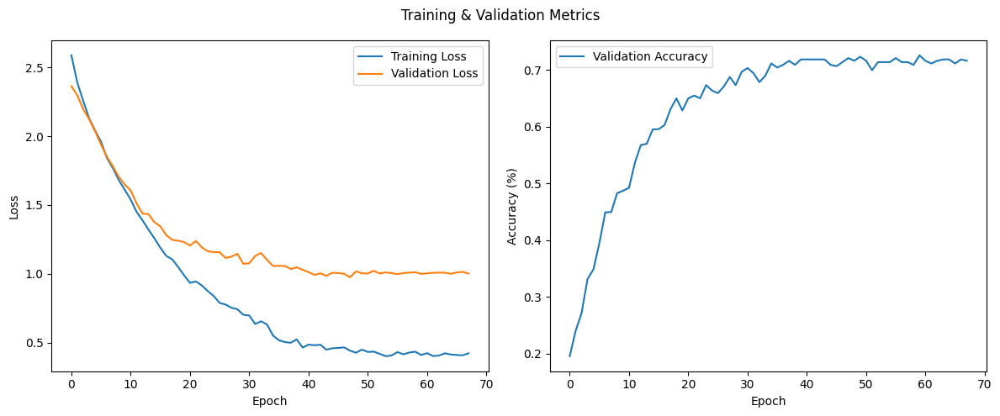

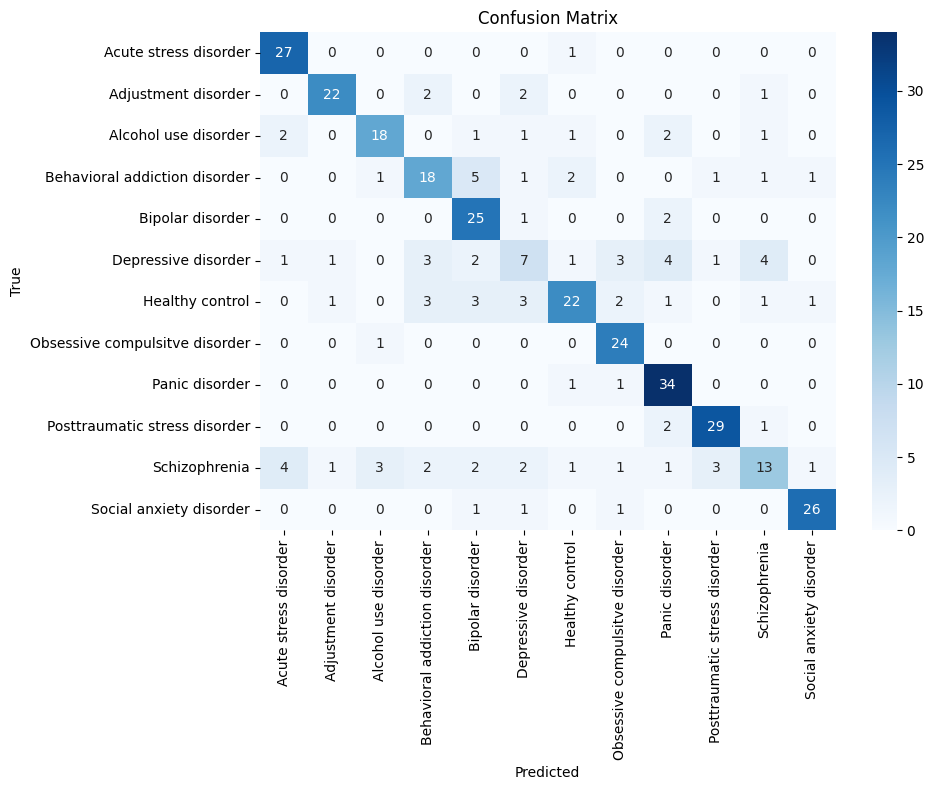

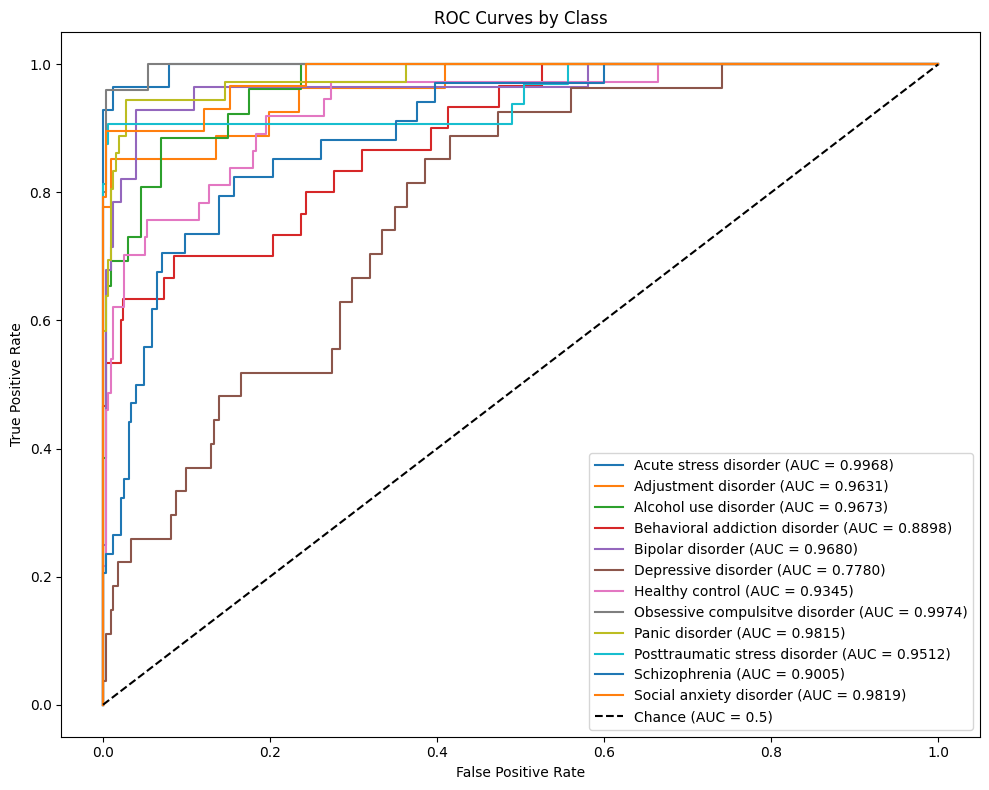

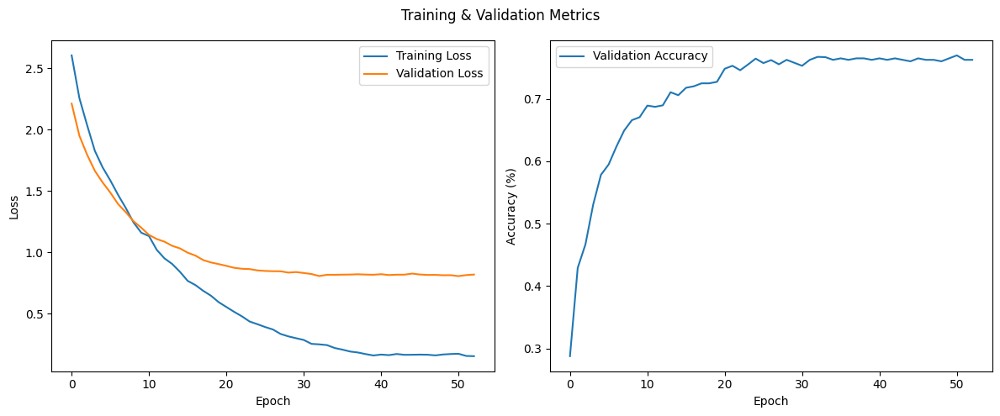

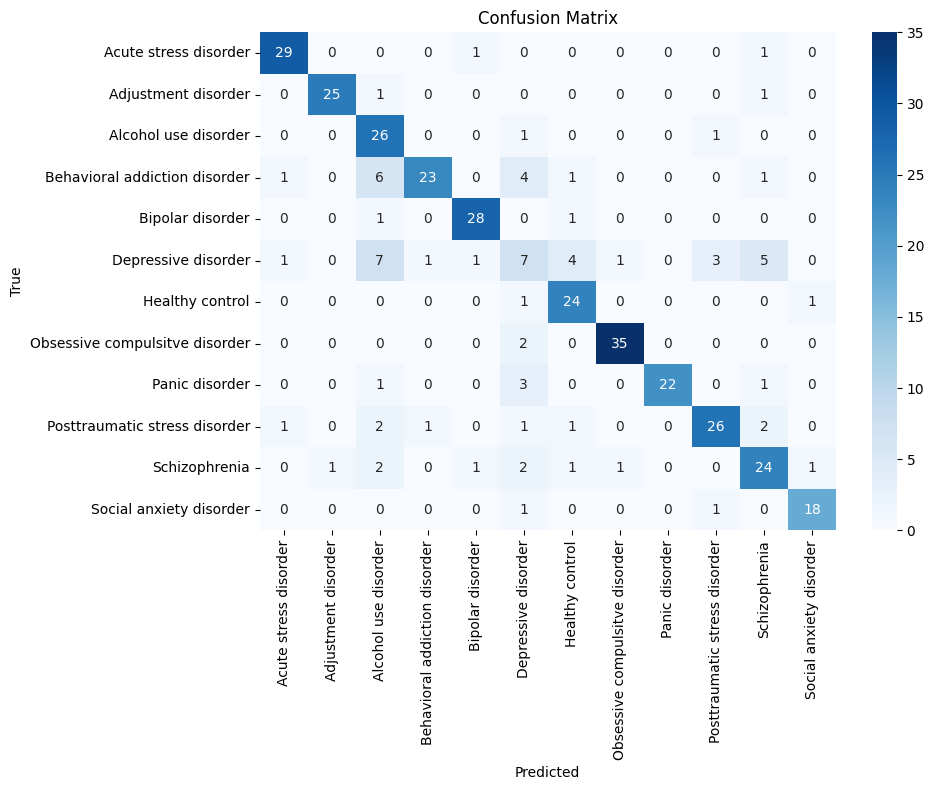

...

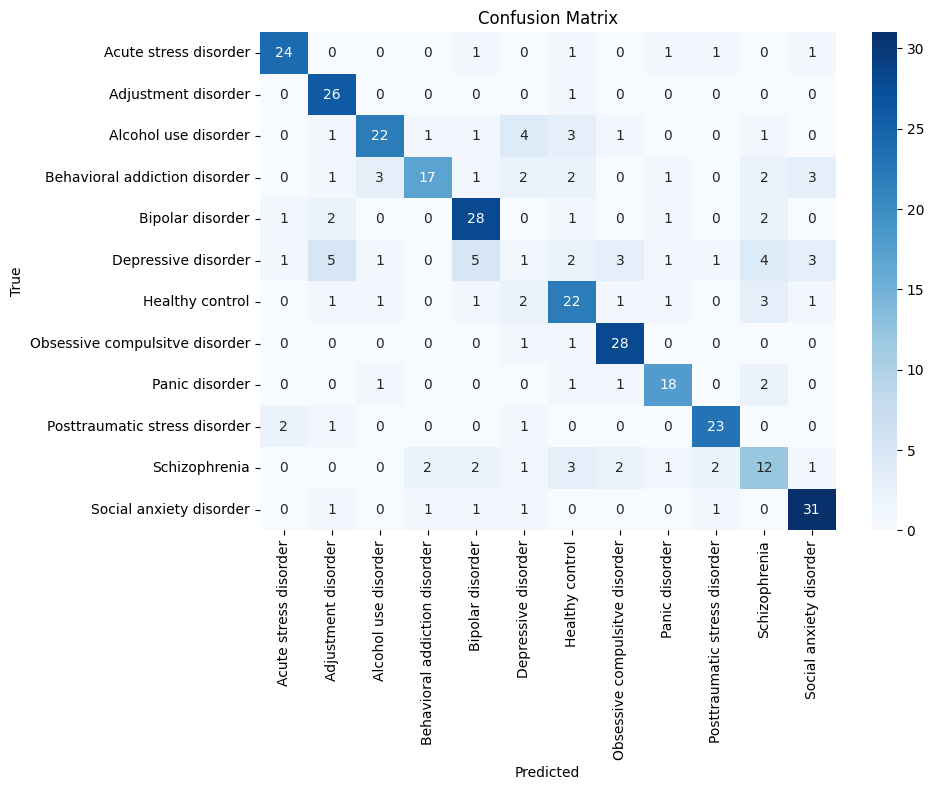

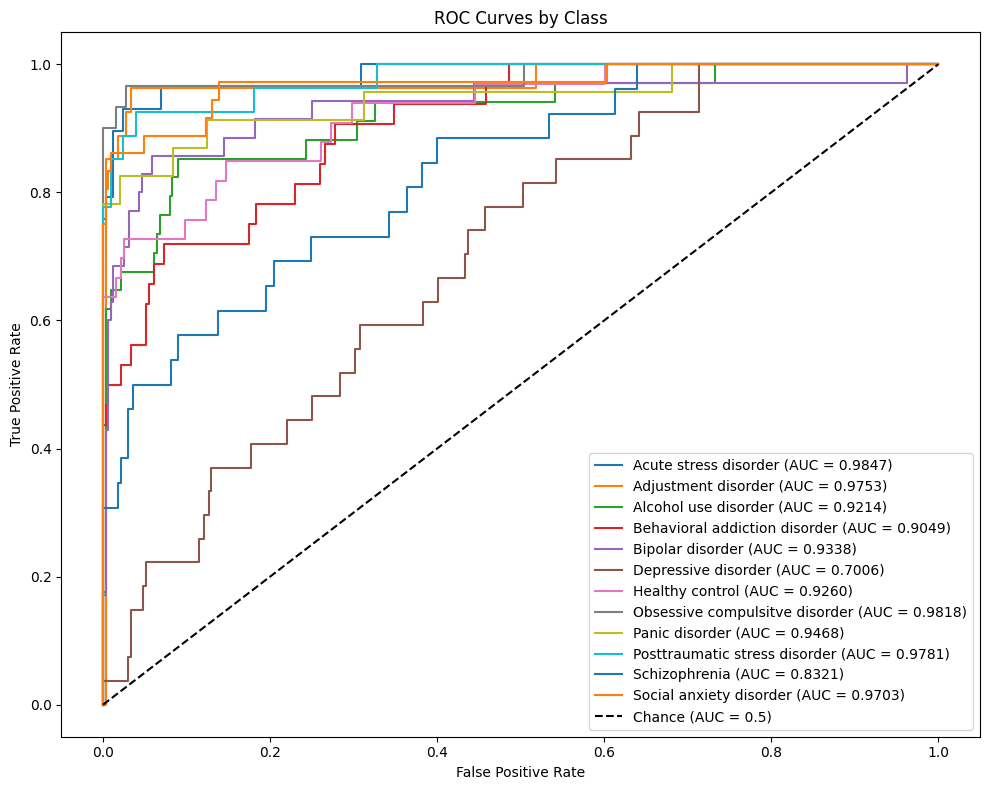

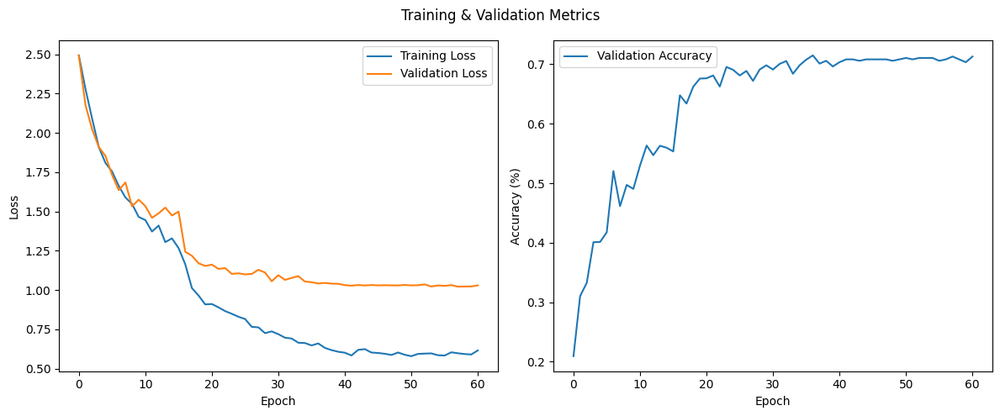

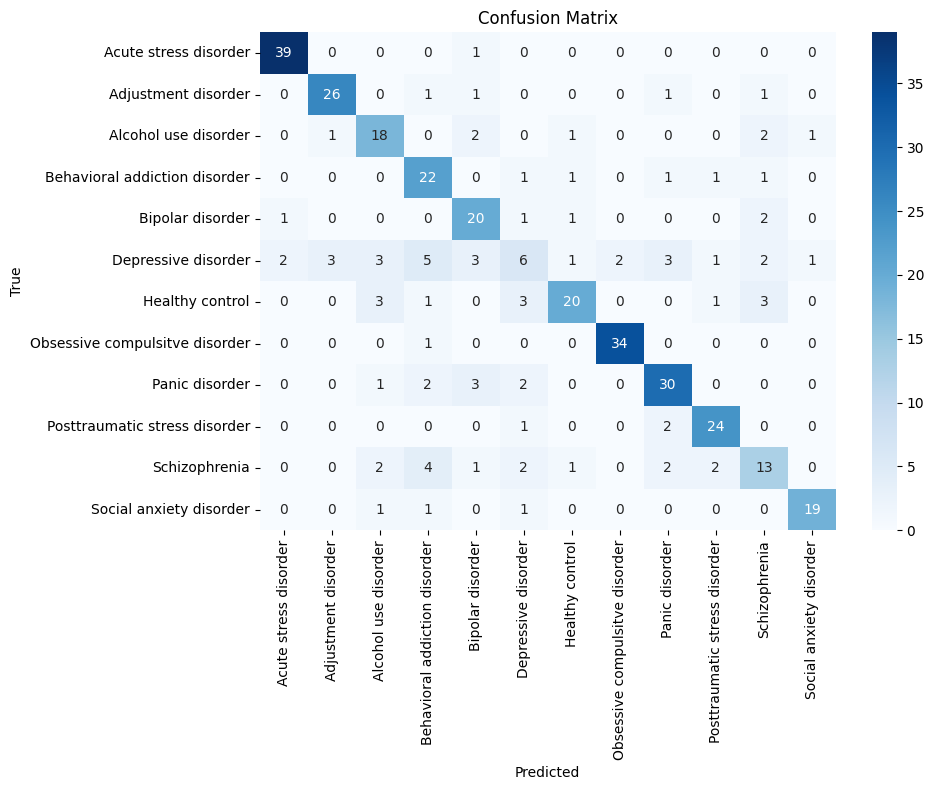

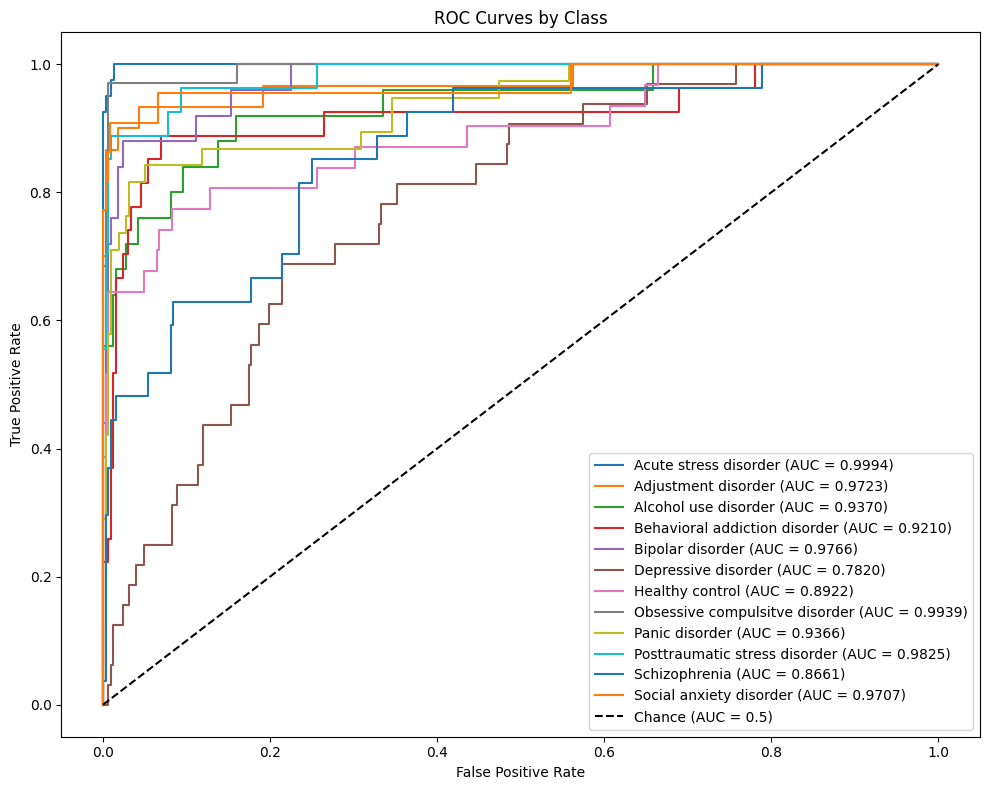

In [38]:
for group_name, result_dict in all_result_sets:
    for subset_name, data in result_dict.items():
        best_results = data["best_results"]
        
        fig_curves = best_results["fig_curves"]
        fig_conf_matrix = best_results["fig_conf_matrix"]
        fig_roc = best_results["fig_roc"]

        # fig_curves.savefig(f"{group_name}_{subset_name}_training_curves.png")
        # fig_conf_matrix.savefig(f"{group_name}_{subset_name}_confusion_matrix.png")
        # fig_roc.savefig(f"{group_name}_{subset_name}_roc_curve.png")
        
        display(HTML("<hr>"))
        display(HTML(f"<h2>{group_name} - {subset_name}</h2>"))
        display(fig_curves)
        display(fig_conf_matrix)
        display(fig_roc)

## | 7. Conclusions, Problems, and Limitations

[need to update]

* The class imbalance is evident for the multiclasses of the main.disorder variable. The SMOTE technique was applied to balance the classes and perform data augmentation.

* The data pre-processed with PSD and FC generated 1140 features. PCA with 99% variance was applied to the data, and thus 223 principal components were extracted.

* To avoid overfitting, techniques such as dropout, batch normalization, and early stopping were applied.

* The weights were initialized in the network with xavier_uniform.

* The network has convergence issues due to the high variability of the data. Despite using PCA, there were no significant improvements in performance compared to using all features from PSD and FC.

* Due to the enrichment of the data, the minority class obsessive compulsive disorder shows a tendency to overfitting, as the original data was 46 and increased to 266 with Euclidean distance.